In [1]:
library(patchwork)
library(purrr)
library(dplyr) 
library(tidyr)
library(cowplot)
library(singlecellmethods)
library(ggplot2)
library(ggbeeswarm)
library(stringr)
library(viridis)

source("/data/srlab/anathan/scripts/scseq_utils.R")

library(Matrix)

library(MASS)

library(future)
library(future.apply)



library(tidyverse)

library(pheatmap)

library(cividis)



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘cowplot’


The following object is masked from ‘package:patchwork’:

    align_plots


Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose



Attaching package: ‘singlecellmethods’


The following object is masked from ‘package:base’:

    rowMeans


Loading required package: viridisLite


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


The following object is masked from ‘package:patchwork’:

    area


── Attaching core tidyverse packages 

In [17]:
#' Create a quantile-quantile plot with ggplot2.
#'
#' Assumptions:
#'   - Expected P values are uniformly distributed.
#'   - Confidence intervals assume independence between tests.
#'     We expect deviations past the confidence intervals if the tests are
#'     not independent.
#'     For example, in a genome-wide association study, the genotype at any
#'     position is correlated to nearby positions. Tests of nearby genotypes
#'     will result in similar test statistics.
#'
#' @param ps Vector of p-values.
#' @param ci Size of the confidence interval, 95% by default.
#' @return A ggplot2 plot.
#' @examples
#' library(ggplot2)
#' gg_qqplot(runif(1e2)) + theme_grey(base_size = 24)
gg_qqplot <- function(ps, ci = 0.95) {
  n  <- length(ps)
  df <- data.frame(
    observed = -log10(sort(ps)),
    expected = -log10(ppoints(n)),
    clower   = -log10(qbeta(p = (1 - ci) / 2, shape1 = 1:n, shape2 = n:1)),
    cupper   = -log10(qbeta(p = (1 + ci) / 2, shape1 = 1:n, shape2 = n:1))
  )
  log10Pe <- expression(paste("Expected -log"[10], plain(P)))
  log10Po <- expression(paste("Observed -log"[10], plain(P)))
  ggplot(df) +
    geom_ribbon(
      mapping = aes(x = expected, ymin = clower, ymax = cupper),
      alpha = 0.1
    ) +
    geom_point(aes(expected, observed), shape = 1, size = 3) +
    geom_abline(intercept = 0, slope = 1, alpha = 0.5) +
    # geom_line(aes(expected, cupper), linetype = 2, size = 0.5) +
    # geom_line(aes(expected, clower), linetype = 2, size = 0.5) +
    xlab(log10Pe) +
    ylab(log10Po)
}


In [2]:
labelfontsize = 20
tickfontsize = 16

figdir = '../../figures/components/'
outdir = '../../data/tissue/'

In [3]:
pseudobulk <- function(counts, groups) {
    colnames(counts) = groups
    
    # Convert group labels into a sparse indicator matrix
    group_levels <- unique(groups)
    group_matrix <- sparseMatrix(
      i = match(groups, group_levels), 
      j = seq_len(length(groups)), 
    )

    # Perform sparse matrix multiplication to sum within groups
    pseudo_raw <- group_matrix %*% (counts %>% t)

    # Assign row names to match groups
    rownames(pseudo_raw) <- group_levels

    pseudo_raw = pseudo_raw %>% t
    
    return(pseudo_raw)
    
}

In [4]:
getwd()

[1] "/data/srlab/ssg34/SLE_kidney_v2/scripts/figure_notebooks"

In [6]:
immune_ctypes = c('T/NK', 'B/Plasma', 'Myeloid')

In [7]:
raw_tissue_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
qcd_raw_tissue = readRDS(raw_tissue_fn)

In [6]:
parallel::detectCores()
plan(multicore, workers = 20)

[1] 96

In [8]:
parallel::detectCores()
plan(multisession, workers = 20)

[1] 96

In [7]:
# ndonor_thresh = round(nrow(sample_meta)*.9) #round(nrow(sample_meta)/2)
genecount_thresh = 1
pseudocount = .1

In [8]:
celltypes = c('T/NK', 'B/Plasma', 'Myeloid', 'Glomerular', 'Interstitial/Stromal', 'Loop of Henle',
             'Distal Nephron', 'Proximal Tubule')

ctype_list = list()

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations02062024.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/t_nk/chronicity/sc_meta.csv'
raw_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_rawcounts_03062023.rds'
raw_fn_pbmc = '/data/srlab/ssg34/SLE_pbmc_analysis/data/gene_expression/t_nk_qcd_seurat_sc_analysis_08252023.rds'
meta_fn_pbmc = '/data/srlab/ssg34/SLE_kidney_v2/data/pbmc/SLE_t_nk_pbmc_metadata_filtered_V0_cases_controls_07182024.rds'
name = 'tnk'
ctype_list[['T/NK']] = c(meta_fn, raw_fn, name, meta_cr_fn, raw_fn_pbmc, meta_fn_pbmc)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_annotations_09232022.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/b_plasma/chronicity/sc_meta.csv'
raw_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/B_Plasma_clusterQCd_rawcounts_03102023.rds'
raw_fn_pbmc = '/data/srlab/ssg34/SLE_pbmc_analysis/data/gene_expression/b_cell_qcd_seurat_sc_analysis_08252023.rds'
meta_fn_pbmc = '/data/srlab/ssg34/SLE_kidney_v2/data/pbmc/SLE_b_cell_pbmc_metadata_filtered_V0_cases_controls_07182024.rds'
name = 'bp'
ctype_list[['B/Plasma']] = c(meta_fn, raw_fn, name, meta_cr_fn, raw_fn_pbmc, meta_fn_pbmc)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_harmonizedPCUMAPCellStateClusters_10042022.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/myeloid/chronicity/sc_meta.csv'
raw_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_rawcounts_03102023.rds'
raw_fn_pbmc = '/data/srlab/ssg34/SLE_pbmc_analysis/data/gene_expression/mono_dc_qcd_seurat_sc_analysis_08252023.rds'
meta_fn_pbmc = '/data/srlab/ssg34/SLE_kidney_v2/data/pbmc/SLE_mono_dc_pbmc_metadata_filtered_V0_cases_controls_07182024.rds'
name = 'myeloid'
ctype_list[['Myeloid']] = c(meta_fn, raw_fn, name, meta_cr_fn, raw_fn_pbmc, meta_fn_pbmc)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/tissue/glom_meta_qcd_harmony_umap_clusternames_11302023.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/GLOM/chronicity/sc_meta.csv'
raw_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
name = 'glom'
ctype_list[['Glomerular']] = c(meta_fn, raw_fn, name, meta_cr_fn)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/tissue/intl_meta_qcd_harmony_umap_clusternames_11302023.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/INTL/chronicity/sc_meta.csv'
raw_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
name = 'intl'
ctype_list[['Interstitial/Stromal']] = c(meta_fn, raw_fn, name, meta_cr_fn)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/tissue/loh_meta_qcd_harmony_umap_clusternames_11302023.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/LOH/chronicity/sc_meta.csv'
raw_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
name = 'loh'
ctype_list[['Loop of Henle']] = c(meta_fn, raw_fn, name, meta_cr_fn)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/tissue/dn_meta_qcd_harmony_umap_clusternames_11302023.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/DN/chronicity/sc_meta.csv'
raw_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
name = 'dn'
ctype_list[['Distal Nephron']] = c(meta_fn, raw_fn, name, meta_cr_fn)

meta_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/tissue/pt_meta_qcd_harmony_umap_clusternames_11302023.rds'
meta_cr_fn = '/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/PT/chronicity/sc_meta.csv'
raw_fn = '/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds'
name = 'pt'
ctype_list[['Proximal Tubule']] = c(meta_fn, raw_fn, name, meta_cr_fn)

# Case-control, by cell type

## Run differential expression

In [48]:
for (ctype in celltypes){
    print(ctype)
    qcd_meta = readRDS(ctype_list[[ctype]][1])
    if (ctype %in% immune_ctypes){
        qcd_raw = readRDS(ctype_list[[ctype]][2])
        qcd_raw <- qcd_raw[, qcd_meta$cell]
    } else {
        qcd_raw = qcd_raw_tissue[, qcd_meta$cell]
    }
    
    pseudo_raw = pseudobulk(qcd_raw, qcd_meta$sample)
    rm(qcd_raw)
    gc()
    
    ncounts = colSums(pseudo_raw)
    sample_meta = qcd_meta[!duplicated(qcd_meta$sample), ]
    rownames(sample_meta) = sample_meta$sample
    sample_meta$ncounts = ncounts
    
    ndonor_thresh = round(nrow(sample_meta)*.9)
    print(ndonor_thresh)
    genes = rownames(pseudo_raw)[rowSums(pseudo_raw >= genecount_thresh) > ndonor_thresh]
    print(length(genes))
    
    pseudo_raw = pseudo_raw[genes, rownames(sample_meta)]
    gc()
    pseudo_raw = pseudo_raw + pseudocount

    system.time(
    suppressMessages({
    suppressWarnings({
        res_list = future_lapply(genes, future.seed = TRUE, function(gene){
        res = data.frame()

        gene_expr = pseudo_raw[gene, ]

        null = glm.nb(gene_expr ~ offset(log(ncounts)), data = sample_meta)
        full = glm.nb(gene_expr ~ Type + offset(log(ncounts)), data = sample_meta)
        z =summary(full)$coefficients['TypeLN', "z value"]
        se = summary(full)$coefficients['TypeLN', "Std. Error"]
        b = summary(full)$coefficients['TypeLN', "Estimate"] #full$coefficients[['TypeLN']]
        pval = anova(full, null)[2, 'Pr(Chi)']
        res = rbind(res, data.frame('gene' = gene, 'beta' = b, 'stderr' = se, 'z-score' = z, 'p' = pval))       
        return(res)
        })})})
    )

    res = do.call("rbind", res_list)
    res['celltype'] = ctype
    res$padj = p.adjust(res$p, method = "bonferroni")

    name = ctype_list[[ctype]][3]
    # saveRDS(res, paste0(outdir, name, '_case_control_differential_expression_20250303.rds'))
    saveRDS(res, paste0(outdir, name, '_case_control_differential_expression_20250310_pseudo.rds'))
    flush.console()
}

[1] "Proximal Tubule"
[1] 212
[1] 13657


## Load results

In [12]:
res_list = list()
res_all = data.frame()

for (ctype in celltypes){
    
    name = ctype_list[[ctype]][3]
    de_fn = paste0(outdir, name, '_case_control_differential_expression_20250310_pseudo.rds')
    res = readRDS(de_fn)
    
    res_all = rbind(res_all, res)
    res_list[[ctype]] = res
    rownames(res_list[[ctype]]) = res$gene
}

In [50]:
# write_delim(res_all %>% mutate(variable = 'case-ctrl'), 
#             '../../tables/Supplementary Table 2.tsv', delim = "\t", col_names = TRUE)

In [13]:
res_all_wide = res_all %>% pivot_wider(id_cols = gene, names_from = celltype, values_from = c(beta,stderr, z.score, p, padj)) %>% as.data.frame
rownames(res_all_wide) = res_all_wide$gene

In [10]:
for (ctype in celltypes){
    print(ctype)
    print(res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta)) %>% head(20))
    print(res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(beta) %>% head(20))

}

[1] "T/NK"
             gene      beta    stderr  z.score            p celltype
PHACTR2   PHACTR2 1.4863960 0.2444543 6.080465 2.750004e-07     T/NK
IFI44L     IFI44L 1.4545735 0.2299954 6.324358 2.598978e-08     T/NK
EPSTI1     EPSTI1 1.3892557 0.1919620 7.237139 1.364397e-10     T/NK
P2RY8       P2RY8 1.2384764 0.2501932 4.950080 9.192997e-06     T/NK
SPP1         SPP1 1.2239758 0.1992600 6.142606 2.849112e-08     T/NK
MX1           MX1 1.1634765 0.2008517 5.792714 1.298671e-07     T/NK
STAT1       STAT1 1.0619566 0.1521936 6.977671 1.175382e-10     T/NK
IFI6         IFI6 1.0536887 0.1995722 5.279736 1.103502e-06     T/NK
SH2D3C     SH2D3C 1.0243811 0.1980476 5.172399 4.467532e-07     T/NK
LTB           LTB 1.0144906 0.1530671 6.627750 2.577997e-09     T/NK
ISG15       ISG15 0.9744506 0.1976267 4.930765 5.652661e-06     T/NK
XAF1         XAF1 0.9565261 0.1692779 5.650626 3.248987e-07     T/NK
DDX60       DDX60 0.9194933 0.1898565 4.843096 6.952874e-06     T/NK
EIF2AK2   EIF2AK2 0.886

In [53]:
(res_all %>% filter(padj < 0.05))$celltype %>% table

.
            B/Plasma       Distal Nephron           Glomerular 
                   6                 2375                  436 
Interstitial/Stromal        Loop of Henle              Myeloid 
                 829                 1904                  371 
     Proximal Tubule                 T/NK 
                 748                  139 

In [54]:
res_all_wide %>% head(2)

,gene,beta_T/NK,beta_B/Plasma,beta_Myeloid,beta_Glomerular,beta_Interstitial/Stromal,beta_Loop of Henle,beta_Distal Nephron,beta_Proximal Tubule,stderr_T/NK,⋯,p_Distal Nephron,p_Proximal Tubule,padj_T/NK,padj_B/Plasma,padj_Myeloid,padj_Glomerular,padj_Interstitial/Stromal,padj_Loop of Henle,padj_Distal Nephron,padj_Proximal Tubule
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ISG15,ISG15,0.97445061,NA,0.9852898,NA,1.2980772,1.3104098,1.1863824,1.1034227,0.19762665,⋯,4.258682e-05,0.0001537235,0.02131618,NA,0.6319921,NA,0.005517407,0.7341865,0.6684427,1
SDF4,SDF4,0.07983689,NA,0.1290734,0.3989658,0.2590637,0.1850735,0.2102776,0.1517855,0.09363542,⋯,2.937531e-02,0.1007383282,1.00000000,NA,1.0000000,1,1.000000000,1.0000000,1.0000000,1


## Run GSEA

In [16]:
library(msigdbr)
library(fgsea)

In [256]:
category = 'H'
hsig_df = msigdbr(species = "human", category = category)

category = 'C5'
gosig_df = msigdbr(species = "human", category = category)

genesig_df = rbind(hsig_df, gosig_df)
pathways = split(x = genesig_df$gene_symbol, f = genesig_df$gs_name)

In [257]:
parallel::detectCores()
plan(multicore, workers = 30)

[1] 96

In [258]:
pathways %>% length

[1] 15523

In [259]:
betas = res_all_wide %>% dplyr::select(starts_with('beta'))
ses = res_all_wide %>% dplyr::select(starts_with('stderr'))
vars = ses^2
weights = 1/ vars
weighted_average <- rowSums(weights * betas, na.rm = TRUE) / rowSums(weights, na.rm = TRUE) 
weighted_se <- sqrt(1 / rowSums(weights, na.rm = TRUE))
z_scores <- weighted_average / weighted_se

z_scores = z_scores %>% sort
z_scores_all = z_scores

In [62]:
# # Filter z-scores that include just 1 celltype
# single_genes = rownames(res_all_wide[rowSums(!is.na(res_all_wide %>% dplyr::select(starts_with('beta'))))==1, ])
# z_scores_filt = z_scores[setdiff(names(z_scores), single_genes)]
# z_scores_filt = z_scores_filt %>% sort

# z_scores_filt %>% length

# # Filter z-scores to include only genes significant in at least 1 celltype
# z_scores_filt = z_scores_filt[rowSums((res_all_wide[names(z_scores_filt), 
#                             ] %>% dplyr::select(starts_with('padj')))< 0.05, na.rm = TRUE) > 0]

# z_scores_filt %>% length

# z_scores_all = z_scores_filt

In [260]:
(sort(z_scores_all) %>% rev)[1:50]

S100A6   S100A11    TMSB10       FTL     ITM2B    PLAAT4      CST3      CD81 
455.63527 279.33019 195.78998 195.57321 187.01938 186.14026 164.44549 149.41713 
    HSPB1     GAPDH       B2M      FTH1       DBI   C4orf48    TMSB4X     RPL28 
144.46208 137.11962 133.57426 116.38078 116.07823 112.98699 112.86860 110.60574 
    RPS26     H3F3A     GSTP1     SERF2      PFN1     RPL12  SH3BGRL3      SSR4 
104.25685 103.10788 101.86117  95.74407  95.13112  94.31992  87.78481  86.21381 
   IFITM3     FOLR1      PTMA     PSME1     PPDPF      CD63   ATP6V1F     RAB13 
 85.78124  84.59286  81.97139  79.73999  79.46166  76.64363  75.61520  73.47785 
  S100A13      PPIC     PRDX1      NPC2      CALR  PPP1R14B    RABAC1      NME2 
 71.24184  70.65499  68.88518  68.08436  66.13320  65.14839  65.04496  64.40732 
   DYNLL1     HINT1   TMEM238       UBB   KRTCAP2   IFI27L2      CSTB      NENF 
 62.81618  61.64074  61.34991  59.84881  58.48708  57.46489  57.06606  54.88150 
     CBR1   LAMTOR2 
 53.43550  53.33807

In [261]:
(sort(z_scores_all))[1:50]

MT-CO1      MT-ND4      MT-ND5       DEFB1     MT-ND4L      MT-CYB 
-1238.37996  -949.03677  -898.76784  -877.17132  -774.78467  -550.28739 
     MT-ND2      MT-CO2       FXYD2       ACTG1        ACTB       COX7B 
 -513.38707  -437.02959  -302.71952  -243.93316  -239.37895  -188.77426 
      RPS3A        EIF1       UQCRB        CYCS       RPS24       COX7C 
 -186.69948  -183.78698  -180.49943  -174.30335  -159.24571  -156.74314 
     EEF1A1       COX6C       RPL21     SLC25A5        RPS6       RPS14 
 -151.65843  -149.98279  -149.75134  -144.18752  -144.17655  -141.88908 
       RPL9       RPL34     ATP5MC3       RPL39       COX5B       SMIM6 
 -141.84887  -140.12436  -140.09359  -139.41298  -136.91787  -131.65097 
    SLC25A3      RPS27A       APOC1      NDUFA4       EIF1B       RPL24 
 -128.11456  -113.49467  -113.32261  -111.45769  -110.69090  -110.41949 
      COX8A      ATP5MG      RPL37A     ATP5F1D      COX7A2       TOMM7 
 -109.06062  -107.69970  -106.15281  -103.46947  -103.15042  -102.76813 
     COX4I1       RPL26        RPL7        TPT1     MICOS10     SELENOK 
  -99.89216   -98.74678   -98.66950   -98.11703   -97.50641   -97.08409 
      PEBP1      ATP5MD 
  -96.69833   -95.53198

In [262]:
ranks = sort(z_scores)
ranks %>% length

[1] 17036

In [263]:
(z_scores > 0 )%>% sum
(z_scores < 0 )%>% sum

[1] 9617

[1] 7419

In [264]:
system.time(
suppressMessages({
suppressWarnings({
    gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
    gsea_res = fgsea(pathways = pathways[pathname],
                  stats    = ranks,
                  minSize  = 15,
                  maxSize  = 500) %>% as.data.frame
    return(gsea_res)
    })})})
)

gsea_res = do.call("rbind", gsea_list)
gsea_res['celltype'] = 'all'
gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

    user   system  elapsed 
1662.610  130.488   86.710 

In [265]:
saveRDS(gsea_res, paste0(outdir, 'allctype', '_case_control_gsea_20250310_pseudo.rds'))


In [266]:
rownames(gsea_res) = gsea_res$pathway

In [267]:
gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)

In [268]:
gsea_res_filt %>% arrange(desc(NES))

,pathway,pval,padj,log2err,ES,NES,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HALLMARK_INTERFERON_ALPHA_RESPONSE,HALLMARK_INTERFERON_ALPHA_RESPONSE,1.106436e-09,8.400059e-06,0.7881868,0.8380542,2.468824,all
HALLMARK_INTERFERON_GAMMA_RESPONSE,HALLMARK_INTERFERON_GAMMA_RESPONSE,2.754759e-11,2.091413e-07,0.8634154,0.7503679,2.443386,all
GOMF_CALCIUM_DEPENDENT_PROTEIN_BINDING,GOMF_CALCIUM_DEPENDENT_PROTEIN_BINDING,6.464237e-06,4.907649e-02,0.6105269,0.8534967,2.404100,all
GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS,GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS,6.238225e-07,4.736060e-03,0.6594444,0.8198396,2.351470,all
GOBP_REGULATION_OF_VIRAL_PROCESS,GOBP_REGULATION_OF_VIRAL_PROCESS,1.756487e-06,1.333525e-02,0.6435518,0.7254924,2.221786,all
GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX,GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX,3.140896e-07,2.384569e-03,0.6749629,0.6115334,2.125342,all
GOCC_ENDOPLASMIC_RETICULUM_LUMEN,GOCC_ENDOPLASMIC_RETICULUM_LUMEN,1.937528e-06,1.470971e-02,0.6272567,0.6231647,2.125063,all
GOCC_EXTERNAL_ENCAPSULATING_STRUCTURE,GOCC_EXTERNAL_ENCAPSULATING_STRUCTURE,4.155689e-07,3.154999e-03,0.6749629,0.5811533,2.034515,all
GOBP_RESPONSE_TO_VIRUS,GOBP_RESPONSE_TO_VIRUS,4.514664e-06,3.427533e-02,0.6105269,0.5818088,2.007453,all


In [75]:
ctype
name

[1] "Proximal Tubule"

[1] "pt"

In [269]:
for (ctype in celltypes){
    print(ctype)
    name = ctype_list[[ctype]][3]
    
    z_scores = setNames((res_list[[ctype]])[['z.score']], 
                rownames((res_list[[ctype]])))
    z_scores = sort(z_scores)
    ranks = z_scores
    print(length(ranks))
    
    
    system.time(
    suppressMessages({
    suppressWarnings({
        gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
        gsea_res = fgsea(pathways = pathways[pathname],
                      stats    = ranks,
                      minSize  = 15,
                      maxSize  = 500) %>% as.data.frame
        return(gsea_res)
        })})})
    )

    gsea_res = do.call("rbind", gsea_list)
    gsea_res['celltype'] = name
    gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

    saveRDS(gsea_res, paste0(outdir, name, '_case_control_gsea_20250310_pseudo.rds'))
    flush.console()
}

[1] "T/NK"
[1] 3771
[1] "B/Plasma"
[1] 229
[1] "Myeloid"
[1] 5559
[1] "Glomerular"
[1] 7458
[1] "Interstitial/Stromal"
[1] 10671
[1] "Loop of Henle"
[1] 14726
[1] "Distal Nephron"
[1] 15696
[1] "Proximal Tubule"
[1] 13657


In [270]:
for (ctype in celltypes){
    print(ctype)
    name = ctype_list[[ctype]][3]
    
    z_scores = setNames((res_list[[ctype]])[['z.score']], 
                rownames((res_list[[ctype]])))
    z_scores = sort(z_scores)

    
    overlap = intersect(names(z_scores_all), names(z_scores))
    model = lm(z_scores[overlap] ~ z_scores_all[overlap])
    resid = residuals(model)
    ranks = sort(resid)
    print(length(ranks))
    
    system.time(
    suppressMessages({
    suppressWarnings({
        gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
        gsea_res = fgsea(pathways = pathways[pathname],
                      stats    = ranks,
                      minSize  = 15,
                      maxSize  = 500) %>% as.data.frame
        return(gsea_res)
        })})})
    )

    gsea_res = do.call("rbind", gsea_list)
    gsea_res['celltype'] = paste0('resid_', name)
    gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

    saveRDS(gsea_res, paste0(outdir, 'resid_', name, '_case_control_gsea_20250310_pseudo.rds'))
    flush.console()
}

[1] "T/NK"
[1] 3771
[1] "B/Plasma"
[1] 229
[1] "Myeloid"
[1] 5559
[1] "Glomerular"
[1] 7458
[1] "Interstitial/Stromal"
[1] 10671
[1] "Loop of Henle"
[1] 14726
[1] "Distal Nephron"
[1] 15696
[1] "Proximal Tubule"
[1] 13657


In [23]:
gsea_list = list()
gsea_all = data.frame()
for (ctype in celltypes){
    name = ctype_list[[ctype]][3]
    gsea_res = readRDS(paste0(outdir, name, '_case_control_gsea_20250310_pseudo.rds'))
    gsea_res['celltype_rename'] = ctype
    gsea_list[[ctype]] = gsea_res
    gsea_all = rbind(gsea_all, gsea_res)
    
    print(ctype)
    gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)
    print(gsea_res_filt %>% arrange(desc(NES)))
}
gsea_res = readRDS(paste0(outdir, 'allctype', '_case_control_gsea_20250310_pseudo.rds'))
gsea_res['celltype_rename'] = 'All'
gsea_list[['all']] = gsea_res
gsea_all = rbind(gsea_all, gsea_res)

[1] "T/NK"
                                             pathway         pval         padj
1                 HALLMARK_INTERFERON_ALPHA_RESPONSE 4.527115e-09 1.771007e-05
2                 GOBP_RESPONSE_TO_TYPE_I_INTERFERON 7.937370e-07 3.105099e-03
3                 HALLMARK_INTERFERON_GAMMA_RESPONSE 2.106528e-08 8.240739e-05
4                                 HP_AORTIC_ANEURYSM 2.220522e-06 8.686683e-03
5                    HP_ABNORMAL_ARTERIAL_PHYSIOLOGY 1.079225e-05 4.221930e-02
6                  GOBP_DEFENSE_RESPONSE_TO_SYMBIONT 8.233721e-06 3.221032e-02
7                                HP_VENTRICULOMEGALY 1.841514e-07 7.204005e-04
8               GOCC_PERINUCLEAR_REGION_OF_CYTOPLASM 4.292327e-08 1.679158e-04
9     GOBP_REGULATION_OF_RESPONSE_TO_BIOTIC_STIMULUS 1.092642e-05 4.274416e-02
10         HP_ABNORMAL_CEREBRAL_VENTRICLE_MORPHOLOGY 1.183037e-07 4.628042e-04
11                            HP_LANGUAGE_IMPAIRMENT 6.720063e-06 2.628889e-02
12          GOBP_REGULATION_OF_CELLULAR_L

In [24]:
gsea_list_resid = list()
gsea_all_resid = data.frame()
for (ctype in celltypes){
    name = ctype_list[[ctype]][3]
    gsea_res = readRDS(paste0(outdir, 'resid_', name, '_case_control_gsea_20250310_pseudo.rds'))
    gsea_res['celltype_rename'] = ctype
    gsea_list_resid[[ctype]] = gsea_res
    gsea_all_resid = rbind(gsea_all_resid, gsea_res)
    
    print(ctype)
    gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)
    print(gsea_res_filt %>% arrange(desc(NES)))
}

[1] "T/NK"
                                             pathway         pval         padj
1                 HALLMARK_INTERFERON_ALPHA_RESPONSE 2.432306e-09 9.515181e-06
2                 GOBP_RESPONSE_TO_TYPE_I_INTERFERON 1.897410e-06 7.422668e-03
3                 HALLMARK_INTERFERON_GAMMA_RESPONSE 7.091038e-08 2.774014e-04
4                                HP_VENTRICULOMEGALY 5.988309e-09 2.342626e-05
5          HP_ABNORMAL_CEREBRAL_VENTRICLE_MORPHOLOGY 2.812386e-08 1.100205e-04
6               GOCC_PERINUCLEAR_REGION_OF_CYTOPLASM 4.878281e-06 1.908383e-02
7           HP_ABNORMALITY_OF_THE_CEREBRAL_SUBCORTEX 2.646991e-06 1.035503e-02
8                  HP_UPPER_MOTOR_NEURON_DYSFUNCTION 1.688089e-06 6.603806e-03
9                                HP_GAIT_DISTURBANCE 1.106048e-05 4.326858e-02
10                       GOMF_RIBONUCLEOTIDE_BINDING 1.299018e-06 5.081760e-03
11                      GOBP_NCRNA_METABOLIC_PROCESS 9.840542e-06 3.849620e-02
12  GOBP_CELLULAR_MACROMOLECULE_BIOSYNTHE

## Visualize results

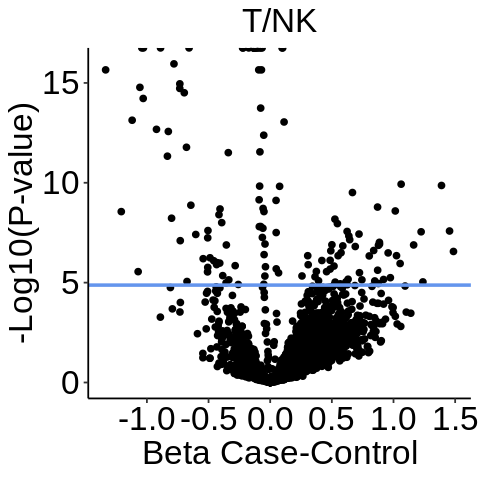

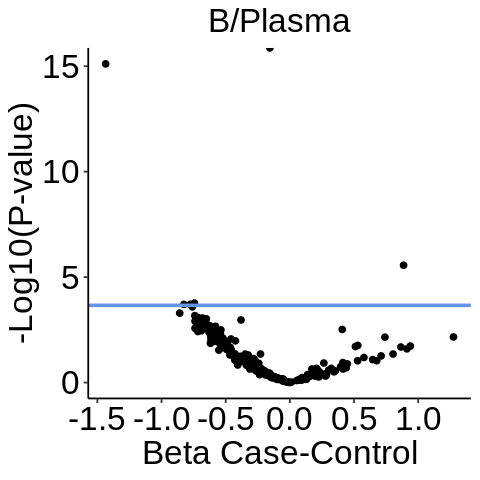

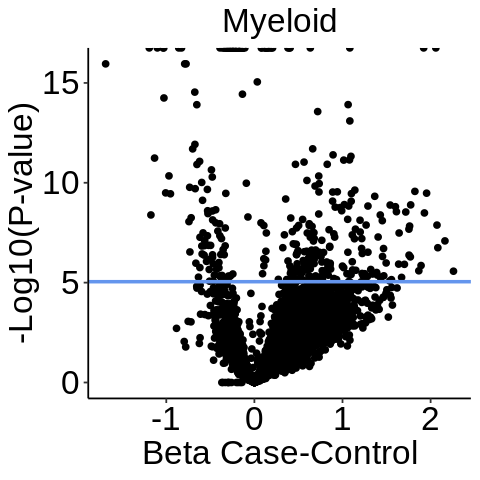

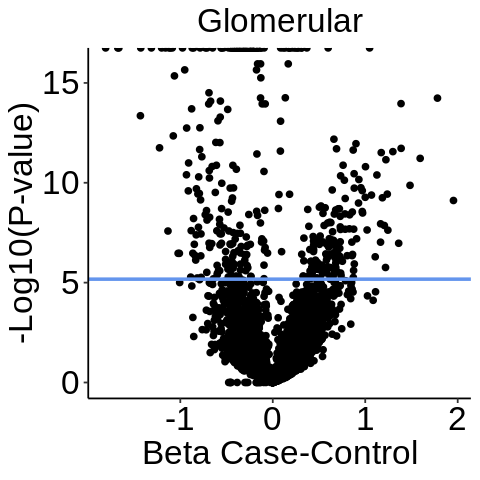

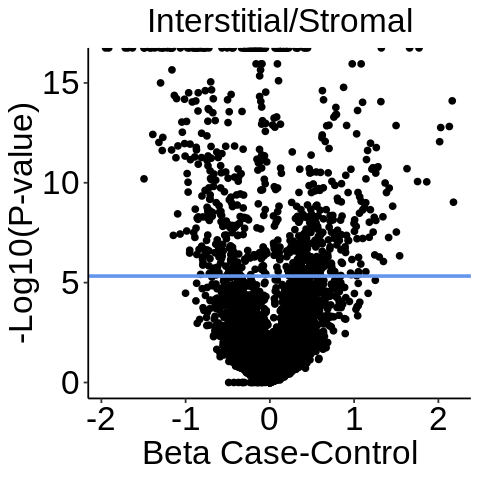

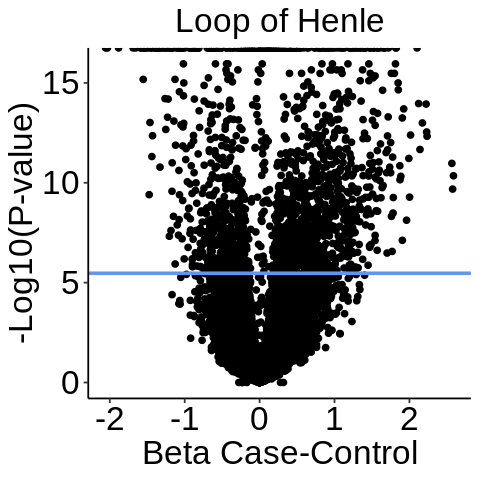

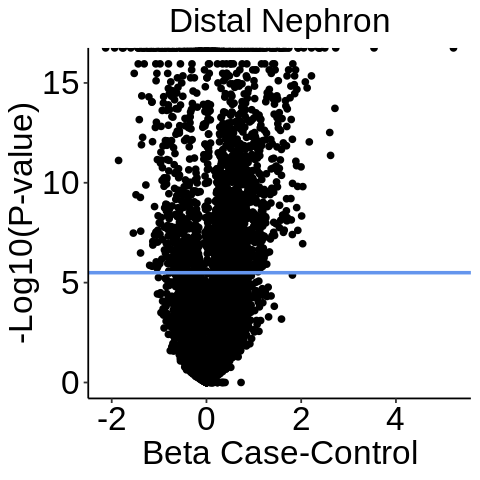

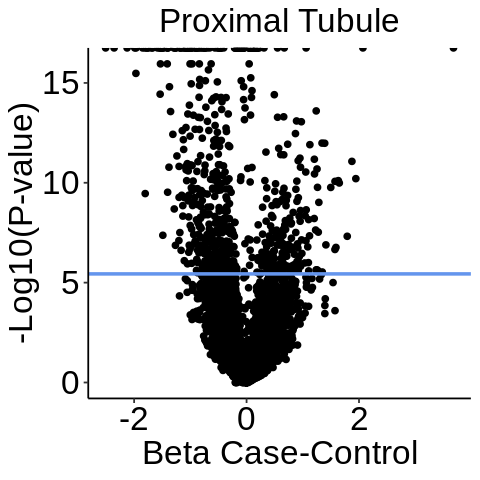

In [13]:
for (ctype in celltypes){
    res = res_list[[ctype]]
        
    fig.size(4, 4)
    p = ggplot(res)+
        geom_point(aes(x = beta, y = -log10(p)))+
        theme_classic()+
        theme(text=element_text(family="Arial"),
        legend.position = "none",
        panel.grid = element_blank(),
        axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
        axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
        axis.title = element_text(size=labelfontsize, hjust = 0.5),
        plot.title = element_text(size=labelfontsize, hjust = 0.5),
        )+
        geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue', linewidth = 1)+
        labs(x = 'Beta Case-Control', y = '-Log10(P-value)', title = ctype)
    print(p)
}

In [19]:
nctypes = 4

genelist = ((res_all %>% filter(padj < 0.05, beta > 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_up_all = genelist

sig_up_all

genelist = ((res_all %>% filter(padj < 0.05, beta < 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_down_all = genelist

sig_down_all

[1] "ABCA1"     "ADAR"      "BTN3A2"    "DDX58"     "DDX60"     "DDX60L"   
 [7] "DTX3L"     "EIF2AK2"   "EPSTI1"    "FTH1"      "FTL"       "GAPDH"    
[13] "HERC6"     "HIST1H2AC" "IFI44"     "IFI44L"    "IFI6"      "IFIT1"    
[19] "MVP"       "MX1"       "NOP10"     "OAS1"      "OAS3"      "PARP14"   
[25] "PARP9"     "RNF213"    "SAMD9L"    "SERF2"     "SH3BGRL3"  "SPATS2L"  
[31] "SPP1"      "STAT1"     "TAPBP"     "TNFSF10"   "TRIM25"    "TXNDC17"  
[37] "UQCR10"    "XAF1"

[1] "BAIAP2"  "BTF3"    "CHCHD2"  "CPM"     "EIF1"    "ERRFI1"  "FAU"    
 [8] "FBXO21"  "FKBP5"   "KLF9"    "LONRF1"  "MT-ND5"  "NACA"    "NFKBIA" 
[15] "PDK4"    "PER1"    "PPP1R10" "RPL10"   "RPL10A"  "RPL11"   "RPL13"  
[22] "RPL14"   "RPL15"   "RPL17"   "RPL18"   "RPL18A"  "RPL21"   "RPL22"  
[29] "RPL23"   "RPL23A"  "RPL24"   "RPL26"   "RPL27"   "RPL27A"  "RPL30"  
[36] "RPL32"   "RPL34"   "RPL35"   "RPL35A"  "RPL36A"  "RPL37"   "RPL37A" 
[43] "RPL38"   "RPL39"   "RPL41"   "RPL6"    "RPL7"    "RPL7A"   "RPL9"   
[50] "RPS11"   "RPS12"   "RPS13"   "RPS14"   "RPS15"   "RPS15A"  "RPS18"  
[57] "RPS21"   "RPS23"   "RPS24"   "RPS25"   "RPS27"   "RPS27A"  "RPS28"  
[64] "RPS29"   "RPS3"    "RPS3A"   "RPS4X"   "RPS5"    "RPS6"    "RPS7"   
[71] "RPS8"    "TACC1"   "TOB2"    "TPT1"    "TSC22D3" "UBA52"   "UQCRB"  
[78] "ZBTB16"  "ZFAND5"

In [301]:
# (sort(z_scores_all) %>% rev)[1:50] %>% names

[1] "S100A6"   "S100A11"  "TMSB10"   "FTL"      "ITM2B"    "PLAAT4"  
 [7] "CST3"     "CD81"     "HSPB1"    "GAPDH"    "B2M"      "FTH1"    
[13] "DBI"      "C4orf48"  "TMSB4X"   "RPL28"    "RPS26"    "H3F3A"   
[19] "GSTP1"    "SERF2"    "PFN1"     "RPL12"    "SH3BGRL3" "SSR4"    
[25] "IFITM3"   "FOLR1"    "PTMA"     "PSME1"    "PPDPF"    "CD63"    
[31] "ATP6V1F"  "RAB13"    "PRDX1"    "NPC2"     "CALR"     "PPP1R14B"
[37] "RABAC1"   "NME2"     "DYNLL1"   "HINT1"    "TMEM238"  "UBB"     
[43] "KRTCAP2"  "IFI27L2"  "CSTB"     "NENF"     "CBR1"     "LAMTOR2" 
[49] "TRAPPC1"  "VAMP8"

In [302]:
# (sort(z_scores_all))[1:50] %>% names

[1] "MT-CO1"  "MT-ND4"  "MT-ND5"  "DEFB1"   "MT-ND4L" "MT-CYB"  "MT-ND2" 
 [8] "MT-CO2"  "FXYD2"   "ACTG1"   "ACTB"    "COX7B"   "RPS3A"   "EIF1"   
[15] "UQCRB"   "CYCS"    "RPS24"   "COX7C"   "EEF1A1"  "COX6C"   "RPL21"  
[22] "SLC25A5" "RPS6"    "RPS14"   "RPL9"    "RPL34"   "ATP5MC3" "RPL39"  
[29] "COX5B"   "SMIM6"   "SLC25A3" "RPS27A"  "APOC1"   "NDUFA4"  "EIF1B"  
[36] "RPL24"   "COX8A"   "ATP5MG"  "RPL37A"  "ATP5F1D" "COX7A2"  "TOMM7"  
[43] "COX4I1"  "RPL26"   "RPL7"    "TPT1"    "MICOS10" "SELENOK" "PEBP1"  
[50] "ATP5MD"

In [20]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[c(sig_up_all, sig_down_all), ]
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 117   8

In [21]:
genes_show = (res_all_wide %>% filter(gene %in% c(sig_up_all, sig_down_all))) %>% 
    dplyr::select(starts_with('beta')) %>% rowMeans(na.rm = TRUE) %>% sort %>% rev %>% names

dat = res_all %>% filter(gene %in% c(sig_up_all, sig_down_all))
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 859   7

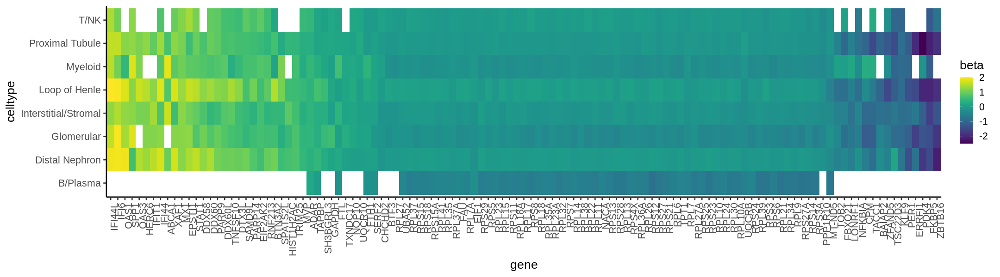

In [19]:
fig.size(5, 18)
ggplot(dat)+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_viridis()+
    theme_classic(base_size = tickfontsize)+
    theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [20]:
c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)]) 

[1] "IFI44L"  "IFI6"    "OAS1"    "SPP1"    "OAS3"    "HERC6"   "IFIT1"  
 [8] "IFI44"   "ABCA1"   "XAF1"    "CPM"     "TACC1"   "BAIAP2"  "ZFAND5" 
[15] "TSC22D3" "KLF9"    "PER1"    "ERRFI1"  "PDK4"    "FKBP5"   "ZBTB16"

Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


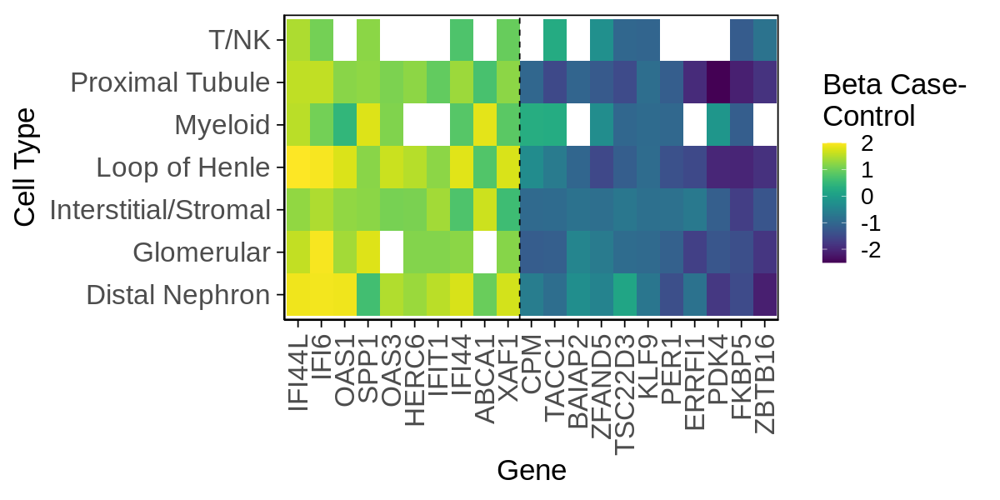

In [21]:
de_plot = ggplot(dat %>% filter(gene %in% c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)])))+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_viridis()+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1)) +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta Case-\nControl')+
    geom_vline(xintercept = 10.5, linetype = 'dashed')


height = 5
width = 10

fig.size(height, width)
outplot = de_plot
outplot

ggsave(paste0(figdir, 'de_gene_heatmap_casectrl.png'), plot = outplot,  
       height = height, width = width, dpi = 500)
ggsave(paste0(figdir, 'de_gene_heatmap_casectrl.pdf'), plot = outplot,  
       height = height, width = width, dpi = 500, device = cairo_pdf)



In [40]:
paths_plot = rbind(gsea_list[['all']] %>% filter(padj < 0.05) %>% 
                   arrange(desc(NES)) %>% dplyr::select(pathway, NES) %>% head(4), 
                   gsea_list[['all']] %>% filter(padj < 0.05) %>% 
                   arrange(desc(NES)) %>% dplyr::select(pathway, NES) %>% tail(4))
paths_plot = paths_plot$pathway

In [41]:
dat = gsea_all %>% filter(pathway %in% paths_plot)# %>% pivot_wider(names_from = celltype, values_from = NES, id_cols = pathway)%>% as.data.frame
# rownames(dat) = dat$pathway
dat$pathway = factor(dat$pathway, levels = rev(paths_plot))


In [42]:
map = c(setNames('All', 'all'))
for (ctype in celltypes){
    name = ctype_list[[ctype]][3]
    map = c(map, setNames(ctype, name))
}

In [43]:
dat$celltype_rename = map[dat$celltype]

In [45]:
paths_plot

[1] "HALLMARK_INTERFERON_ALPHA_RESPONSE"                      
[2] "HALLMARK_INTERFERON_GAMMA_RESPONSE"                      
[3] "GOMF_CALCIUM_DEPENDENT_PROTEIN_BINDING"                  
[4] "GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS"               
[5] "GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX"           
[6] "GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX"       
[7] "GOMF_ELECTRON_TRANSFER_ACTIVITY"                         
[8] "GOBP_ENERGY_DERIVATION_BY_OXIDATION_OF_ORGANIC_COMPOUNDS"

In [46]:
paths_plot_short = c('H_IFN_ALPHA', 'H_IFN_GAMMA', 
                    'GOMF_CALCIUM_PB', 'GOBP_NEGREG_VIR',
                     'GOCC_MITOPROT_COMP', 'GOCC_INNERMITOMEM',
                     'GOMF_ELECTRANS', 'GOBP_ENERGY_OXIDORGAN')

                     
                     # 'GOBP_TRMEM_TRANS',
                     # 'HP_ABVASC_MORPH', 'GOBP_ORG_INNERMEM', 
                     # 'GOCC_TRANS_COMP', 

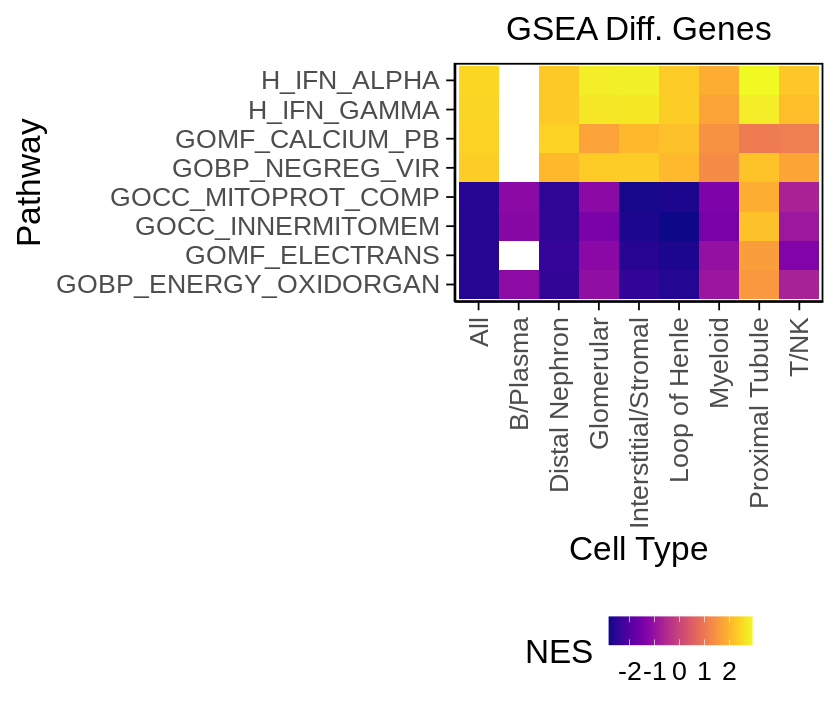

In [47]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    scale_y_discrete(labels = rev(paths_plot_short))+# Border around the panel
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 6
width = 7
fig.size(height, width)
outplot = hmap
outplot

# ggsave(paste0(figdir, 'gsea_heatmap_casectrl.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'gsea_heatmap_casectrl.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)


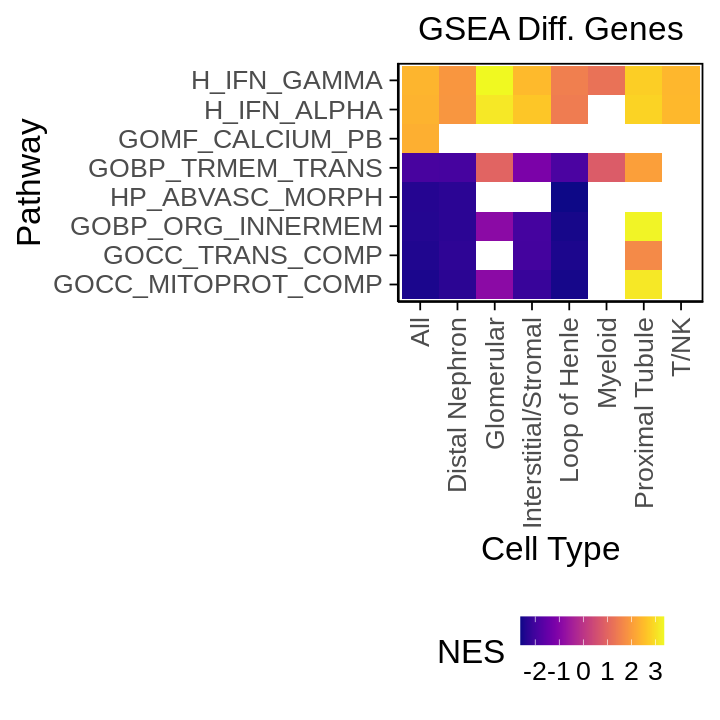

In [29]:
# hmap = ggplot(dat)+
#     geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
#     scale_fill_viridis(option = 'plasma', na.value = 'white')+
#     theme_classic(base_size = labelfontsize)+
#     theme(text = element_text(family = "Arial"), 
#           plot.title = element_text(hjust = 0.5, size = labelfontsize),
#           axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
#           axis.text = element_text(size = tickfontsize),
#           axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
#           axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
#           panel.border = element_rect(color = "black", fill = NA, size = 1),
#          legend.position = 'bottom') + 
#     scale_y_discrete(labels = rev(paths_plot_short))+# Border around the panel
#     labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes')
#     # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

# height = 6
# width = 6
# fig.size(height, width)
# outplot = hmap
# outplot

# # ggsave(paste0(figdir, 'gsea_heatmap_casectrl.png'), plot = outplot,  
# #        height = height, width = width, dpi = 500)
# # ggsave(paste0(figdir, 'gsea_heatmap_casectrl.pdf'), plot = outplot,  
# #        height = height, width = width, dpi = 500, device = cairo_pdf)


In [ ]:
res_list

In [19]:
no_dups = table((gsea_all_resid %>% filter(padj < 0.05, NES  >0))$pathway
               )[table((gsea_all_resid %>% filter(padj < 0.05, NES  >0))$pathway)==1] %>% names

In [29]:
paths_plot = c()
for (ctype in celltypes){
    paths_ctype = (gsea_all_resid %>% filter(pathway %in% no_dups,padj < 0.05, NES >0, celltype_rename == ctype) %>% 
                   arrange(desc(NES)) %>% head(4))$pathway
    paths_plot = c(paths_plot, paths_ctype)
    # paths_plot = c(paths_plot, (gsea_list_resid[[ctype]] %>% filter(padj < 0.05, , NES > 0) %>% arrange(desc(NES)) %>% head(4))$pathway)
    # print(ctype)
    # print(paths_plot)
}

In [30]:
paths_plot

[1] "GOBP_RESPONSE_TO_TYPE_I_INTERFERON"                                          
 [2] "HP_VENTRICULOMEGALY"                                                         
 [3] "HP_ABNORMAL_CEREBRAL_VENTRICLE_MORPHOLOGY"                                   
 [4] "GOCC_PERINUCLEAR_REGION_OF_CYTOPLASM"                                        
 [5] "GOCC_CHROMOSOME"                                                             
 [6] "GOBP_POSITIVE_REGULATION_OF_RNA_METABOLIC_PROCESS"                           
 [7] "GOBP_POSITIVE_REGULATION_OF_NUCLEOBASE_CONTAINING_COMPOUND_METABOLIC_PROCESS"
 [8] "GOBP_IRON_ION_HOMEOSTASIS"                                                   
 [9] "HP_ACUTE_PHASE_RESPONSE"                                                     
[10] "HP_ABNORMAL_CORPUS_STRIATUM_MORPHOLOGY"                                      
[11] "GOBP_MAINTENANCE_OF_LOCATION"                                                
[12] "HP_RETINAL_VASCULAR_TORTUOSITY"                                              
[13] "HP_CENTRAL_SCOTOMA"                                                          
[14] "HP_EPISODIC_VOMITING"                                                        
[15] "HP_PROGRESSIVE_VISUAL_LOSS"                                                  
[16] "GOBP_CYTOPLASMIC_TRANSLATION"                                                
[17] "GOCC_RIBOSOME"                                                               
[18] "GOCC_RIBOSOMAL_SUBUNIT"                                                      
[19] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"                                     
[20] "GOCC_CYTOCHROME_COMPLEX"                                                     
[21] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"                                          
[22] "GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX"                               
[23] "GOCC_RESPIRATORY_CHAIN_COMPLEX_IV"

In [69]:
# paths_plot = unique(paths_plot)

In [35]:
dat = gsea_all_resid %>% filter(pathway %in% paths_plot)# %>% pivot_wider(names_from = celltype, values_from = NES, id_cols = pathway)%>% as.data.frame
# rownames(dat) = dat$pathway
dat$pathway = factor(dat$pathway, levels = rev(paths_plot))

# dat$celltype_rename = map[dat$celltype %>% str_replace('resid_', '')]

dat$celltype_rename = factor(dat$celltype_rename, levels = celltypes)

In [31]:
length(paths_plot)

[1] 23

In [32]:
length(unique(paths_plot))

[1] 23

In [85]:
paths_plot

[1] "HALLMARK_INTERFERON_ALPHA_RESPONSE"                                          
 [2] "GOBP_RESPONSE_TO_TYPE_I_INTERFERON"                                          
 [3] "HALLMARK_INTERFERON_GAMMA_RESPONSE"                                          
 [4] "HP_VENTRICULOMEGALY"                                                         
 [5] "GOCC_CHROMOSOME"                                                             
 [6] "GOBP_POSITIVE_REGULATION_OF_RNA_METABOLIC_PROCESS"                           
 [7] "GOBP_POSITIVE_REGULATION_OF_NUCLEOBASE_CONTAINING_COMPOUND_METABOLIC_PROCESS"
 [8] "GOBP_IRON_ION_HOMEOSTASIS"                                                   
 [9] "HP_ACUTE_PHASE_RESPONSE"                                                     
[10] "HP_ABNORMAL_CORPUS_STRIATUM_MORPHOLOGY"                                      
[11] "GOBP_MAINTENANCE_OF_LOCATION"                                                
[12] "HP_RETINAL_VASCULAR_TORTUOSITY"                                              
[13] "HP_CENTRAL_SCOTOMA"                                                          
[14] "HP_EPISODIC_VOMITING"                                                        
[15] "HP_PROGRESSIVE_VISUAL_LOSS"                                                  
[16] "GOBP_INNATE_IMMUNE_RESPONSE"                                                 
[17] "GOBP_DEFENSE_RESPONSE_TO_OTHER_ORGANISM"                                     
[18] "GOBP_CYTOPLASMIC_TRANSLATION"                                                
[19] "GOCC_RIBOSOME"                                                               
[20] "GOCC_RIBOSOMAL_SUBUNIT"                                                      
[21] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"                                     
[22] "GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX"                           
[23] "GOMF_PROTON_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"                              
[24] "GOCC_RESPIRASOME"                                                            
[25] "GOCC_CYTOCHROME_COMPLEX"

In [36]:
paths_plot

[1] "HP_ABNORMALITY_OF_THE_LOWER_URINARY_TRACT"               
 [2] "HP_SHORT_DIGIT"                                          
 [3] "HP_NEOPLASM_OF_THE_GASTROINTESTINAL_TRACT"               
 [4] "GOBP_NON_MEMBRANE_BOUNDED_ORGANELLE_ASSEMBLY"            
 [5] "GOBP_GENERATION_OF_PRECURSOR_METABOLITES_AND_ENERGY"     
 [6] "GOBP_TRANSMEMBRANE_TRANSPORT"                            
 [7] "GOBP_ENERGY_DERIVATION_BY_OXIDATION_OF_ORGANIC_COMPOUNDS"
 [8] "GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX"           
 [9] "GOBP_CATION_TRANSPORT"                                   
[10] "GOCC_MEMBRANE_PROTEIN_COMPLEX"                           
[11] "GOBP_REGULATION_OF_TRANSPORT"                            
[12] "GOCC_CELL_SUBSTRATE_JUNCTION"                            
[13] "GOBP_CYTOPLASMIC_TRANSLATION"                            
[14] "GOCC_CYTOSOLIC_RIBOSOME"                                 
[15] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"                 
[16] "GOCC_RIBOSOMAL_SUBUNIT"                                  
[17] "GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX"       
[18] "GOCC_ORGANELLE_INNER_MEMBRANE"

In [41]:
paths_plot_short = c(
                     'HP_ABNORM_LOWURIN',
                     'HP_SHORT_DIGIT',
                     'HP_NEO_GASTRO',
                     'GOBP_NONMEMB_ORG',                    
                     'GOBP_PRECURS_METAB',
                     'GOBP_TRMEM_TRANS',
                     'GOBP_ENERGY_OXIDORGAN',
                     'GOCC_MITOPROT_COMP',
                     'GOBP_CATION_TRANS',
                     'GOCC_MEMPROTCOMP',
                     'GOBP_REG_TRANS',
                     'GOCC_SUB_JUNCT',
                     'GOBP_CYTO_TRANS',
                     'GOCC_CYTO_RIBO',
                     'GOMF_STRUCT_RIBO',
                     'GOCC_RIBO_SUB',
                     'GOCC_INNERMITOMEM',
                     'GOBP_ORG_INNERMEM'                    
)

In [60]:
length(paths_plot)
length(paths_plot_short)

[1] 27

[1] 8

In [506]:
# paths_plot_short = c('GOBP_NONMEMB_ORG',
#                      'HP_HEM_NEOPLASM',
#                      'HP_ABNORM_MUSCUPLIMB',
#                      'HP_SARCOMA',
#                      'GOBP_PRECURS_METAB',
#                      'GOCC_MITOPROT_COMP',
#                      'GOBP_TRMEM_TRANS',
#                      'GOBP_ENERGY_OXIDORGAN',
#                      'GOBP_CATION_TRANS',
#                      'GOCC_MEMPROTCOMP',
#                      'GOBP_REG_TRANS',
#                      'GOCC_ANCH_JUNCT',
#                      'GOBP_CYTO_TRANS',
#                      'GOCC_CYTO_RIBO',
#                      'GOCC_RIBO_SUB',
#                      'GOMF_STRUCT_RIBO',
#                      'GOBP_CILIUM_MOV',
#                      'GOCC_INNERMITOMEM',
#                      'GOBP_ORG_INNERMEM'                    
# )

Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


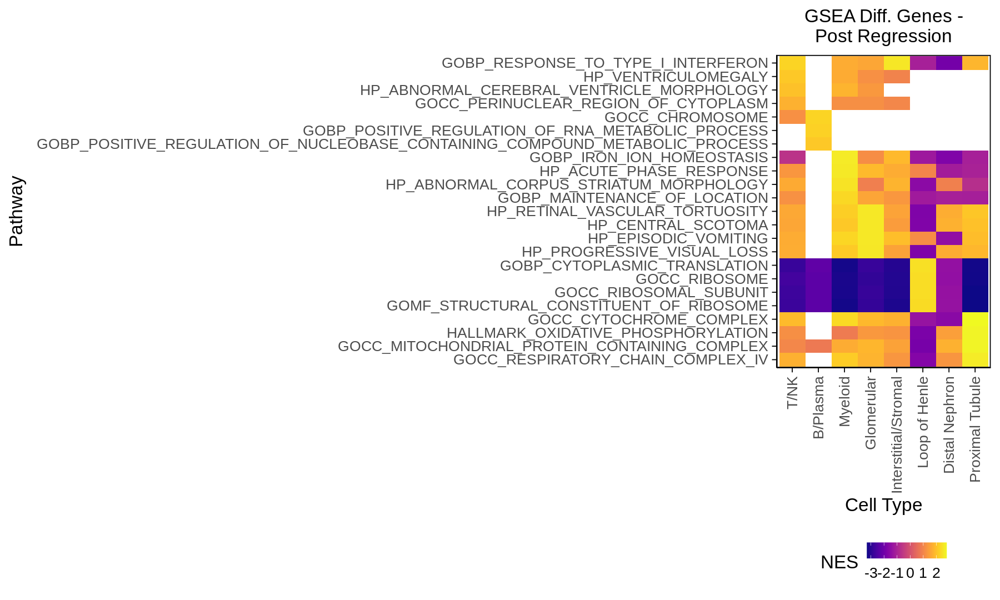

In [36]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    # scale_y_discrete(labels = rev(paths_plot_short))+
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes -\nPost Regression')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 9
width = 15
fig.size(height, width)
outplot = hmap
outplot

# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)



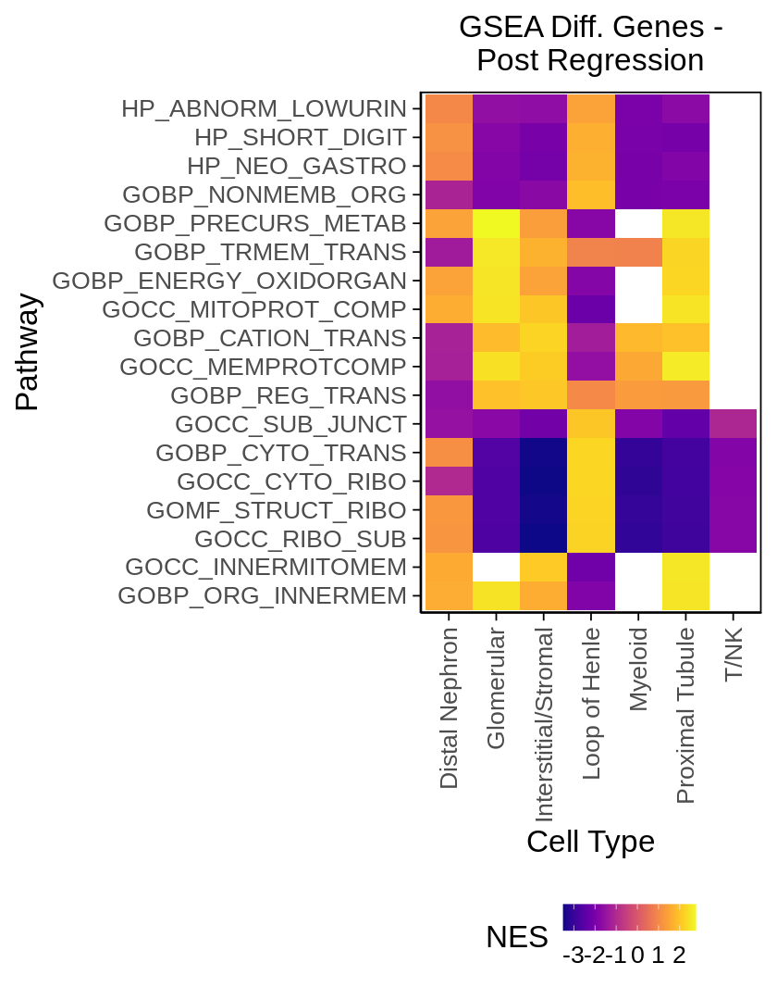

In [44]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    scale_y_discrete(labels = rev(paths_plot_short))+
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes -\nPost Regression')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 9
width = 7
fig.size(height, width)
outplot = hmap
outplot

# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)



# Chronicity, by cell type

## Run differential expression

In [31]:
celltypes[5:length(celltypes)]

[1] "Interstitial/Stromal" "Loop of Henle"        "Distal Nephron"      
[4] "Proximal Tubule"

In [162]:
ctype = celltypes[[1]]

qcd_meta = read_delim(ctype_list[[ctype]][4])


Rows: 31561 Columns: 40
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (32): Sex, new_cluster_number, Age, Final_Chronicity, Final_Activity, Fi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [11]:
qcd_meta %>% colnames

[1] "cell"                  "Sex"                   "sample"               
 [4] "new_cluster_number"    "final_annotation"      "Responder.Status"     
 [7] "Age"                   "Race"                  "Final_ISN"            
[10] "Final_Chronicity"      "Final_Activity"        "Type"                 
[13] "Final_Site"            "First_biop"            "Pred_use"             
[16] "Responder_Status"      "Race_[A]"              "Race_[A][B]"          
[19] "Race_[B]"              "Race_[B][AI]"          "Race_[B][W]"          
[22] "Race_[U]"              "Race_[W]"              "Final_ISN_[III]"      
[25] "Final_ISN_[III][V]"    "Final_ISN_[IV]"        "Final_ISN_[IV][V]"    
[28] "Final_ISN_[V]"         "Final_Site_Cincinnati" "Final_Site_Einstein"  
[31] "Final_Site_JHU"        "Final_Site_Michigan"   "Final_Site_MUSC"      
[34] "Final_Site_Northwell"  "Final_Site_NYU"        "Final_Site_Rochester" 
[37] "Final_Site_Texas Tech" "Final_Site_UCLA"       "Final_Site_UCSD"      
[40] "Final_Site_UCSF"

In [165]:
qcd_meta %>% dim

[1] 31561    40

In [13]:
qcd_meta['Final_Site'] %>% table

Final_Site
Cincinnati   Einstein        JHU   Michigan       MUSC  Northwell        NYU 
       776        746      10030         12       3176         24      14178 
 Rochester Texas Tech       UCLA       UCSD       UCSF 
      1738        115         91         69        606 

In [15]:
qcd_meta['Responder_Status'] %>% table

Responder_Status
    0     1     2 
15696  4743  4658 

In [16]:
qcd_meta['Responder.Status'] %>% table

Responder.Status
   CR  LTFU    MD    ND    NR    NS    PR 
 4658  1295   102   569 15696  4498  4743 

In [17]:
qcd_meta['First_biop'] %>% table

First_biop
    0     1 
25983  5578 

In [26]:
celltypes[2:length(celltypes)]

[1] "B/Plasma"             "Myeloid"              "Glomerular"          
[4] "Interstitial/Stromal" "Loop of Henle"        "Distal Nephron"      
[7] "Proximal Tubule"

In [56]:
# No covariate for site, adjust for treatment response

# for (ctype in celltypes[5:length(celltypes)]){
#     print(ctype)
#     qcd_meta = read_delim(ctype_list[[ctype]][4]) %>% as.data.frame
#     if (ctype %in% immune_ctypes){
#         qcd_raw = readRDS(ctype_list[[ctype]][2])
#         qcd_raw <- qcd_raw[, qcd_meta$cell]
#     } else {
#         qcd_raw = qcd_raw_tissue[, qcd_meta$cell]
#     }
    
#     pseudo_raw = pseudobulk(qcd_raw, qcd_meta$sample)
#     rm(qcd_raw)
#     gc()
    
#     ncounts = colSums(pseudo_raw)
#     sample_meta = qcd_meta[!duplicated(qcd_meta$sample), ]
#     rownames(sample_meta) = sample_meta$sample
#     sample_meta$ncounts = ncounts
    
#     ndonor_thresh = round(nrow(sample_meta)*.9)
#     print(ndonor_thresh)
#     genes = rownames(pseudo_raw)[rowSums(pseudo_raw >= genecount_thresh) > ndonor_thresh]
#     print(length(genes))
    
#     pseudo_raw = pseudo_raw[genes, ]
#     gc()
#     pseudo_raw = pseudo_raw + pseudocount

#     system.time(
#     suppressMessages({
#     suppressWarnings({
#         res_list = future_lapply(genes, future.seed = TRUE, function(gene){
#         res = data.frame()

#         gene_expr = pseudo_raw[gene, ]

#         null = glm.nb(gene_expr ~ First_biop + Responder_Status + offset(log(ncounts)), data = sample_meta)
#         full = glm.nb(gene_expr ~ First_biop + Responder_Status + Final_Chronicity + offset(log(ncounts)), data = sample_meta)
#         z =summary(full)$coefficients['Final_Chronicity', "z value"]
#         se = summary(full)$coefficients['Final_Chronicity', "Std. Error"]
#         b = summary(full)$coefficients['Final_Chronicity', "Estimate"] #full$coefficients[['TypeLN']]
#         pval = anova(full, null)[2, 'Pr(Chi)']
#         res = rbind(res, data.frame('gene' = gene, 'beta' = b, 'stderr' = se, 'z-score' = z, 'p' = pval))       
#         return(res)
#         })})})
#     )

#     res = do.call("rbind", res_list)
#     res['celltype'] = ctype
#     res$padj = p.adjust(res$p, method = "bonferroni")

#     name = ctype_list[[ctype]][3]
#     saveRDS(res, paste0(outdir, name, '_chronicity_differential_expression_20250304_pseudo.rds'))
#     flush.console()
# }

[1] "T/NK"
[1] 204
[1] 3771


ERROR: Error in mcfork(detached): unable to fork, possible reason: Cannot allocate memory


Timing stopped at: 0.036 0.213 0.287



In [83]:
# colnames(qcd_meta) = qcd_meta %>% colnames() %>% str_replace_all(' ', '_')
# site_dummies = qcd_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

# null_fm = as.formula(paste0(c('gene_expr ~ First_biop + ', paste0(site_dummies, collapse = ' + '), 
#                               ' + offset(log(ncounts))'), collapse = '') )
# full_fm = as.formula(paste0(c('gene_expr ~ First_biop + Final_Chronicity + ', paste0(site_dummies, collapse = ' + '), 
#                               ' + offset(log(ncounts))'), collapse = '') )

# print(full_fm)

In [102]:
celltypes[8:length(celltypes)]

[1] "Loop of Henle"   "Distal Nephron"  "Proximal Tubule"

In [138]:
for (ctype in celltypes){
    print(ctype)
    qcd_meta = read_delim(ctype_list[[ctype]][4]) %>% as.data.frame
    colnames(qcd_meta) = qcd_meta %>% colnames() %>% str_replace_all(' ', '_')
    site_dummies = qcd_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames
    
    if (ctype %in% immune_ctypes){
        qcd_raw = readRDS(ctype_list[[ctype]][2])
        qcd_raw <- qcd_raw[, qcd_meta$cell]
    } else {
        qcd_raw = qcd_raw_tissue[, qcd_meta$cell]
    }
    
    pseudo_raw = pseudobulk(qcd_raw, qcd_meta$sample)
    rm(qcd_raw)
    gc()
    
    ncounts = colSums(pseudo_raw)
    sample_meta = qcd_meta[!duplicated(qcd_meta$sample), ]
    rownames(sample_meta) = sample_meta$sample
    sample_meta$ncounts = ncounts
    
    ndonor_thresh = round(nrow(sample_meta)*.9)
    print(ndonor_thresh)
    genes = rownames(pseudo_raw)[rowSums(pseudo_raw >= genecount_thresh) > ndonor_thresh]
    print(length(genes))
    
    pseudo_raw = pseudo_raw[genes, rownames(sample_meta)]
    gc()
    pseudo_raw = pseudo_raw + pseudocount

    system.time(
    suppressMessages({
    suppressWarnings({
        res_list = future_lapply(genes, future.seed = TRUE, function(gene){
            
            tryCatch({
        res = data.frame()

        gene_expr = pseudo_raw[gene, ]
            
        null_fm = as.formula(paste0(c('gene_expr ~ First_biop + ', paste0(site_dummies, collapse = ' + '), 
                              ' + offset(log(ncounts))'), collapse = '') )
        full_fm = as.formula(paste0(c('gene_expr ~ First_biop + Final_Chronicity + ', paste0(site_dummies, collapse = ' + '), 
                              ' + offset(log(ncounts))'), collapse = '') )
        # print(full_fm)

        null = glm.nb(null_fm, data = sample_meta)
        full = glm.nb(full_fm, data = sample_meta)
        z =summary(full)$coefficients['Final_Chronicity', "z value"]
        se = summary(full)$coefficients['Final_Chronicity', "Std. Error"]
        b = summary(full)$coefficients['Final_Chronicity', "Estimate"] #full$coefficients[['TypeLN']]
        pval = anova(full, null)[2, 'Pr(Chi)']
        res = rbind(res, data.frame('gene' = gene, 'beta' = b, 'stderr' = se, 'z-score' = z, 'p' = pval))       
        return(res)
                
        }, error = function(e) {
            message(paste("Error for gene:", gene))
            message("Error message:", e$message)
            return(NULL)  # Return NULL if there's an error to avoid stopping the loop
          })
                
        })})})
    )

    res = do.call("rbind", res_list)
    res['celltype'] = ctype
    res$padj = p.adjust(res$p, method = "bonferroni")

    name = ctype_list[[ctype]][3]
    saveRDS(res, paste0(outdir, name, '_chronicity_differential_expression_20250304_pseudo_sitenoTR.rds'))
    flush.console()
}

[1] "T/NK"


Rows: 31561 Columns: 40
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (32): Sex, new_cluster_number, Age, Final_Chronicity, Final_Activity, Fi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 123
[1] 7729
[1] "B/Plasma"


Rows: 11729 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 122
[1] 1284
[1] "Myeloid"


Rows: 21479 Columns: 40
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (32): Sex, new_cluster_number, Age, Final_Chronicity, Final_Activity, Fi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 127
[1] 9376
[1] "Glomerular"


Rows: 7399 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 126
[1] 8575
[1] "Interstitial/Stromal"


Rows: 40656 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 127
[1] 11792
[1] "Loop of Henle"


Rows: 108462 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 128
[1] 14965
[1] "Distal Nephron"


Rows: 84832 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 128
[1] 15902
[1] "Proximal Tubule"


Rows: 140034 Columns: 39
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): cell, sample, final_annotation, Responder.Status, Race, Final_ISN,...
dbl (31): Sex, Age, Final_Chronicity, Final_Activity, First_biop, Pred_use, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 127
[1] 14761


In [9]:
outdir

[1] "../../data/tissue/"

In [10]:
getwd()

[1] "/data/srlab/ssg34/SLE_kidney_v2/scripts/figure_notebooks"

In [117]:
pseudo_raw %>% is.na() %>% colSums %>% sort

AMPSLEkid_cells_0142 AMPSLEkid_cells_0366 AMPSLEkid_cells_0966 
                   0                    0                    0 
AMPSLEkid_cells_2748 AMPSLEkid_cells_0138 AMPSLEkid_cells_0373 
                   0                    0                    0 
AMPSLEkid_cells_0378 AMPSLEkid_cells_0426 AMPSLEkid_cells_0846 
                   0                    0                    0 
AMPSLEkid_cells_0848 AMPSLEkid_cells_0849 AMPSLEkid_cells_0856 
                   0                    0                    0 
AMPSLEkid_cells_0892 AMPSLEkid_cells_0964 AMPSLEkid_cells_1025 
                   0                    0                    0 
AMPSLEkid_cells_1117 AMPSLEkid_cells_1121 AMPSLEkid_cells_1133 
                   0                    0                    0 
AMPSLEkid_cells_1135 AMPSLEkid_cells_1157 AMPSLEkid_cells_1218 
                   0                    0                    0 
AMPSLEkid_cells_1221 AMPSLEkid_cells_1233 AMPSLEkid_cells_1241 
                   0                    0                    0 
AMPSLEkid_cells_1242 AMPSLEkid_cells_1243 AMPSLEkid_cells_1244 
                   0                    0                    0 
AMPSLEkid_cells_1245 AMPSLEkid_cells_1255 AMPSLEkid_cells_1262 
                   0                    0                    0 
AMPSLEkid_cells_1631 AMPSLEkid_cells_1634 AMPSLEkid_cells_1639 
                   0                    0                    0 
AMPSLEkid_cells_2713 AMPSLEkid_cells_2725 AMPSLEkid_cells_2729 
                   0                    0                    0 
AMPSLEkid_cells_2741 AMPSLEkid_cells_2749 AMPSLEkid_cells_2755 
                   0                    0                    0 
AMPSLEkid_cells_2761 AMPSLEkid_cells_2807 AMPSLEkid_cells_2808 
                   0                    0                    0 
AMPSLEkid_cells_2812 AMPSLEkid_cells_2821 AMPSLEkid_cells_3003 
                   0                    0                    0 
AMPSLEkid_cells_3013 AMPSLEkid_cells_0137 AMPSLEkid_cells_0377 
                   0                    0                    0 
AMPSLEkid_cells_0850 AMPSLEkid_cells_0851 AMPSLEkid_cells_1120 
                   0                    0                    0 
AMPSLEkid_cells_1125 AMPSLEkid_cells_1127 AMPSLEkid_cells_1160 
                   0                    0                    0 
AMPSLEkid_cells_1259 AMPSLEkid_cells_1662 AMPSLEkid_cells_2712 
                   0                    0                    0 
AMPSLEkid_cells_2751 AMPSLEkid_cells_2842 AMPSLEkid_cells_0134 
                   0                    0                    0 
AMPSLEkid_cells_0139 AMPSLEkid_cells_0140 AMPSLEkid_cells_0141 
                   0                    0                    0 
AMPSLEkid_cells_0143 AMPSLEkid_cells_0147 AMPSLEkid_cells_0150 
                   0                    0                    0 
AMPSLEkid_cells_0351 AMPSLEkid_cells_0382 AMPSLEkid_cells_0384 
                   0                    0                    0 
AMPSLEkid_cells_0404 AMPSLEkid_cells_0844 AMPSLEkid_cells_0847 
                   0                    0                    0 
AMPSLEkid_cells_0852 AMPSLEkid_cells_0965 AMPSLEkid_cells_1114 
                   0                    0                    0 
AMPSLEkid_cells_1116 AMPSLEkid_cells_1118 AMPSLEkid_cells_1119 
                   0                    0                    0 
AMPSLEkid_cells_1124 AMPSLEkid_cells_1131 AMPSLEkid_cells_1134 
                   0                    0                    0 
AMPSLEkid_cells_1136 AMPSLEkid_cells_1137 AMPSLEkid_cells_1138 
                   0                    0                    0 
AMPSLEkid_cells_1139 AMPSLEkid_cells_1141 AMPSLEkid_cells_1142 
                   0                    0                    0 
AMPSLEkid_cells_1148 AMPSLEkid_cells_1149 AMPSLEkid_cells_1150 
                   0                    0                    0 
AMPSLEkid_cells_1152 AMPSLEkid_cells_1154 AMPSLEkid_cells_1156 
                   0                    0                    0 
AMPSLEkid_cells_1158 AMPSLEkid_c

In [124]:
sample_meta[site_dummies] %>% is.na() %>% colSums %>% sort

sample_meta['First_biop'] %>% is.na() %>% colSums

sample_meta['Final_Chronicity'] %>% is.na() %>% colSums

sample_meta['ncounts'] %>% is.na() %>% sum
(sample_meta['ncounts']==0) %>% sum

Final_Site_Cincinnati   Final_Site_Einstein        Final_Site_JHU 
                    0                     0                     0 
  Final_Site_Michigan       Final_Site_MUSC  Final_Site_Northwell 
                    0                     0                     0 
       Final_Site_NYU  Final_Site_Rochester Final_Site_Texas_Tech 
                    0                     0                     0 
      Final_Site_UCLA       Final_Site_UCSD       Final_Site_UCSF 
                    0                     0                     0

First_biop 
         0

Final_Chronicity 
               0

[1] 0

[1] 0

## Load results

In [70]:
res_list = list()
res_all = data.frame()

for (ctype in celltypes){
    
    name = ctype_list[[ctype]][3]
    de_fn = paste0(outdir, name, '_chronicity_differential_expression_20250304_pseudo_sitenoTR.rds')
    res = readRDS(de_fn)
    print(res$gene %>% unique %>% length)
    
    res_all = rbind(res_all, res)
    res_list[[ctype]] = res
    rownames(res_list[[ctype]]) = res$gene
}

[1] 7729
[1] 1284
[1] 9376
[1] 8575
[1] 11792
[1] 14965
[1] 15902
[1] 14760


In [167]:
# write_delim(res_all %>% mutate(variable = 'Chronicity_Index'), 
#             '../../tables/Supplementary Table 5.tsv', delim = "\t", col_names = TRUE)

In [71]:
res_all_wide = res_all %>% pivot_wider(id_cols = gene, names_from = celltype, values_from = c(beta,stderr, z.score, p, padj)) %>% as.data.frame
rownames(res_all_wide) = res_all_wide$gene

In [169]:
for (ctype in celltypes){
   print(res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta)))
}

           gene        beta      stderr   z.score            p celltype
WFDC2     WFDC2  0.16778858 0.032908238  5.098680 2.936677e-07     T/NK
A1BG       A1BG  0.05960818 0.012346122  4.828090 5.037131e-06     T/NK
SNHG29   SNHG29  0.04358198 0.009260814  4.706064 4.428691e-06     T/NK
RPS3A     RPS3A  0.04042308 0.008696008  4.648464 6.149510e-06     T/NK
RPS27A   RPS27A  0.03847332 0.007478904  5.144246 8.212983e-07     T/NK
EMP3       EMP3 -0.04562106 0.009520406 -4.791924 6.321753e-06     T/NK
PSME2     PSME2 -0.05987950 0.012316403 -4.861769 5.655422e-06     T/NK
GNG2       GNG2 -0.06174100 0.012538694 -4.924038 2.988269e-06     T/NK
SELENOP SELENOP -0.12324446 0.023139883 -5.326062 4.629300e-07     T/NK
GATM       GATM -0.16808484 0.033564804 -5.007771 6.324602e-06     T/NK
ALDOB     ALDOB -0.21437622 0.037179616 -5.765961 3.772786e-07     T/NK
MIOX       MIOX -0.22451933 0.033469384 -6.708200 7.735654e-10     T/NK
                padj
WFDC2   2.269758e-03
A1BG    3.893198e-02
S

In [215]:
res_all %>% filter(gene %in% isg_genes_large)

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
IFI44L,-0.10368954,0.03792890,-2.7337875,1.455945e-02,T/NK,1.0000000
IFI44,-0.04732990,0.02359354,-2.0060532,5.652737e-02,T/NK,1.0000000
EIF2AK2,-0.07959334,0.02237347,-3.5574874,7.368380e-04,T/NK,1.0000000
STAT1,-0.06017352,0.02256707,-2.6664302,1.379352e-02,T/NK,1.0000000
PARP14,-0.05376491,0.01796484,-2.9927849,4.249284e-03,T/NK,1.0000000
TNFSF10,-0.02851248,0.01631304,-1.7478335,8.646334e-02,T/NK,1.0000000
PSMB9,-0.03794264,0.01098134,-3.4551923,9.141908e-04,T/NK,1.0000000
LY6E,-0.07676156,0.01799901,-4.2647666,9.440513e-05,T/NK,0.7296573
IFIT3,-0.08276321,0.04095095,-2.0210327,6.893683e-02,T/NK,1.0000000


In [213]:
isg_genes_large

[1] "IFI44L"   "IFITM3"   "BST2"     "LY6E"     "IFIT1"    "MX1"     
 [7] "STAT1"    "XAF1"     "RNF213"   "TNFSF10"  "IFIT3"    "IFI44"   
[13] "PARP14"   "OAS1"     "EIF2AK2"  "PSMB9"    "TYMP"     "IRF9"    
[19] "SERPING1" "GADD45B"

## Run GSEA

In [202]:
library(msigdbr)
library(fgsea)

In [203]:
category = 'H'
hsig_df = msigdbr(species = "human", category = category)

category = 'C5'
gosig_df = msigdbr(species = "human", category = category)

genesig_df = rbind(hsig_df, gosig_df)
pathways = split(x = genesig_df$gene_symbol, f = genesig_df$gs_name)

In [234]:
parallel::detectCores()
plan(multicore, workers = 30)

[1] 96

In [235]:
pathways %>% length

[1] 15523

In [244]:
betas = res_all_wide %>% dplyr::select(starts_with('beta'))
ses = res_all_wide %>% dplyr::select(starts_with('stderr'))
vars = ses^2
weights = 1/ vars
weighted_average <- rowSums(weights * betas, na.rm = TRUE) / rowSums(weights, na.rm = TRUE) 
weighted_se <- sqrt(1 / rowSums(weights, na.rm = TRUE))
z_scores <- weighted_average / weighted_se

z_scores = z_scores %>% sort
z_scores_all = z_scores

z_scores_all = z_scores

In [228]:
# # Filter z-scores that include just 1 celltype
# single_genes = rownames(res_all_wide[rowSums(!is.na(res_all_wide %>% dplyr::select(starts_with('beta'))))==1, ])
# z_scores_filt = z_scores[setdiff(names(z_scores), single_genes)]
# z_scores_filt = z_scores_filt %>% sort

# z_scores_filt %>% length

# # Filter z-scores to include only genes significant in at least 1 celltype
# z_scores_filt = z_scores_filt[rowSums((res_all_wide[names(z_scores_filt), 
#                             ] %>% dplyr::select(starts_with('padj')))< 0.05, na.rm = TRUE) > 0]

# z_scores_filt %>% length

# z_scores_all = z_scores_filt

In [245]:
(sort(z_scores_all) %>% rev)[1:50]

IGKC     AHNAK2      WFDC2    BCL2L15       NNMT   PSORS1C1     IGFBP6 
101.339338  14.754848  14.619998  12.847798  12.592772  12.550784  12.194611 
    PAPPA2      SPRY1      ITGB6  LINC00623  CTTNBP2NL      FIBIN       SOX9 
 11.912594  11.405342  11.289154  11.071933  11.016772  11.012160  10.955108 
     SHTN1      FANK1       PPIC      ITGAE       TCF7  LINC00511       SNX7 
 10.917011  10.875690  10.862264  10.807941  10.699892  10.686012  10.631829 
  ARHGEF38      MPZL2     ERICH5     SNHG12      CASP6    PLEKHN1       C1RL 
 10.543206  10.392934  10.383508  10.376044  10.355761  10.345607  10.290702 
     MESP2       SDK1     PDLIM1      NCMAP        MET     METTL5  LINC01781 
 10.283108  10.208847  10.139064  10.122915  10.103785  10.083221  10.055011 
  C19orf33     FBLIM1       AGR2      CLDN7       BMP1       MMP7       CD99 
 10.054358  10.010665   9.979116   9.968516   9.948132   9.931110   9.880674 
     SRP19  LINC01116   ARHGAP40    KRTCAP3       AGR3       ETV4  LINC01320 
  9.871112   9.864525   9.853508   9.847188   9.805306   9.802317   9.793408 
     ACTN1 
  9.786391

In [248]:
ranks = sort(z_scores_all)
ranks %>% length

[1] 17765

In [250]:
(z_scores_all > 0 )%>% sum
(z_scores_all < 0 )%>% sum

[1] 9361

[1] 8404

In [251]:
system.time(
suppressMessages({
suppressWarnings({
    gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
    gsea_res = fgsea(pathways = pathways[pathname],
                  stats    = ranks,
                  minSize  = 15,
                  maxSize  = 500) %>% as.data.frame
    return(gsea_res)
    })})})
)

gsea_res = do.call("rbind", gsea_list)
gsea_res['celltype'] = 'all'
gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

saveRDS(gsea_res, paste0(outdir, 'allctype', '_chronicity_gsea_20250310_pseudo.rds'))

    user   system  elapsed 
1380.039   31.164   73.987 

In [252]:
for (ctype in celltypes){
    print(ctype)
    name = ctype_list[[ctype]][3]
    
    z_scores = setNames((res_list[[ctype]])[['z.score']], 
                rownames((res_list[[ctype]])))
    z_scores = sort(z_scores)
    ranks = z_scores
    print(length(ranks))
    
    system.time(
    suppressMessages({
    suppressWarnings({
        gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
        gsea_res = fgsea(pathways = pathways[pathname],
                      stats    = ranks,
                      minSize  = 15,
                      maxSize  = 500) %>% as.data.frame
        return(gsea_res)
        })})})
    )
    gsea_res = do.call("rbind", gsea_list)
    if (nrow(gsea_res)==0){print('next')
                       next}

    gsea_res['celltype'] = name
    gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

    saveRDS(gsea_res, paste0(outdir, name, '_chronicity_gsea_20250310_pseudo.rds'))
    flush.console()
}

[1] "T/NK"
[1] 7729
[1] "B/Plasma"
[1] 1284
[1] "Myeloid"
[1] 9376
[1] "Glomerular"
[1] 8575
[1] "Interstitial/Stromal"
[1] 11792
[1] "Loop of Henle"
[1] 14965
[1] "Distal Nephron"
[1] 15902
[1] "Proximal Tubule"
[1] 14760


In [253]:
for (ctype in celltypes){
    print(ctype)
    name = ctype_list[[ctype]][3]
    
    z_scores = setNames((res_list[[ctype]])[['z.score']], 
                rownames((res_list[[ctype]])))
    z_scores = sort(z_scores)

    
    overlap = intersect(names(z_scores_all), names(z_scores))
    model = lm(z_scores[overlap] ~ z_scores_all[overlap])
    resid = residuals(model)
    ranks = sort(resid)
    print(length(ranks))
    
    system.time(
    suppressMessages({
    suppressWarnings({
        gsea_list = future_lapply(names(pathways), future.seed = TRUE, function(pathname){
        gsea_res = fgsea(pathways = pathways[pathname],
                      stats    = ranks,
                      minSize  = 15,
                      maxSize  = 500) %>% as.data.frame
        return(gsea_res)
        })})})
    )

    gsea_res = do.call("rbind", gsea_list)
     if (nrow(gsea_res)==0){print('next')
                       next}
    gsea_res['celltype'] = paste0('resid_', name)
    gsea_res$padj = p.adjust(gsea_res$pval, method = "bonferroni")

    saveRDS(gsea_res, paste0(outdir, 'resid_', name, '_chronicity_gsea_20250310_pseudo.rds'))
    flush.console()
}

[1] "T/NK"
[1] 7729
[1] "B/Plasma"
[1] 1284
[1] "Myeloid"
[1] 9376
[1] "Glomerular"
[1] 8575
[1] "Interstitial/Stromal"
[1] 11792
[1] "Loop of Henle"
[1] 14965
[1] "Distal Nephron"
[1] 15902
[1] "Proximal Tubule"
[1] 14760


In [72]:
gsea_list = list()
gsea_all = data.frame()
for (ctype in celltypes){
    # if (ctype == 'B/Plasma') {next}
    name = ctype_list[[ctype]][3]
    fn = paste0(outdir, name, '_chronicity_gsea_20250310_pseudo.rds')
    if (!file.exists(fn)) {print(ctype)
                      next}
    gsea_res = readRDS(fn)
    gsea_res['celltype_rename'] = ctype
    gsea_list[[ctype]] = gsea_res
    gsea_all = rbind(gsea_all, gsea_res)
    
    print(ctype)
    gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)
    View(gsea_res_filt %>% arrange(desc(NES)))
}
gsea_res = readRDS(paste0(outdir, 'allctype', '_chronicity_gsea_20250310_pseudo.rds'))
gsea_res['celltype_rename'] = 'All'
gsea_list[['all']] = gsea_res
gsea_all = rbind(gsea_all, gsea_res)

gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)
View(gsea_res_filt %>% arrange(desc(NES)))


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,8.710297e-43,4.837699e-39,1.7026781,0.8253274,4.048897,tnk
GOBP_CYTOPLASMIC_TRANSLATION,2.540607e-44,1.411053e-40,1.7328163,0.7622290,3.940271,tnk
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,5.929941e-28,3.293489e-24,1.3727430,0.8434988,3.719885,tnk
GOCC_POLYSOMAL_RIBOSOME,4.679195e-16,2.598825e-12,1.0276699,0.8563153,3.257824,tnk
GOCC_RIBOSOMAL_SUBUNIT,4.890170e-26,2.716000e-22,1.3267161,0.5818664,3.230831,tnk
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,4.827019e-16,2.680927e-12,1.0276699,0.7950401,3.191153,tnk
HP_ABNORMALITY_OF_THE_THENAR_EMINENCE,5.268001e-13,2.925848e-09,0.9214260,0.8601544,3.174705,tnk
HP_PERSISTENCE_OF_HEMOGLOBIN_F,8.016358e-13,4.452285e-09,0.9214260,0.8364232,3.120931,tnk
HP_ADENOCARCINOMA_OF_THE_COLON,1.646847e-12,9.146586e-09,0.9101197,0.8343371,3.105893,tnk


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOBP_PHAGOCYTOSIS,1.346187e-05,0.0244467515,0.5933255,0.8655937,2.742313,bp
GOCC_EXTERNAL_SIDE_OF_PLASMA_MEMBRANE,1.549968e-05,0.0281474250,0.5756103,0.8722540,2.699127,bp
HP_MUSCLE_WEAKNESS,1.619694e-05,0.0294136501,0.5756103,-0.3742476,-1.958082,bp
HP_ABNORMALITY_OF_THE_ABDOMINAL_ORGANS,2.535181e-06,0.0046038886,0.6272567,-0.3488855,-1.967316,bp
HP_ABNORMALITY_OF_COORDINATION,8.345263e-06,0.0151549977,0.5933255,-0.3816765,-1.997287,bp
HP_FUNCTIONAL_ABNORMALITY_OF_THE_INNER_EAR,2.122557e-05,0.0385456393,0.5756103,-0.4008126,-2.027020,bp
HP_UPPER_MOTOR_NEURON_DYSFUNCTION,1.095769e-06,0.0019899165,0.6435518,-0.3874999,-2.038057,bp
HP_ATROPHY_DEGENERATION_AFFECTING_THE_CEREBRUM,2.588721e-05,0.0470111705,0.5756103,-0.4453837,-2.066787,bp
HP_ABNORMAL_ABDOMEN_MORPHOLOGY,1.897284e-05,0.0344546835,0.5756103,-0.3882169,-2.080197,bp


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,3.598551e-29,2.215628e-25,1.4025887,0.7500189,3.608547,myeloid
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,1.072147e-21,6.601209e-18,1.2039752,0.7994735,3.410443,myeloid
GOBP_CYTOPLASMIC_TRANSLATION,6.197949e-23,3.816077e-19,1.2378967,0.6234294,3.218383,myeloid
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,3.594161e-10,2.212925e-06,0.8140358,0.7072276,2.830404,myeloid
GOCC_POLYSOMAL_RIBOSOME,1.362858e-07,8.391119e-04,0.6901325,0.7062087,2.678511,myeloid
HP_RETICULOCYTOPENIA,3.410089e-08,2.099592e-04,0.7195128,0.7304549,2.673025,myeloid
GOCC_RIBOSOMAL_SUBUNIT,6.187034e-15,3.809357e-11,0.9969862,0.4866930,2.644929,myeloid
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,5.888447e-16,3.625517e-12,1.0276699,0.5075596,2.624521,myeloid
HP_ERYTHROID_HYPOPLASIA,3.276301e-07,2.017218e-03,0.6749629,0.7114355,2.588027,myeloid


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,8.296308e-17,4.971148e-13,1.0574636,0.6467637,2.836448,glom
GOBP_CYTOPLASMIC_TRANSLATION,1.542715e-18,9.243950e-15,1.1146645,0.6003918,2.795825,glom
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,8.240263e-20,4.937566e-16,1.1512205,0.5945258,2.768188,glom
GOCC_RIBOSOMAL_SUBUNIT,3.635692e-19,2.178507e-15,1.1330899,0.5714365,2.733404,glom
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,2.887416e-12,1.730139e-08,0.8986712,0.6779404,2.662561,glom
GOCC_RIBOSOME,3.152056e-18,1.888712e-14,1.1053366,0.5371362,2.602039,glom
GOCC_LARGE_RIBOSOMAL_SUBUNIT,7.190487e-13,4.308540e-09,0.9214260,0.5838351,2.567582,glom
GOMF_STRUCTURAL_MOLECULE_ACTIVITY,3.209767e-19,1.923293e-15,1.1330899,0.4525926,2.354731,glom
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,3.972566e-06,2.380361e-02,0.6105269,0.6164434,2.268666,glom


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,1.335245e-39,9.068981e-36,1.6407417,0.8199258,3.599382,intl
GOBP_CYTOPLASMIC_TRANSLATION,2.882108e-38,1.957527e-34,1.6088796,0.7378538,3.432042,intl
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,6.681349e-26,4.537972e-22,1.3188888,0.8428024,3.354142,intl
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,1.450681e-31,9.853022e-28,1.4604515,0.6764854,3.170669,intl
GOCC_RIBOSOMAL_SUBUNIT,2.338701e-29,1.588446e-25,1.4099514,0.6394059,3.077740,intl
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,7.076234e-16,4.806178e-12,1.0276699,0.8097140,2.995456,intl
GOCC_RIBOSOME,7.770626e-29,5.277809e-25,1.3951871,0.6119463,2.993772,intl
GOCC_POLYSOMAL_RIBOSOME,2.146932e-15,1.458196e-11,1.0073180,0.8534234,2.945847,intl
GOCC_LARGE_RIBOSOMAL_SUBUNIT,5.849951e-19,3.973287e-15,1.1239150,0.6388342,2.881042,intl


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_PROTEASOME_COMPLEX,1.732290e-09,1.228021e-05,0.7881868,0.6164471,2.623929,loh
GOCC_FICOLIN_1_RICH_GRANULE,2.158189e-14,1.529940e-10,0.9759947,0.5165281,2.567097,loh
GOCC_FICOLIN_1_RICH_GRANULE_MEMBRANE,1.776414e-08,1.259300e-04,0.7337620,0.6662339,2.509772,loh
GOCC_SNO_S_RNA_CONTAINING_RIBONUCLEOPROTEIN_COMPLEX,1.251297e-06,8.870444e-03,0.6435518,0.7092564,2.485962,loh
HALLMARK_ALLOGRAFT_REJECTION,6.298687e-10,4.465139e-06,0.8012156,0.5189102,2.434618,loh
HALLMARK_TNFA_SIGNALING_VIA_NFKB,4.175366e-12,2.959917e-08,0.8870750,0.4819263,2.423065,loh
GOMF_G_PROTEIN_ACTIVITY,2.006182e-07,1.422182e-03,0.6901325,0.6626646,2.399740,loh
GOCC_PROTEASOME_ACCESSORY_COMPLEX,9.378815e-07,6.648642e-03,0.6594444,0.7135767,2.394373,loh
GOCC_U2_TYPE_SPLICEOSOMAL_COMPLEX,2.258412e-09,1.600988e-05,0.7749390,0.5243721,2.383310,loh


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_BASEMENT_MEMBRANE,6.668116e-08,4.843053e-04,0.7049757,0.5984586,2.185277,dn
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,3.519519e-11,2.556227e-07,0.8513391,0.5442963,2.184083,dn
GOBP_REGULATION_OF_WATER_LOSS_VIA_SKIN,2.153670e-06,1.564211e-02,0.6272567,0.8162027,2.151569,dn
HALLMARK_ALLOGRAFT_REJECTION,3.777413e-09,2.743535e-05,0.7614608,0.5522091,2.124222,dn
GOBP_AXONEME_ASSEMBLY,2.646722e-06,1.922314e-02,0.6272567,0.5835277,2.073023,dn
GOCC_CILIARY_PLASM,1.666306e-07,1.210238e-03,0.6901325,0.5389023,2.039139,dn
GOCC_ACTIN_FILAMENT,3.482882e-07,2.529618e-03,0.6749629,0.5457024,2.039056,dn
GOMF_CYTOKINE_ACTIVITY,6.310204e-06,4.583101e-02,0.6105269,0.5554240,2.020657,dn
GOBP_REGULATION_OF_EPITHELIAL_CELL_DIFFERENTIATION,4.670858e-07,3.392444e-03,0.6749629,0.5255231,2.008870,dn


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOMF_CALCIUM_DEPENDENT_PROTEIN_BINDING,1.035397e-07,7.416546e-04,0.7049757,0.5844666,2.245274,pt
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,5.538634e-11,3.967324e-07,0.8513391,0.4768932,2.214125,pt
GOCC_BASEMENT_MEMBRANE,2.808441e-07,2.011686e-03,0.6749629,0.5397737,2.182113,pt
GOCC_CELL_SUBSTRATE_JUNCTION,1.028371e-18,7.366221e-15,1.1146645,0.4416669,2.175602,pt
HP_ABNORMAL_PUPIL_MORPHOLOGY,3.108742e-06,2.226792e-02,0.6272567,0.5688566,2.156410,pt
HP_PREAXIAL_POLYDACTYLY,6.456698e-07,4.624933e-03,0.6594444,0.5298548,2.150642,pt
HALLMARK_E2F_TARGETS,1.177639e-10,8.435432e-07,0.8266573,0.4586968,2.139030,pt
HALLMARK_ALLOGRAFT_REJECTION,4.254553e-08,3.047536e-04,0.7195128,0.4804230,2.098431,pt
GOCC_CYTOSOLIC_RIBOSOME,5.443257e-07,3.899005e-03,0.6594444,0.4863748,2.071508,pt


[1] "T/NK"
[1] "B/Plasma"
[1] "Myeloid"
[1] "Glomerular"
[1] "Interstitial/Stromal"
[1] "Loop of Henle"
[1] "Distal Nephron"
[1] "Proximal Tubule"


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,1.921261e-19,1.488977e-15,1.1421912,0.7179632,2.964882,all
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,4.024619e-14,3.119080e-10,0.9653278,0.7540425,2.885590,all
GOBP_CYTOPLASMIC_TRANSLATION,4.161843e-19,3.225428e-15,1.1330899,0.6314222,2.836265,all
HP_OSTEOSARCOMA,4.735761e-08,3.670215e-04,0.7195128,0.7675737,2.635642,all
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,1.255328e-16,9.728793e-13,1.0476265,0.5850459,2.627247,all
GOCC_RIBOSOMAL_SUBUNIT,6.914806e-14,5.358974e-10,0.9545416,0.5479308,2.516004,all
HP_PERSISTENCE_OF_HEMOGLOBIN_F,8.898453e-08,6.896301e-04,0.7049757,0.7809256,2.515296,all
GOCC_POLYSOMAL_RIBOSOME,4.326294e-07,3.352878e-03,0.6749629,0.7418840,2.506826,all
HP_PURE_RED_CELL_APLASIA,7.542752e-07,5.845633e-03,0.6594444,0.7584683,2.463442,all


In [317]:
gsea_res_filt=gsea_res_filt %>% arrange(desc(NES))

In [325]:
gsea_res_filt[gsea_res_filt$pathway=='HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION', ]

,pathway,pval,padj,log2err,ES,NES,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
37,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,8.623613e-09,6.6833e-05,0.7477397,0.4757223,2.187445,all


In [315]:
(gsea_res_filt %>% filter(NES > 0))$pathway

[1] "GOBP_AXONEME_ASSEMBLY"                                              
 [2] "GOBP_B_CELL_MEDIATED_IMMUNITY"                                      
 [3] "GOBP_CILIUM_ORGANIZATION"                                           
 [4] "GOBP_COMPLEMENT_ACTIVATION"                                         
 [5] "GOBP_CYTOPLASMIC_TRANSLATION"                                       
 [6] "GOBP_DNA_REPAIR"                                                    
 [7] "GOBP_DOUBLE_STRAND_BREAK_REPAIR"                                    
 [8] "GOBP_HUMORAL_IMMUNE_RESPONSE"                                       
 [9] "GOBP_HUMORAL_IMMUNE_RESPONSE_MEDIATED_BY_CIRCULATING_IMMUNOGLOBULIN"
[10] "GOBP_MICROTUBULE_BASED_MOVEMENT"                                    
[11] "GOBP_MICROTUBULE_BUNDLE_FORMATION"                                  
[12] "GOBP_MICROTUBULE_CYTOSKELETON_ORGANIZATION_INVOLVED_IN_MITOSIS"     
[13] "GOBP_MRNA_PROCESSING"                                               
[14] "GOBP_NCRNA_METABOLIC_PROCESS"                                       
[15] "GOBP_NCRNA_PROCESSING"                                              
[16] "GOBP_REGULATION_OF_WATER_LOSS_VIA_SKIN"                             
[17] "GOBP_RESPONSE_TO_IONIZING_RADIATION"                                
[18] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_BIOGENESIS"                          
[19] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_SUBUNIT_ORGANIZATION"                
[20] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS"                            
[21] "GOBP_RIBOSOME_BIOGENESIS"                                           
[22] "GOBP_RNA_SPLICING"                                                  
[23] "GOBP_RNA_SPLICING_VIA_TRANSESTERIFICATION_REACTIONS"                
[24] "GOBP_RRNA_METABOLIC_PROCESS"                                        
[25] "GOCC_ACTIN_CYTOSKELETON"                                            
[26] "GOCC_CELL_SUBSTRATE_JUNCTION"                                       
[27] "GOCC_CILIARY_BASAL_BODY"                                            
[28] "GOCC_CILIARY_PLASM"                                                 
[29] "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"                      
[30] "GOCC_CYTOPLASMIC_REGION"                                            
[31] "GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT"                             
[32] "GOCC_CYTOSOLIC_RIBOSOME"                                            
[33] "GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT"                             
[34] "GOCC_EXTERNAL_ENCAPSULATING_STRUCTURE"                              
[35] "GOCC_IMMUNOGLOBULIN_COMPLEX"                                        
[36] "GOCC_LARGE_RIBOSOMAL_SUBUNIT"                                       
[37] "GOCC_MICROTUBULE"                                                   
[38] "GOCC_POLYSOMAL_RIBOSOME"                                            
[39] "GOCC_POLYSOME"                                                      
[40] "GOCC_RIBOSOMAL_SUBUNIT"                                             
[41] "GOCC_RIBOSOME"                                                      
[42] "GOCC_SITE_OF_DOUBLE_STRAND_BREAK"                                   
[43] "GOCC_SPLICEOSOMAL_COMPLEX"                                          
[44] "GOCC_U2_TYPE_SPLICEOSOMAL_COMPLEX"                                  
[45] "GOMF_CADHERIN_BINDING"                                              
[46] "GOMF_CELL_ADHESION_MOLECULE_BINDING"                                
[47] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"                            
[48] "HALLMARK_E2F_TARGETS"                                               
[49] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"                         
[50] "HALLMARK_MYC_TARGETS_V1"                                            
[51] "HP_ABNORMAL_ANATOMIC_LOCATION_OF_THE_HEART"                         
[52] "HP_ABNORMAL_CARDIAC_ATRIUM_MORPHOLOGY"                              
[53] "HP_ABNORMAL_NUMBER_OF_ERYTHROID_PRECURSORS"                         
[54] "HP_ABNORMALITY_OF_TH

In [274]:
gsea_all$celltype %>% table

.
    all      bp      dn    glom    intl     loh myeloid      pt     tnk 
   7750    1816    7263    5992    6792    7089    6157    7179    5554 

In [73]:
gsea_list_resid = list()
gsea_all_resid = data.frame()
for (ctype in celltypes){
    name = ctype_list[[ctype]][3]
    
    fn = paste0(outdir, 'resid_', name, '_chronicity_gsea_20250310_pseudo.rds')
    if (!file.exists(fn)) {print(ctype)
                      next}
    gsea_res = readRDS(fn)
    gsea_res['celltype_rename'] = ctype
    gsea_list_resid[[ctype]] = gsea_res
    gsea_all_resid = rbind(gsea_all_resid, gsea_res)
    
    print(ctype)
    gsea_res_filt = gsea_res %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)
    View(gsea_res_filt %>% arrange(desc(NES)))
}

pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOBP_CYTOPLASMIC_TRANSLATION,1.094198e-32,6.077174e-29,1.4885397,0.7102379,3.394531,resid_tnk
GOCC_CYTOSOLIC_RIBOSOME,1.312324e-30,7.288648e-27,1.4390257,0.7663566,3.379386,resid_tnk
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,2.606728e-18,1.447777e-14,1.1053366,0.7729489,3.152845,resid_tnk
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,5.579700e-13,3.098966e-09,0.9214260,0.7676052,2.870334,resid_tnk
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,1.052130e-20,5.843530e-17,1.1778933,0.5883615,2.825914,resid_tnk
GOCC_POLYSOMAL_RIBOSOME,8.017617e-12,4.452984e-08,0.8753251,0.8052767,2.800485,resid_tnk
GOCC_RIBOSOMAL_SUBUNIT,9.250202e-19,5.137562e-15,1.1146645,0.5631168,2.774456,resid_tnk
HP_ADENOCARCINOMA_OF_THE_COLON,1.228065e-09,6.820671e-06,0.7881868,0.7846671,2.668122,resid_tnk
HP_ERYTHROID_HYPOPLASIA,1.803057e-09,1.001418e-05,0.7881868,0.7949031,2.664018,resid_tnk


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOMF_ELECTRON_TRANSFER_ACTIVITY,1.946516e-10,3.534874e-07,0.8266573,0.7235465,2.832199,resid_bp
GOBP_ELECTRON_TRANSPORT_CHAIN,9.798744e-12,1.779452e-08,0.8753251,0.7245603,2.770509,resid_bp
GOBP_AEROBIC_RESPIRATION,3.097832e-13,5.625662e-10,0.9325952,0.7008637,2.769658,resid_bp
GOBP_CELLULAR_RESPIRATION,2.707004e-13,4.915918e-10,0.9325952,0.6955375,2.764969,resid_bp
GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX,1.661629e-12,3.017519e-09,0.9101197,0.6826512,2.758583,resid_bp
GOBP_OXIDATIVE_PHOSPHORYLATION,8.007970e-12,1.454247e-08,0.8753251,0.6993620,2.726869,resid_bp
GOBP_ENERGY_DERIVATION_BY_OXIDATION_OF_ORGANIC_COMPOUNDS,1.106763e-11,2.009881e-08,0.8753251,0.6595370,2.716572,resid_bp
GOMF_ACTIVE_TRANSMEMBRANE_TRANSPORTER_ACTIVITY,8.120376e-10,1.474660e-06,0.8012156,0.6893424,2.693178,resid_bp
HP_ABNORMAL_CELLULAR_PHENOTYPE,4.757219e-12,8.639110e-09,0.8870750,0.6488296,2.677263,resid_bp


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,5.550435e-18,3.417403e-14,1.0959293,0.6805230,2.851964,resid_myeloid
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,7.434940e-13,4.577693e-09,0.9214260,0.7056373,2.713861,resid_myeloid
GOBP_CYTOPLASMIC_TRANSLATION,3.939269e-14,2.425408e-10,0.9653278,0.5577295,2.534204,resid_myeloid
GOBP_CELLULAR_ALDEHYDE_METABOLIC_PROCESS,6.928246e-08,4.265721e-04,0.7049757,0.6953455,2.403708,resid_myeloid
GOCC_LYSOSOMAL_LUMEN,2.022866e-07,1.245478e-03,0.6901325,0.5823956,2.323682,resid_myeloid
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,4.793927e-07,2.951621e-03,0.6594444,0.6488504,2.322448,resid_myeloid
GOBP_ETHER_METABOLIC_PROCESS,1.706612e-06,1.050761e-02,0.6435518,0.7643949,2.317235,resid_myeloid
GOCC_POLYSOMAL_RIBOSOME,6.230254e-06,3.835968e-02,0.6105269,0.6711581,2.258758,resid_myeloid
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,2.098859e-09,1.292267e-05,0.7749390,0.4750757,2.193841,resid_myeloid


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HALLMARK_OXIDATIVE_PHOSPHORYLATION,4.080792e-24,2.445211e-20,1.2709130,0.5795238,2.914049,resid_glom
GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX,1.748030e-24,1.047420e-20,1.2790340,0.5408216,2.789348,resid_glom
GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX,1.024435e-15,6.138414e-12,1.0175448,0.5653742,2.631083,resid_glom
GOCC_MITOCHONDRIAL_MATRIX,2.184260e-25,1.308809e-21,1.3030932,0.4905595,2.585350,resid_glom
GOCC_ORGANELLE_INNER_MEMBRANE,2.531368e-26,1.516796e-22,1.3344975,0.4722807,2.535825,resid_glom
GOBP_AEROBIC_RESPIRATION,2.880149e-14,1.725785e-10,0.9653278,0.5253033,2.520019,resid_glom
GOBP_MITOCHONDRIAL_TRANSMEMBRANE_TRANSPORT,9.078883e-10,5.440067e-06,0.8012156,0.5950869,2.518279,resid_glom
GOCC_PROTON_TRANSPORTING_ATP_SYNTHASE_COMPLEX,1.102111e-07,6.603847e-04,0.7049757,0.8103393,2.455219,resid_glom
GOCC_NUCLEOID,7.594197e-07,4.550443e-03,0.6594444,0.6757236,2.397162,resid_glom


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,2.105267e-28,1.429897e-24,1.3802649,0.7505608,3.418745,resid_intl
GOBP_CYTOPLASMIC_TRANSLATION,9.148830e-27,6.213885e-23,1.3422338,0.6611384,3.168141,resid_intl
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,3.602142e-18,2.446575e-14,1.0959293,0.7646614,3.094300,resid_intl
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,7.993648e-24,5.429286e-20,1.2627399,0.6164291,2.997828,resid_intl
GOCC_RIBOSOMAL_SUBUNIT,1.708969e-22,1.160732e-18,1.2295041,0.5901037,2.894107,resid_intl
GOCC_RIBOSOME,6.998164e-22,4.753153e-18,1.2125446,0.5557994,2.784426,resid_intl
GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT,2.941549e-11,1.997900e-07,0.8513391,0.7393729,2.746931,resid_intl
GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS,3.929470e-11,2.668896e-07,0.8513391,0.6270561,2.635443,resid_intl
GOCC_SMALL_RIBOSOMAL_SUBUNIT,3.481771e-10,2.364819e-06,0.8140358,0.6128586,2.606005,resid_intl


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HALLMARK_INTERFERON_ALPHA_RESPONSE,1.016438e-29,7.205531e-26,1.4172759,0.7775450,3.298705,resid_loh
HALLMARK_INTERFERON_GAMMA_RESPONSE,9.170820e-29,6.501194e-25,1.3951871,0.6548386,3.031765,resid_loh
GOCC_PROTEASOME_COMPLEX,1.564921e-15,1.109372e-11,1.0175448,0.7282873,2.906900,resid_loh
GOCC_ENDOPEPTIDASE_COMPLEX,1.232237e-13,8.735331e-10,0.9436322,0.6650208,2.740382,resid_loh
GOCC_PROTEASOME_ACCESSORY_COMPLEX,9.959554e-11,7.060328e-07,0.8390889,0.8352479,2.671587,resid_loh
GOCC_PROTEASOME_REGULATORY_PARTICLE,5.231110e-09,3.708334e-05,0.7614608,0.8453142,2.558789,resid_loh
GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PEPTIDE_ANTIGEN,1.007204e-08,7.140069e-05,0.7477397,0.6626532,2.498312,resid_loh
GOCC_PROTEASOME_CORE_COMPLEX,1.046784e-08,7.420652e-05,0.7477397,0.8373792,2.476910,resid_loh
GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PEPTIDE_ANTIGEN_VIA_MHC_CLASS_I,2.531043e-07,1.794256e-03,0.6749629,0.7295939,2.439867,resid_loh


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HP_RETINAL_ARTERIOLAR_TORTUOSITY,5.264432e-06,3.823557e-02,0.6105269,0.6452706,2.145256,resid_dn
GOBP_RESPONSE_TO_INTERLEUKIN_1,1.134744e-06,8.241644e-03,0.6435518,0.5274572,2.143322,resid_dn
GOBP_CELLULAR_RESPONSE_TO_INTERLEUKIN_1,4.542695e-06,3.299360e-02,0.6105269,0.5509312,2.113745,resid_dn
GOBP_POSITIVE_REGULATION_OF_LEUKOCYTE_CELL_CELL_ADHESION,2.415357e-07,1.754274e-03,0.6749629,0.4562789,2.025370,resid_dn
HP_HYPOGONADOTROPIC_HYPOGONADISM,1.279205e-06,9.290869e-03,0.6435518,0.4789765,2.022982,resid_dn
GOBP_CELLULAR_MODIFIED_AMINO_ACID_METABOLIC_PROCESS,4.436810e-07,3.222455e-03,0.6749629,0.4468630,1.994263,resid_dn
HP_PERIPHERAL_AXONAL_NEUROPATHY,2.164932e-06,1.572390e-02,0.6272567,0.4512023,1.981997,resid_dn
GOMF_ENDOPEPTIDASE_ACTIVITY,5.915896e-09,4.296715e-05,0.7614608,0.4139493,1.963230,resid_dn
HP_NEOPLASM_OF_THE_LIVER,5.939456e-06,4.313827e-02,0.6105269,0.4679098,1.962584,resid_dn


pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HALLMARK_INTERFERON_ALPHA_RESPONSE,5.866049e-15,4.211236e-11,0.9969862,0.6260769,2.843876,resid_pt
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.948936e-15,2.117041e-11,1.0073180,0.5186345,2.539474,resid_pt
GOBP_NEGATIVE_REGULATION_OF_VIRAL_GENOME_REPLICATION,6.544473e-08,4.698277e-04,0.7049757,0.6284583,2.505243,resid_pt
HP_SIMPLIFIED_GYRAL_PATTERN,5.918031e-07,4.248555e-03,0.6594444,0.5558678,2.237959,resid_pt
GOBP_REGULATION_OF_VIRAL_GENOME_REPLICATION,3.733521e-07,2.680294e-03,0.6749629,0.5233607,2.230744,resid_pt
GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS,8.650936e-07,6.210507e-03,0.6594444,0.5104637,2.175676,resid_pt
HP_IRIS_COLOBOMA,1.476312e-06,1.059844e-02,0.6435518,0.4208203,2.010957,resid_pt
GOBP_VIRAL_GENOME_REPLICATION,4.811233e-06,3.453984e-02,0.6105269,0.4257865,1.950015,resid_pt
GOBP_REGULATION_OF_VIRAL_PROCESS,2.026761e-06,1.455011e-02,0.6272567,0.4123971,1.938202,resid_pt


[1] "T/NK"
[1] "B/Plasma"
[1] "Myeloid"
[1] "Glomerular"
[1] "Interstitial/Stromal"
[1] "Loop of Henle"
[1] "Distal Nephron"
[1] "Proximal Tubule"


In [276]:
gsea_all_resid$celltype %>% table

.
     resid_bp      resid_dn    resid_glom    resid_intl     resid_loh 
         1816          7263          5992          6792          7089 
resid_myeloid      resid_pt     resid_tnk 
         6157          7179          5554 

In [277]:
gsea_list[['all']] %>% filter(padj < 0.05) %>% arrange(desc(NES)) %>% dplyr::select(-leadingEdge)

pathway,pval,padj,log2err,ES,NES,size,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,1.921261e-19,1.488977e-15,1.1421912,0.7179632,2.964882,92,all
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,4.024619e-14,3.119080e-10,0.9653278,0.7540425,2.885590,54,all
GOBP_CYTOPLASMIC_TRANSLATION,4.161843e-19,3.225428e-15,1.1330899,0.6314222,2.836265,141,all
HP_OSTEOSARCOMA,4.735761e-08,3.670215e-04,0.7195128,0.7675737,2.635642,33,all
GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,1.255328e-16,9.728793e-13,1.0476265,0.5850459,2.627247,155,all
GOCC_RIBOSOMAL_SUBUNIT,6.914806e-14,5.358974e-10,0.9545416,0.5479308,2.516004,169,all
HP_PERSISTENCE_OF_HEMOGLOBIN_F,8.898453e-08,6.896301e-04,0.7049757,0.7809256,2.515296,26,all
GOCC_POLYSOMAL_RIBOSOME,4.326294e-07,3.352878e-03,0.6749629,0.7418840,2.506826,29,all
HP_PURE_RED_CELL_APLASIA,7.542752e-07,5.845633e-03,0.6594444,0.7584683,2.463442,24,all


In [280]:
gsea_all %>% filter(pathway %in% c('HALLMARK_INTERFERON_ALPHA_RESPONSE',
                                            'HALLMARK_INTERFERON_GAMMA_RESPONSE'))%>% dplyr::select(-leadingEdge) %>%
        arrange(desc(NES))

pathway,pval,padj,log2err,ES,NES,size,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.068981e-09,7.578007e-06,0.78818681,0.4363220,2.200548,164,loh
HALLMARK_INTERFERON_ALPHA_RESPONSE,4.534413e-04,1.000000e+00,0.49849311,0.3785256,1.720451,91,loh
HALLMARK_INTERFERON_GAMMA_RESPONSE,5.379499e-03,1.000000e+00,0.40701792,0.3165182,1.458379,166,pt
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.449115e-01,1.000000e+00,0.11776579,0.2912905,1.186806,168,dn
HALLMARK_INTERFERON_ALPHA_RESPONSE,5.642458e-01,1.000000e+00,0.04522474,0.2230419,0.951677,91,pt
HALLMARK_INTERFERON_ALPHA_RESPONSE,3.712121e-01,1.000000e+00,0.20207171,-0.2263826,-1.043956,93,dn
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.387182e-05,1.850066e-01,0.57561026,-0.3429310,-1.738864,190,all
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.362148e-06,1.415399e-02,0.62725674,-0.4323201,-1.981757,127,glom
HALLMARK_INTERFERON_ALPHA_RESPONSE,1.518280e-10,1.176667e-06,0.82665730,-0.5534061,-2.478590,94,all


In [59]:
gsea_all_resid %>% filter(pathway %in% c('HALLMARK_INTERFERON_ALPHA_RESPONSE',
                                            'HALLMARK_INTERFERON_GAMMA_RESPONSE'))

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_INTERFERON_GAMMA_RESPONSE,0.02102974,1,0.3524879,0.5194484,1.645456,23,"PNP , FGL2 , PSMA2 , LYSMD2 , PSMA3 , PLA2G4A, SECTM1 , IRF2 , VAMP8 , PSMB2 , MVP",resid_loh
HALLMARK_INTERFERON_GAMMA_RESPONSE,0.13203463,1,0.1797823,0.3735023,1.272722,30,"SSPN , ST3GAL5 , CASP1 , IL15RA , LYSMD2 , CFH , NMI , TXNIP , NOD1 , SERPING1, CASP4 , IFITM2",resid_pt


In [55]:
gsea_res %>% head(2)

,pathway,pval,padj,log2err,ES,NES,size,leadingEdge,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
1,GOBP_ACTIN_CYTOSKELETON_REORGANIZATION,0.79089027,1,0.05809836,0.2503156,0.7764562,21,"ARHGDIB , MYH9 , FLNA , BAIAP2L1, ANXA1",resid_pt
2,GOBP_ACTIN_FILAMENT_BASED_MOVEMENT,0.09148936,1,0.21654284,0.4107122,1.3483991,28,"SLC9A1, DSG2 , SCN1B , MYH9 , EPDR1 , MYO5C , MYO19 , TRPM4 , FLNA , MYO1C , MYO1E , NOS1AP, FNBP1L, NEDD4L, MYL6 , WASF2 , CAV1",resid_pt


In [281]:
rownames(gsea_res) = gsea_res$pathway

In [285]:
gsea_res_filt = gsea_all %>% filter(padj < 0.05) %>% dplyr::select(pathway, pval, padj, log2err, ES, NES, celltype)

In [286]:
gsea_res_filt %>% arrange(desc(NES))

pathway,pval,padj,log2err,ES,NES,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GOCC_CYTOSOLIC_RIBOSOME,8.710297e-43,4.837699e-39,1.7026781,0.8253274,4.048897,tnk
GOBP_CYTOPLASMIC_TRANSLATION,2.540607e-44,1.411053e-40,1.7328163,0.7622290,3.940271,tnk
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,5.929941e-28,3.293489e-24,1.3727430,0.8434988,3.719885,tnk
GOCC_CYTOSOLIC_RIBOSOME,3.598551e-29,2.215628e-25,1.4025887,0.7500189,3.608547,myeloid
GOCC_CYTOSOLIC_RIBOSOME,1.335245e-39,9.068981e-36,1.6407417,0.8199258,3.599382,intl
GOBP_CYTOPLASMIC_TRANSLATION,2.882108e-38,1.957527e-34,1.6088796,0.7378538,3.432042,intl
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,1.072147e-21,6.601209e-18,1.2039752,0.7994735,3.410443,myeloid
GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,6.681349e-26,4.537972e-22,1.3188888,0.8428024,3.354142,intl
GOCC_POLYSOMAL_RIBOSOME,4.679195e-16,2.598825e-12,1.0276699,0.8563153,3.257824,tnk


## Visualize results

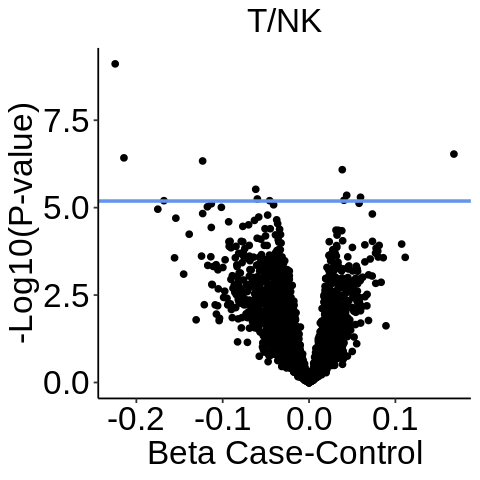

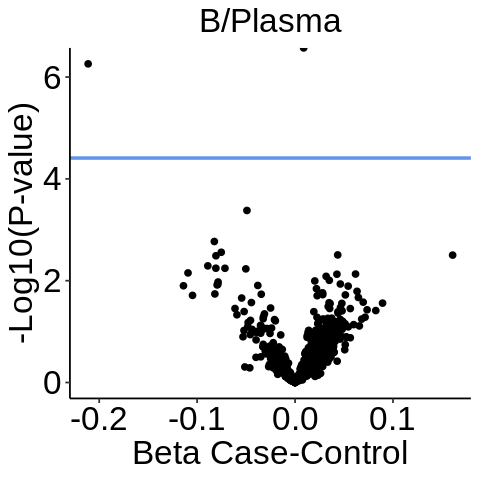

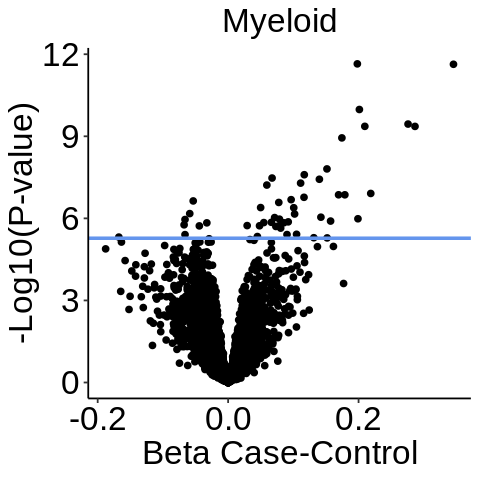

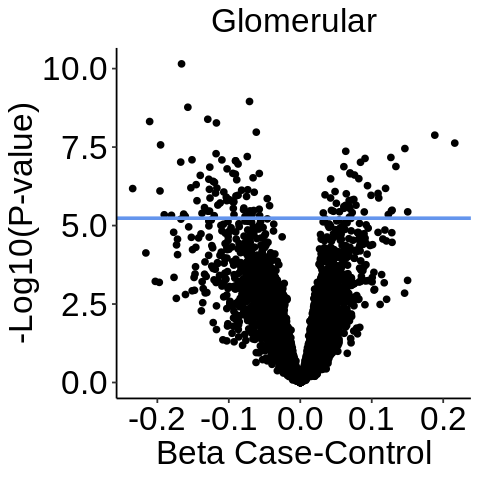

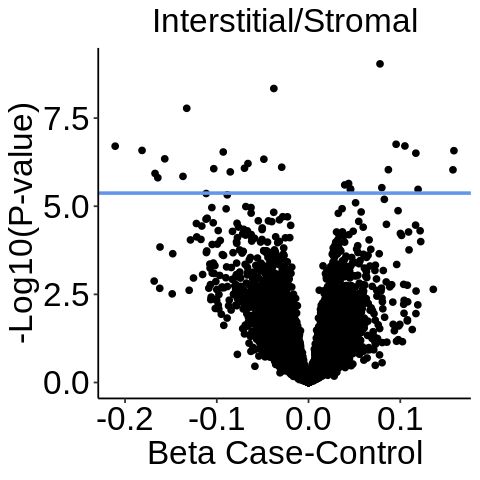

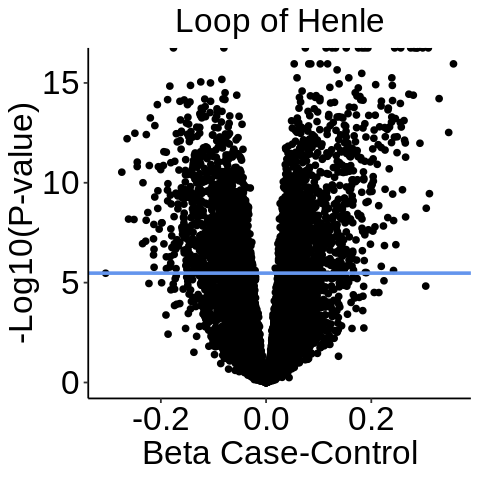

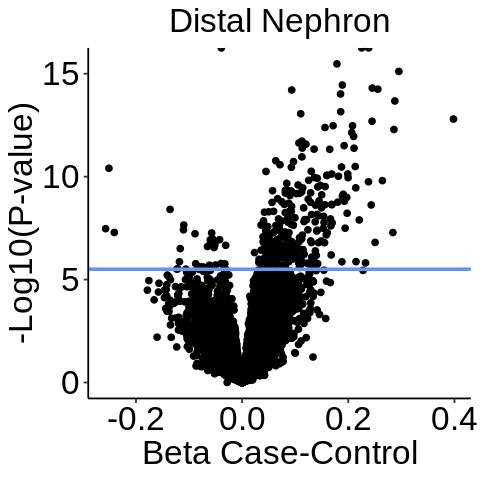

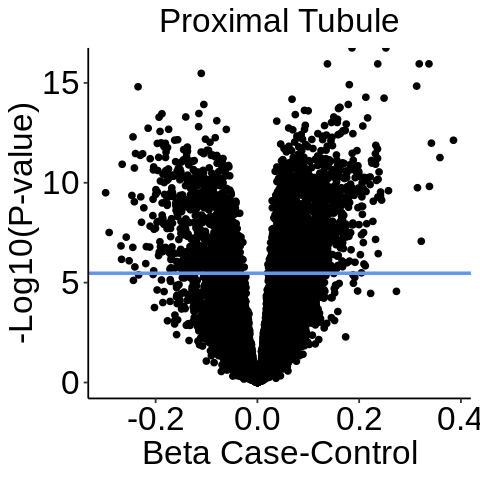

In [60]:
for (ctype in celltypes){
    res = res_list[[ctype]]
        
    fig.size(4, 4)
    p = ggplot(res)+
        geom_point(aes(x = beta, y = -log10(p)))+
        theme_classic()+
        theme(text=element_text(family="Arial"),
        legend.position = "none",
        panel.grid = element_blank(),
        axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
        axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
        axis.title = element_text(size=labelfontsize, hjust = 0.5),
        plot.title = element_text(size=labelfontsize, hjust = 0.5),
        )+
        geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue', linewidth = 1)+
        labs(x = 'Beta Case-Control', y = '-Log10(P-value)', title = ctype)
    print(p)
}

In [111]:
isg_genes_large = readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/pseudobulk_de/isg_genes.rds')

In [112]:
isg_genes_large

[1] "IFI44L"   "IFITM3"   "BST2"     "LY6E"     "IFIT1"    "MX1"     
 [7] "STAT1"    "XAF1"     "RNF213"   "TNFSF10"  "IFIT3"    "IFI44"   
[13] "PARP14"   "OAS1"     "EIF2AK2"  "PSMB9"    "TYMP"     "IRF9"    
[19] "SERPING1" "GADD45B"

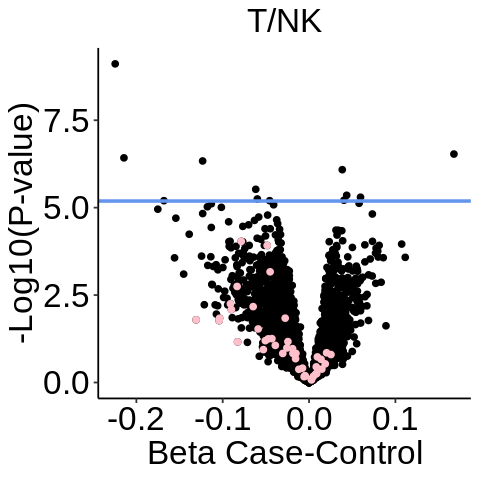

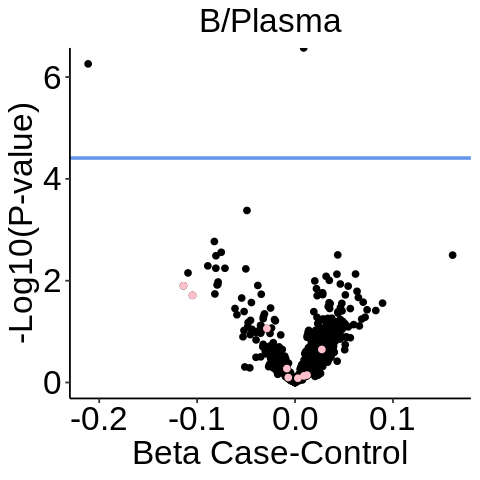

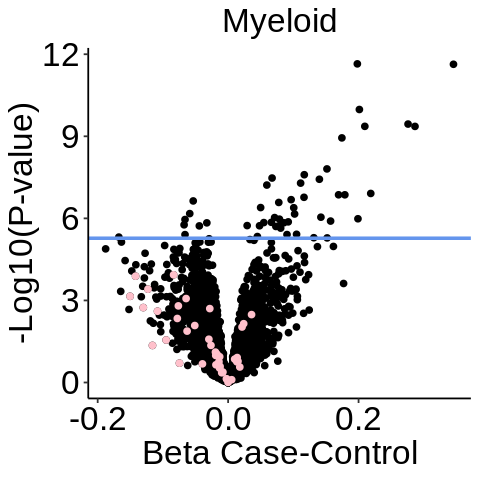

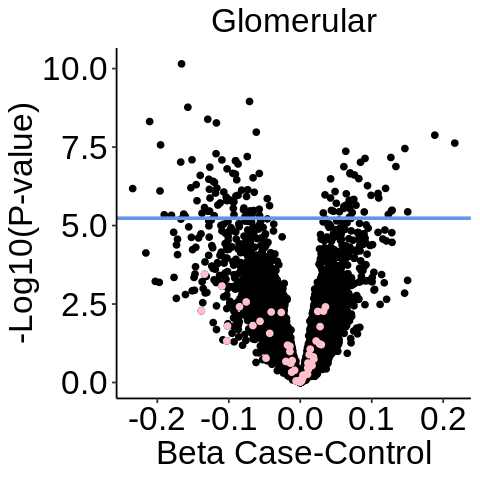

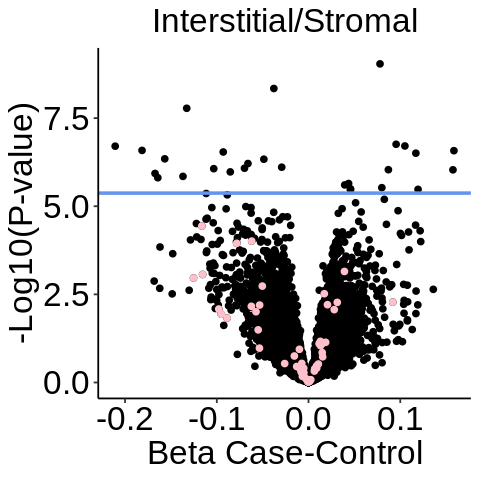

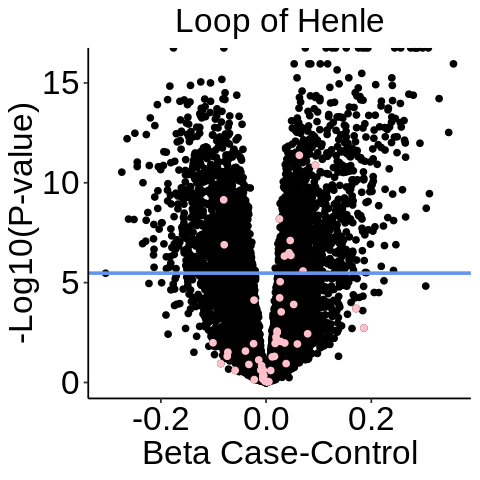

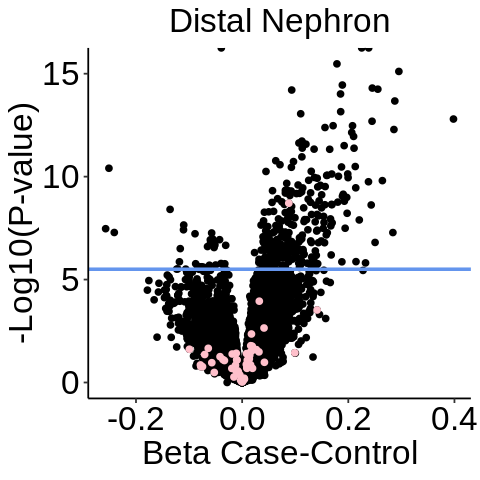

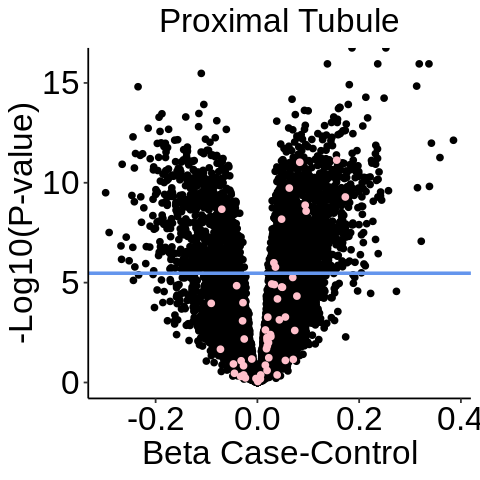

In [70]:
isg_genes = res_all[grep("^IF|^IS", res_all$gene), 'gene'] %>% unique %>% sort

for (ctype in celltypes){
    res = res_list[[ctype]]
        
    fig.size(4, 4)
    p = ggplot(res)+
        geom_point(aes(x = beta, y = -log10(p)))+
        geom_point(data = res %>% filter(gene %in% isg_genes), 
                        aes(x = beta, y = -log10(p)), color = 'pink')+
        theme_classic()+
        theme(text=element_text(family="Arial"),
        legend.position = "none",
        panel.grid = element_blank(),
        axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
        axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
        axis.title = element_text(size=labelfontsize, hjust = 0.5),
        plot.title = element_text(size=labelfontsize, hjust = 0.5),
        )+
        geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue', linewidth = 1)+
        labs(x = 'Beta Case-Control', y = '-Log10(P-value)', title = ctype)
    print(p)
}

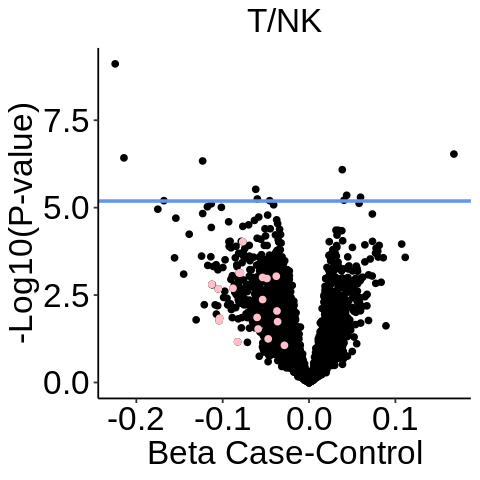

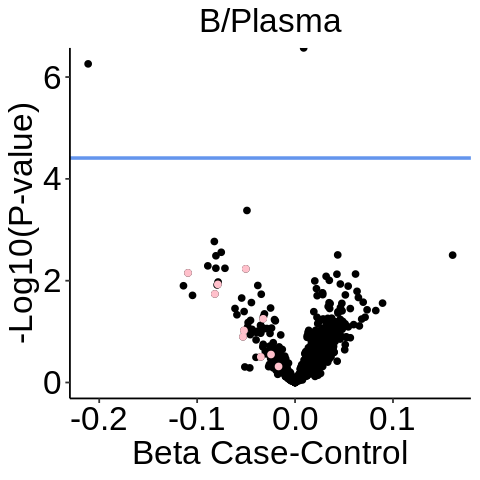

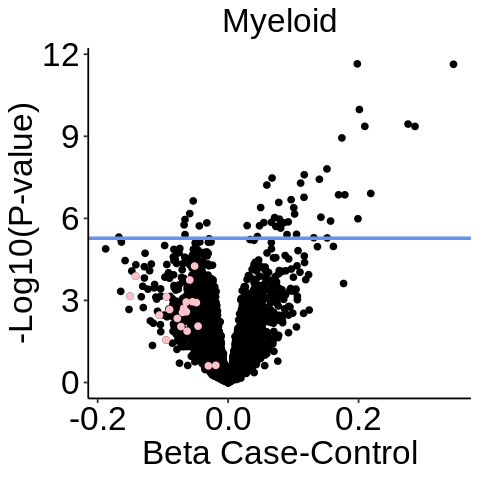

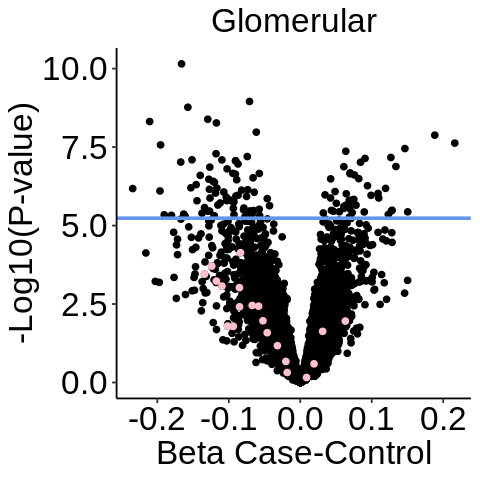

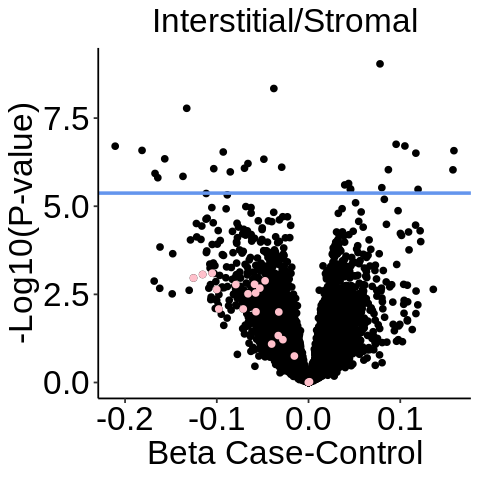

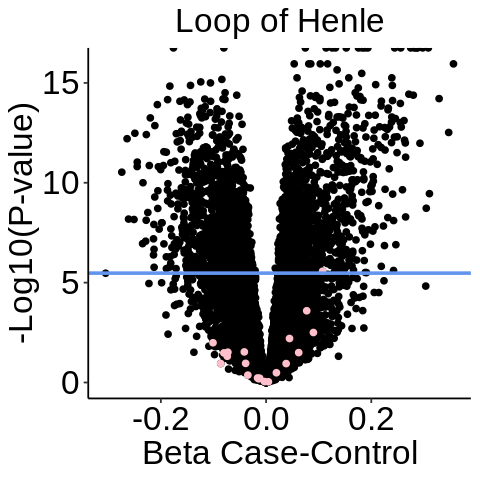

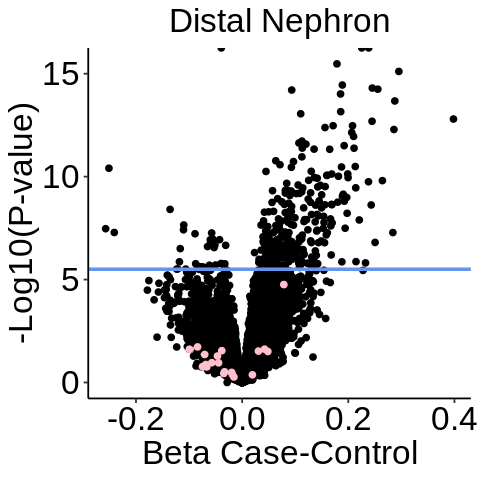

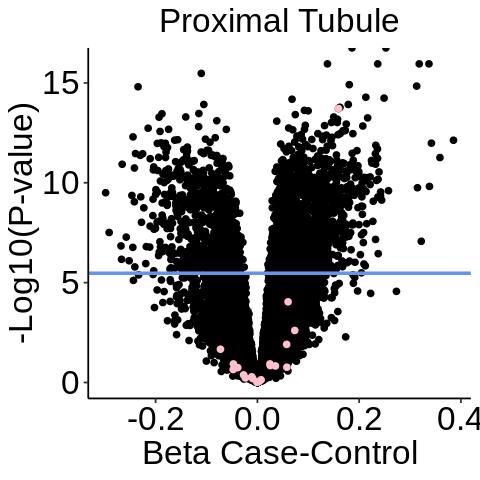

In [155]:
for (ctype in celltypes){
    res = res_list[[ctype]]
        
    fig.size(4, 4)
    p = ggplot(res)+
        geom_point(aes(x = beta, y = -log10(p)))+
        geom_point(data = res %>% filter(gene %in% isg_genes_large), 
                        aes(x = beta, y = -log10(p)), color = 'pink')+
        theme_classic()+
        theme(text=element_text(family="Arial"),
        legend.position = "none",
        panel.grid = element_blank(),
        axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
        axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
        axis.title = element_text(size=labelfontsize, hjust = 0.5),
        plot.title = element_text(size=labelfontsize, hjust = 0.5),
        )+
        geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue', linewidth = 1)+
        labs(x = 'Beta Case-Control', y = '-Log10(P-value)', title = ctype)
    print(p)
}

In [176]:
isg_genes_large

[1] "IFI44L"   "IFITM3"   "BST2"     "LY6E"     "IFIT1"    "MX1"     
 [7] "STAT1"    "XAF1"     "RNF213"   "TNFSF10"  "IFIT3"    "IFI44"   
[13] "PARP14"   "OAS1"     "EIF2AK2"  "PSMB9"    "TYMP"     "IRF9"    
[19] "SERPING1" "GADD45B"

In [175]:
isg_genes

[1] "IFFO1"   "IFFO2"   "IFI16"   "IFI27"   "IFI27L1" "IFI27L2" "IFI30"  
 [8] "IFI35"   "IFI44"   "IFI44L"  "IFI6"    "IFIH1"   "IFIT1"   "IFIT2"  
[15] "IFIT3"   "IFIT5"   "IFITM1"  "IFITM10" "IFITM2"  "IFITM3"  "IFNAR1" 
[22] "IFNAR2"  "IFNG"    "IFNGR1"  "IFNGR2"  "IFNLR1"  "IFRD1"   "IFRD2"  
[29] "IFT122"  "IFT140"  "IFT172"  "IFT20"   "IFT22"   "IFT27"   "IFT43"  
[36] "IFT46"   "IFT52"   "IFT57"   "IFT74"   "IFT80"   "IFT81"   "IFT88"  
[43] "ISCA1"   "ISCA2"   "ISCU"    "ISG15"   "ISG20"   "ISG20L2" "ISLR"   
[50] "ISM1"    "ISM2"    "ISOC1"   "ISOC2"   "IST1"    "ISY1"    "ISYNA1"

In [71]:
res_all$celltype %>% table

.
            B/Plasma       Distal Nephron           Glomerular 
                1284                15902                 8575 
Interstitial/Stromal        Loop of Henle              Myeloid 
               11792                14965                 9376 
     Proximal Tubule                 T/NK 
               14760                 7729 

In [119]:
nctypes = 1

genelist = ((res_all %>% filter(padj < 0.05, beta > 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_up_all = genelist

sig_up_all

genelist = ((res_all %>% filter(padj < 0.05, beta < 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_down_all = genelist

sig_down_all

[1] "A1BG"         "A4GALT"       "ABCC3"        "ABRACL"       "AC004870.2"  
  [6] "AC020916.1"   "AC023043.1"   "AC093673.1"   "ACSL4"        "ACTB"        
 [11] "ACTL6A"       "ACTN1"        "ACTR3"        "ADAM15"       "AGR2"        
 [16] "AGR3"         "AHNAK2"       "AHR"          "AKIP1"        "ALDH3B1"     
 [21] "ALYREF"       "ANKRD45"      "ANXA1"        "ANXA2"        "ANXA3"       
 [26] "ANXA5"        "AOPEP"        "AP1G2"        "AP1S3"        "AP4M1"       
 [31] "APOL1"        "ARF4"         "ARFGAP3"      "ARHGAP26"     "ARHGAP40"    
 [36] "ARHGDIB"      "ARHGEF35"     "ARHGEF38"     "ARL13B"       "ARL4A"       
 [41] "ARL4C"        "ARL4D"        "ARL6IP5"      "ARMC7"        "ARNTL2"      
 [46] "ARPC1B"       "ARPC2"        "ARPC3"        "ARPC5"        "ARRDC2"      
 [51] "ASPHD1"       "ATF7"         "ATL1"         "BAG5"         "BAX"         
 [56] "BAZ1A"        "BBC3"         "BBOX1"        "BBS7"         "BCAP29"      
 [61] "BCL2L15"      "BFSP1"        "BMP1"         "BTG3"         "BUD23"       
 [66] "C11orf80"     "C12orf75"     "C14orf119"    "C15orf48"     "C16orf46"    
 [71] "C17orf49"     "C19orf33"     "C1GALT1C1"    "C1orf53"      "C1RL"        
 [76] "C3"           "C3orf14"      "C4orf47"      "C4orf48"      "C6orf132"    
 [81] "C9orf116"     "C9orf16"      "CACNB3"       "CALHM6"       "CALM2"       
 [86] "CALML4"       "CAPG"         "CARD16"       "CARD19"       "CARD6"       
 [91] "CASP3"        "CASP6"        "CAVIN3"       "CCDC107"      "CCDC112"     
 [96] "CCDC124"      "CCDC130"      "CCDC157"      "CCDC88B"      "CCDC90B"     
[101] "CCND2"        "CD151"        "CD24"         "CD40"         "CD47"        
[106] "CD55"         "CD58"         "CD63"         "CD81"         "CD9"         
[111] "CD99"         "CDC42EP1"     "CDC42EP5"     "CDK2AP1"      "CDK2AP2"     
[116] "CDR2L"        "CEBPB"        "CEBPD"        "CFAP46"       "CFI"         
[121] "CFL1"         "CHEK2"        "CHIC2"        "CHMP4A"       "CHST7"       
[126] "CITED4"       "CKLF"         "CLDN3"        "CLDN7"        "CLIC1"       
[131] "CLTA"         "CLU"          "CMTM7"        "CNIH4"        "CNPY3"       
[136] "COL16A1"      "CORO1C"       "CORO2A"       "CREB5"        "CRIP1"       
[141] "CRIP2"        "CSTB"         "CTSZ"         "CTTN"         "CTTNBP2NL"   
[146] "CTXN1"        "CXADR"        "CYBA"         "CYP27A1"      "CYTOR"       
[151] "DAPP1"        "DBF4"         "DBI"          "DBNDD2"       "DCTPP1"      
[156] "DCUN1D5"      "DDA1"         "DENND3"       "DENND5B"      "DEPTOR"      
[161] "DERL2"        "DGKA"         "DGKH"         "DGUOK"        "DOK4"        
[166] "DPCD"         "DPP4"         "DSE"          "DTD1"         "DUBR"        
[171] "DUSP22"       "DUSP5"        "DUT"          "DYNLL1"       "DYNLT1"      
[176] "DYRK4"        "EBPL"         "ECT2"         "EFHC2"        "EHBP1L1"     
[181] "EHD2"         "ELF1"         "ELF3"         "ELK3"         "EMP1"        
[186] "EMP3"         "ENO2"         "ENOX2"        "EPHB6"        "ERG28"       
[191] "ERGIC2"       "ERH"          "ERICH5"       "ETV1"         "ETV4"        
[196] "ETV5"         "EVA1C"        "EVL"          "EZR"          "FAIM"        
[201] "FAM104A"      "FAM110A"      "FAM114A1"     "FAM50A"       "FANK1"       
[206] "FAS"          "FBLIM1"       "FBXW9"        "FCHO2"        "FGFR4"       
[211] "FIBIN"        "FKBP1A"       "FKBP7"        "FLYWCH2"      "FOXA3"       
[216] "FXYD5"        "GABRP"        "GALNT7"       "GAR1"         "GCHFR"       
[221] "GLRX3"        "GMIP"         "GNAI2"        "GORAB"        "GPM6B"       
[226] "GPNMB"        "GPX8"         "GTF2A2"       "GTF2F2"       "GYG1"        
[231] "H2AFY"        "H3F3A"        "H3F3B"        "HAUS1"        "HIKESHI"     
[236] "HINT1"        "HSPB11"       "HSPB8"        "HTATIP2"      "HTRA1"       
[241] "IAH1"         "IFI27L1"      "IFITM2"       "IFNAR2"       "IFNGR1"      
[246] "IFT43"        "IGFBP6"    

[1] "AARS"        "ABAT"        "ABCC6"       "ABI3"        "AC005726.3" 
  [6] "AC010913.1"  "AC026992.1"  "AC026992.2"  "ACAD11"      "ACAD8"      
 [11] "ACADM"       "ACADSB"      "ACAT1"       "ACO2"        "ACSF2"      
 [16] "ACY1"        "ADAMTSL2"    "ADD3"        "ADSSL1"      "AGMAT"      
 [21] "AGPAT3"      "AKR7A3"      "AL031429.1"  "ALB"         "ALDH1L1"    
 [26] "ALDH5A1"     "ALDH6A1"     "ALDH7A1"     "ALDOB"       "AMT"        
 [31] "AP000926.2"  "AP001267.3"  "APOM"        "ARMH4"       "AS3MT"      
 [36] "ATP1B1"      "ATP5F1A"     "ATPAF1"      "AZGP1"       "B4GAT1"     
 [41] "BHMT"        "C1orf115"    "C8orf82"     "CACNB2"      "CDHR5"      
 [46] "CDIP1"       "CEBPA"       "CENPV"       "CES3"        "CHPT1"      
 [51] "CLCN5"       "CNNM2"       "COQ8A"       "CRAT"        "CRY2"       
 [56] "CYFIP2"      "DCXR-DT"     "DDC"         "DDX25"       "DHRS3"      
 [61] "DHTKD1"      "DIP2C"       "DLST"        "DMGDH"       "DNAJA3"     
 [66] "DPEP1"       "DRAIC"       "ECI2"        "ECSIT"       "EGF"        
 [71] "EHHADH"      "EPB41L3"     "EPHX2"       "EPM2A"       "ESRRG"      
 [76] "F11"         "FAM117A"     "FAM234B"     "FBLN5"       "FECH"       
 [81] "FMO4"        "FOXN3"       "FOXRED2"     "FRMD3"       "GAD1"       
 [86] "GAMT"        "GATM"        "GGT6"        "GHR"         "GK"         
 [91] "GLYATL1"     "GNG7"        "GPAT3"       "GPR146"      "GPR155"     
 [96] "HADH"        "HADHB"       "HIBADH"      "HIBCH"       "HNF1A"      
[101] "HOGA1"       "HPD"         "HRG"         "HSD11B1-AS1" "HSDL2"      
[106] "HSPA9"       "INPP5J"      "INSR"        "IQSEC1"      "ITGA1"      
[111] "KCNJ13"      "KHK"         "KL"          "KNG1"        "L2HGDH"     
[116] "LDHD"        "LINC01625"   "LINC02447"   "MACROD1"     "MARC2"      
[121] "MCCC1"       "MIOX"        "MIR1915HG"   "MMUT"        "MT-CYB"     
[126] "MT-ND1"      "MT-ND4"      "MTO1"        "MTRNR2L12"   "MTTP"       
[131] "NCOA4"       "NDUFV1"      "NEDD4L"      "NFS1"        "PAIP2B"     
[136] "PALM"        "PANK1"       "PBLD"        "PC"          "PCYT2"      
[141] "PDK2"        "PDP2"        "PEX12"       "PGM1"        "PINK1"      
[146] "PLG"         "PNPO"        "POLDIP2"     "PPM1K"       "PPP1R32"    
[151] "PRDM16-DT"   "PRKN"        "PXK"         "RAB11FIP5"   "RAB17"      
[156] "RBP7"        "RENBP"       "RIDA"        "SAT2"        "SDHB"       
[161] "SELENOP"     "SFXN2"       "SGIP1"       "SHBG"        "SLC13A3"    
[166] "SLC16A10"    "SLC23A3"     "SLC25A36"    "SLC25A4"     "SLC25A42"   
[171] "SLC25A44"    "SLC25A48"    "SLC26A1"     "SLC34A1"     "SLC37A4"    
[176] "SLC51A"      "SMIM10L2B"   "SMTNL2"      "SRP14-AS1"   "ST3GAL6"    
[181] "ST3GAL6-AS1" "STARD8"      "STUM"        "SUCLG1"      "SUCLG2"     
[186] "SUGCT"       "TEF"         "TLN2"        "TMEM143"     "TMEM170B"   
[191] "TMEM192"     "TMEM38B"     "TSPAN33"     "TUB"         "UQCRC1"     
[196] "VEGFA"       "WDFY3-AS2"   "XYLB"        "ZER1"        "ZFHX2"

In [ ]:
# (sort(z_scores_all) %>% rev)[1:50] %>% names

In [ ]:
# (sort(z_scores_all))[1:50] %>% names

In [73]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[c(sig_up_all, sig_down_all), ]
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 837   8

In [74]:
dat %>% head(2)

,beta_T/NK,beta_B/Plasma,beta_Myeloid,beta_Glomerular,beta_Interstitial/Stromal,beta_Loop of Henle,beta_Distal Nephron,beta_Proximal Tubule
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,0.05960818,NA,0.09215863,0.02840357,0.03484813,0.1502927,0.02722071,0.02745545
A4GALT,NA,NA,NA,-0.01559283,0.01008368,0.1634562,0.08506581,0.02199178


In [152]:
genes_show = (res_all_wide %>% filter(gene %in% c(sig_up_all, sig_down_all))) %>% 
    dplyr::select(starts_with('beta')) %>% rowMeans(na.rm = TRUE) %>% sort %>% rev %>% names

dat = res_all %>% filter(gene %in% c(sig_up_all, sig_down_all))
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 24005     7

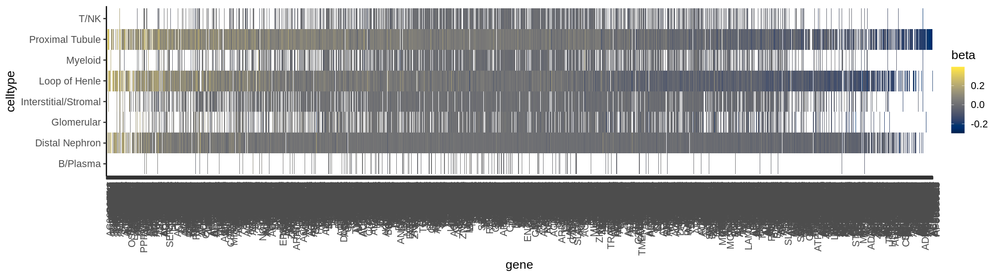

In [153]:
fig.size(5, 18)
ggplot(dat)+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_cividis()+
    theme_classic(base_size = tickfontsize)+
    theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [77]:
c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)]) 

[1] "NNMT"       "LCN2"       "S100A9"     "AHNAK2"     "MESP2"     
 [6] "BCL2L15"    "AGR2"       "PSORS1C1"   "AC004870.2" "SLPI"      
[11] "GAD1"       "SLC25A48"   "AZGP1"      "SLC13A3"    "AC026992.1"
[16] "SLC34A1"    "MIOX"       "EGF"        "ALDOB"      "PLG"       
[21] "ALB"

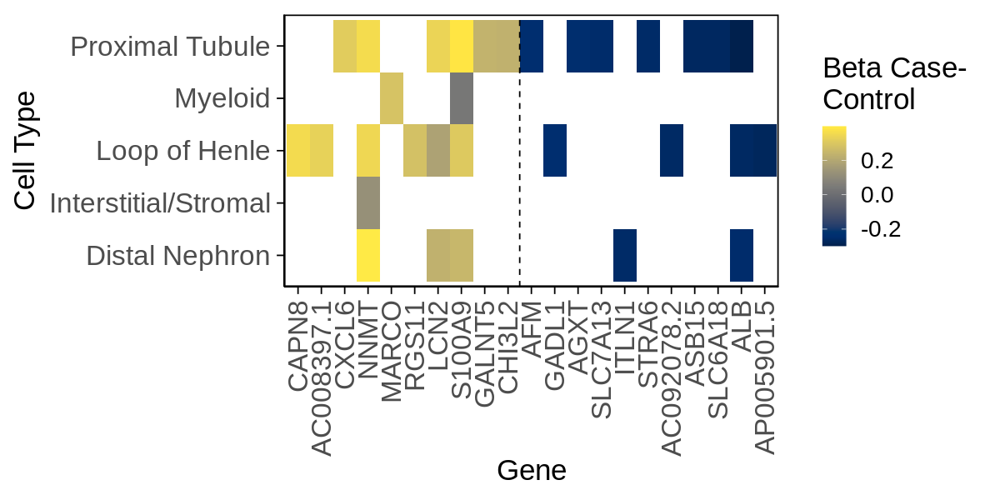

In [154]:
de_plot = ggplot(dat %>% filter(gene %in% c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)])))+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_cividis()+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1)) +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta Case-\nControl')+
    geom_vline(xintercept = 10.5, linetype = 'dashed')


height = 5
width = 10

fig.size(height, width)
outplot = de_plot
outplo

In [155]:
nctypes = 2

genelist = ((res_all %>% filter(padj < 0.05, beta > 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_up_all = genelist

sig_up_all

genelist = ((res_all %>% filter(padj < 0.05, beta < 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_down_all = genelist

sig_down_all

[1] "A1BG"      "ABCC3"     "ACSL4"     "AHNAK2"    "ANXA1"     "ANXA5"    
 [7] "ARHGEF38"  "ARL4C"     "ARRDC2"    "BAX"       "BCL2L15"   "BMP1"     
[13] "C12orf75"  "C17orf49"  "C1RL"      "C4orf48"   "C9orf16"   "CAPG"     
[19] "CASP3"     "CD58"      "CD99"      "CDR2L"     "CEBPB"     "CRIP1"    
[25] "CTTNBP2NL" "CTXN1"     "DBI"       "DGKA"      "EHBP1L1"   "ERICH5"   
[31] "FIBIN"     "IFNAR2"    "IGFBP6"    "IKBKE"     "IL4R"      "ITGB6"    
[37] "KDELR3"    "KLF7"      "KRT7"      "KRT8"      "LGALS1"    "LINC00623"
[43] "LINC01116" "MET"       "MMS22L"    "MPZL2"     "NCMAP"     "NIFK"     
[49] "NNMT"      "NPDC1"     "PAPPA2"    "PDLIM1"    "PLCD3"     "PLEKHA1"  
[55] "PLEKHN1"   "PLPP2"     "PMP22"     "PRR7"      "PSORS1C1"  "PYCARD"   
[61] "RAPGEF5"   "RASSF3"    "RHOA"      "RHOC"      "RSU1"      "S100A10"  
[67] "S100A11"   "S100A16"   "S100A9"    "SDC3"      "SDK1"      "SEM1"     
[73] "SEZ6L2"    "SHTN1"     "SLC27A3"   "SNHG12"    "SNX7"      "SPATS2"   
[79] "TCF7"      "TESC"      "TEX9"      "TIMP1"     "TMEM265"   "TMSB10"   
[85] "TPBG"      "TPM4"      "VIM-AS1"   "VMP1"      "WFDC2"     "YWHAH"

[1] "ACAT1"    "ACO2"     "ALB"      "ALDH6A1"  "ALDOB"    "AZGP1"   
 [7] "B4GAT1"   "C1orf115" "CDIP1"    "CYFIP2"   "GATM"     "GHR"     
[13] "GPAT3"    "KNG1"     "MIOX"     "NEDD4L"   "PAIP2B"   "PBLD"    
[19] "RIDA"     "SLC16A10" "TEF"      "UQCRC1"

In [156]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[c(sig_up_all, sig_down_all), ]
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 112   8

In [157]:
dat %>% head(2)

,beta_T/NK,beta_B/Plasma,beta_Myeloid,beta_Glomerular,beta_Interstitial/Stromal,beta_Loop of Henle,beta_Distal Nephron,beta_Proximal Tubule
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,0.05960818,NA,0.09215863,0.02840357,0.03484813,0.1502927,0.02722071,0.02745545
ABCC3,NA,NA,-0.02448047,0.10113033,NA,0.1819022,0.14505332,0.10796222


In [158]:
genes_show = (res_all_wide %>% filter(gene %in% c(sig_up_all, sig_down_all))) %>% 
    dplyr::select(starts_with('beta')) %>% rowMeans(na.rm = TRUE) %>% sort %>% rev %>% names

dat = res_all %>% filter(gene %in% c(sig_up_all, sig_down_all))
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 658   7

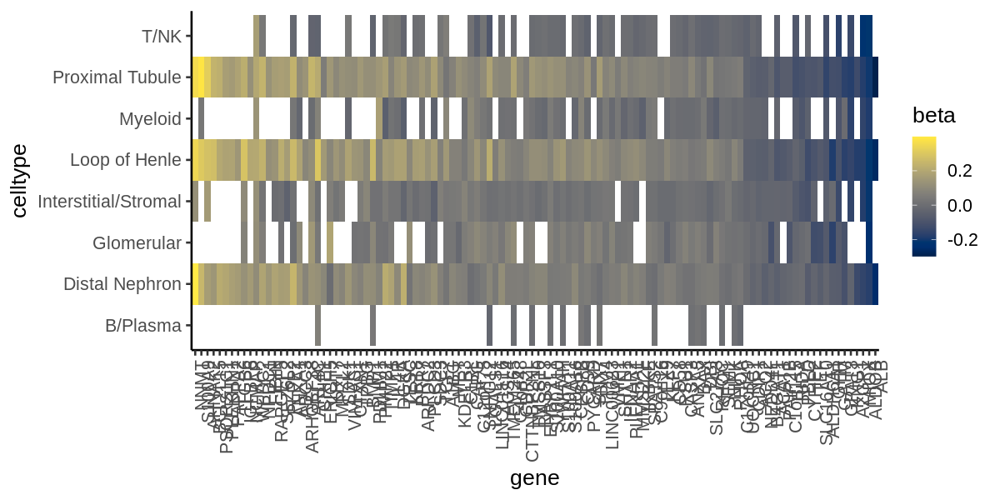

In [159]:
fig.size(5, 10)
ggplot(dat)+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_cividis()+
    theme_classic(base_size = tickfontsize)+
    theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [160]:
c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)]) 

[1] "NNMT"     "S100A9"   "AHNAK2"   "BCL2L15"  "PSORS1C1" "PLEKHN1" 
 [7] "PAPPA2"   "ITGB6"    "IGFBP6"   "NCMAP"    "TEF"      "SLC16A10"
[13] "ALDH6A1"  "GHR"      "GATM"     "GPAT3"    "KNG1"     "AZGP1"   
[19] "MIOX"     "ALDOB"    "ALB"

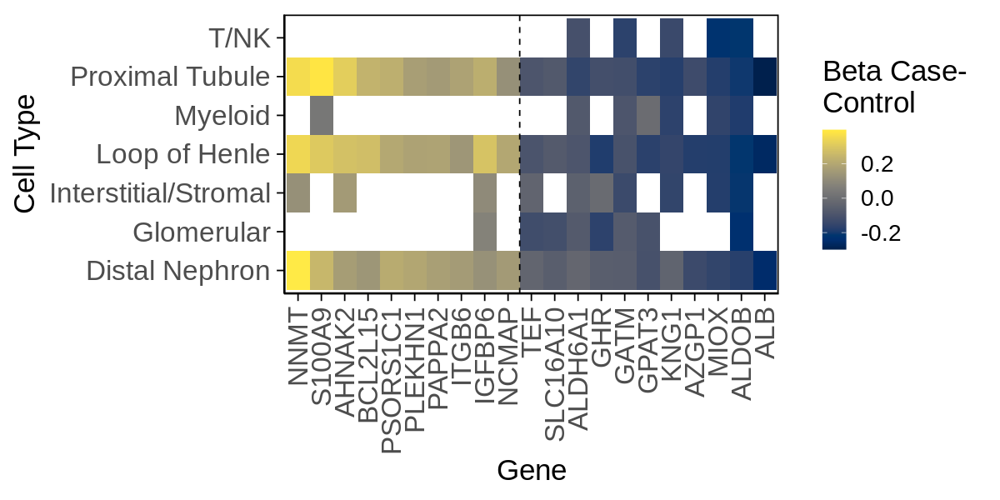

In [161]:
de_plot = ggplot(dat %>% filter(gene %in% c(genes_show[1:10], genes_show[(length(genes_show)-10):length(genes_show)])))+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_cividis()+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1)) +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta Case-\nControl')+
    geom_vline(xintercept = 10.5, linetype = 'dashed')


height = 5
width = 10

fig.size(height, width)
outplot = de_plot
outplot


In [162]:
genes_show_nonsig = intersect(genes_show, names(table(dat$gene)[table(dat$gene) > 4]))

In [163]:
genes_show_nonsig[1:10]

[1] "IGFBP6"  "WFDC2"   "NPDC1"   "SEZ6L2"  "ANXA1"   "ABCC3"   "ARL4C"  
 [8] "CRIP1"   "KRT7"    "VIM-AS1"

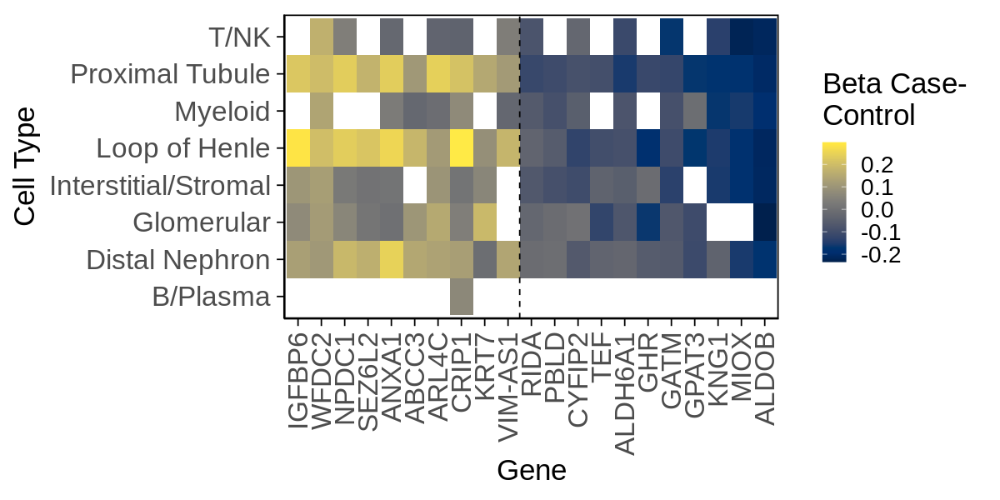

In [165]:
de_plot = ggplot(dat %>% filter(gene %in% c(genes_show_nonsig[1:10], genes_show_nonsig[(length(genes_show_nonsig)-10):length(genes_show_nonsig)])))+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_cividis()+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1)) +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta Case-\nControl')+
    geom_vline(xintercept = 10.5, linetype = 'dashed')


height = 5
width = 10

fig.size(height, width)
outplot = de_plot
outplot

In [166]:
nctypes = 3

genelist = ((res_all %>% filter(padj < 0.05, beta > 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_up_all = genelist

sig_up_all

genelist = ((res_all %>% filter(padj < 0.05, beta < 0))$gene %>% table)
genelist = genelist[genelist > nctypes] %>% names

sig_down_all = genelist

sig_down_all

[1] "AHNAK2"  "BAX"     "C4orf48" "S100A10" "WFDC2"

[1] "ALDOB" "GPAT3" "KNG1"  "MIOX"

In [167]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[c(sig_up_all, sig_down_all), ]
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 9 8

In [168]:
dat %>% head(2)

,beta_T/NK,beta_B/Plasma,beta_Myeloid,beta_Glomerular,beta_Interstitial/Stromal,beta_Loop of Henle,beta_Distal Nephron,beta_Proximal Tubule
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AHNAK2,NA,NA,NA,NA,0.157446320,0.28181435,0.16647416,0.31812937
BAX,-0.02447052,0.02462732,0.001085692,0.06121223,0.005897595,0.04593668,0.03932823,0.04435405


In [169]:
genes_show = (res_all_wide %>% filter(gene %in% c(sig_up_all, sig_down_all))) %>% 
    dplyr::select(starts_with('beta')) %>% rowMeans(na.rm = TRUE) %>% sort %>% rev %>% names

dat = res_all %>% filter(gene %in% c(sig_up_all, sig_down_all))
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 59  7

In [171]:
sig_up_all

[1] "AHNAK2"  "BAX"     "C4orf48" "S100A10" "WFDC2"

In [172]:
sig_down_all

[1] "ALDOB" "GPAT3" "KNG1"  "MIOX"

In [173]:
genes_show = c('CASP3', 'CASP6', 'BAX', 'VIM-AS1', 'LGALS1')

In [174]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[c(genes_show, sig_down_all), ]
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 9 8

In [175]:
genes_show = (res_all_wide %>% filter(gene %in% c(genes_show, sig_down_all))) %>% 
    dplyr::select(starts_with('beta')) %>% rowMeans(na.rm = TRUE) %>% sort %>% rev %>% names

dat = res_all %>% filter(gene %in% c(genes_show))
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 59  7

In [176]:
genes_show

[1] "VIM-AS1" "LGALS1"  "CASP6"   "CASP3"   "BAX"     "GPAT3"   "KNG1"   
[8] "MIOX"    "ALDOB"

In [177]:
c(genes_show[1:5], genes_show[(length(genes_show)-5):length(genes_show)])

[1] "VIM-AS1" "LGALS1"  "CASP6"   "CASP3"   "BAX"     "CASP3"   "BAX"    
 [8] "GPAT3"   "KNG1"    "MIOX"    "ALDOB"

In [188]:
library("RColorBrewer")

In [196]:
rev(brewer.pal(7,"BrBG"))

[1] "#01665E" "#5AB4AC" "#C7EAE5" "#F5F5F5" "#F6E8C3" "#D8B365" "#8C510A"

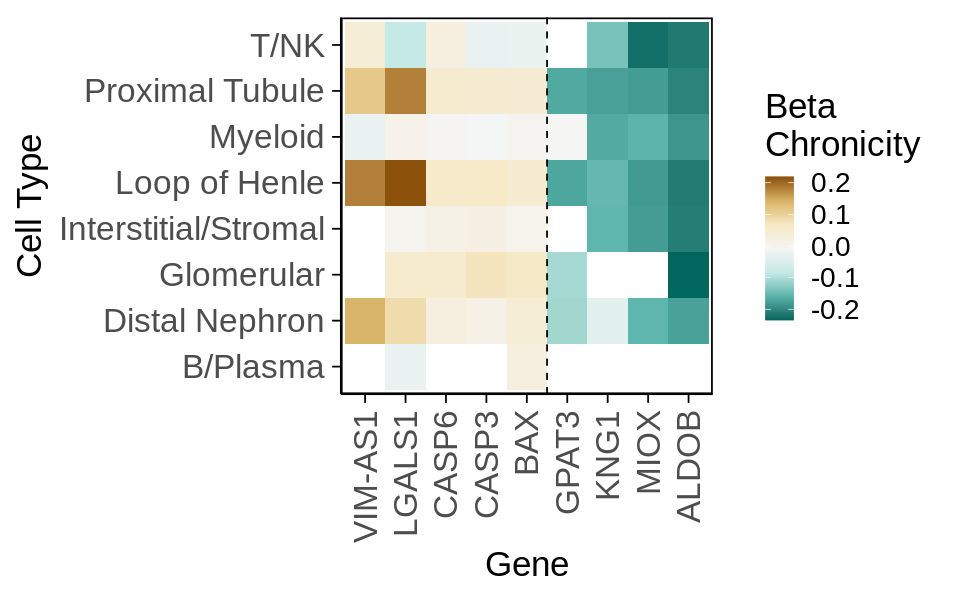

In [200]:
de_plot = ggplot(dat %>% filter(gene %in% c(genes_show[1:5], genes_show[(length(genes_show)-5):length(genes_show)])))+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    # scale_fill_cividis()+
    scale_fill_gradientn(colours=rev(brewer.pal(7,"BrBG")))+
    # scale_fill_brewer(palette = 'BrBG')+
    theme_classic(base_size = tickfontsize)+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1)) +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta\nChronicity')+
    geom_vline(xintercept = 5.5, linetype = 'dashed')

height = 5
width = 8

fig.size(height, width)
outplot = de_plot
outplot

# ggsave(paste0(figdir, 'de_gene_heatmap_chronicity.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'de_gene_heatmap_chronicity.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)



In [250]:
rowSums(res_all_wide %>% dplyr::select(starts_with('padj')) < 0.05, na.rm = TRUE)

NOC2L             ISG15          TNFRSF18           TNFRSF4 
                1                 0                 0                 0 
             SDF4           B3GALT6            UBE2J2             PUSL1 
                0                 0                 0                 0 
           INTS11              CPTP          AURKAIP1             CCNL2 
                0                 1                 0                 0 
       MRPL20-AS1            MRPL20            ATAD3B            ATAD3A 
                0                 0                 1                 0 
            SSU72              MIB2            MMP23B            CDK11B 
                0                 0                 0                 0 
         SLC35E2B            CDK11A              NADK              GNB1 
                0                 0                 0                 0 
            PRKCZ            FAAP20               SKI              RER1 
                0                 0                 0                 0 
            PANK4        AL139246.5      TNFRSF14-AS1          TNFRSF14 
                0                 0                 0                 0 
           TPRG1L            WRAP73            LRRC47            CEP104 
                1                 0                 0                 0 
         C1orf174            KCNAB2             RPL22              ICMT 
                0                 1                 0                 0 
            ACOT7          TNFRSF25              NOL9            ZBTB48 
                1                 0                 0                 0 
            THAP3           DNAJC11            CAMTA1             VAMP3 
                0                 1                 0                 0 
            PARK7              RERE              ENO1              H6PD 
                0                 0                 0                 0 
         SLC25A33            PIK3CD            CLSTN1          CTNNBIP1 
                0                 1                 0                 0 
             LZIC             UBE4B             KIF1B               PGD 
                0                 0                 0                 0 
             DFFA            TARDBP               SRM           EXOSC10 
                0                 0                 1                 0 
           UBIAD1             FBXO2            FBXO44             FBXO6 
                0                 0                 1                 0 
           MAD2L2            AGTRAP             MTHFR        AL021155.5 
                1                 0                 0                 0 
         KIAA2013              MFN2              MIIP          TNFRSF1B 
                0                 1                 0                 0 
           VPS13D             DHRS3             PRDM2             EFHD2 
                0                 2                 0                 0 
          DNAJC16             AGMAT              DDI2           PLEKHM2 
                0                 2                 0                 1 
       AL450998.2              SPEN            ZBTB17            FBXO42 
                0                 0                 0                 0 
            SZRD1            NECAP2        BX284668.5           ATP13A2 
                0                 1                 0                 0 
             SDHB              RCC2             IFFO2              UBR4 
                2                 0                 0                 0 
             EMC1             MRTO4            AKR7A2             CAPZB 
                0                 0                 1                 1 
          MICOS10              NBL1             TMCO4           CAMK2N1 
                0                 1                 0                 1 
            PINK1             DDOST            HP1BP3            EIF4G3 
                2                 1                 0                 1 
             ECE1             USP48         LINC00339             CDC4

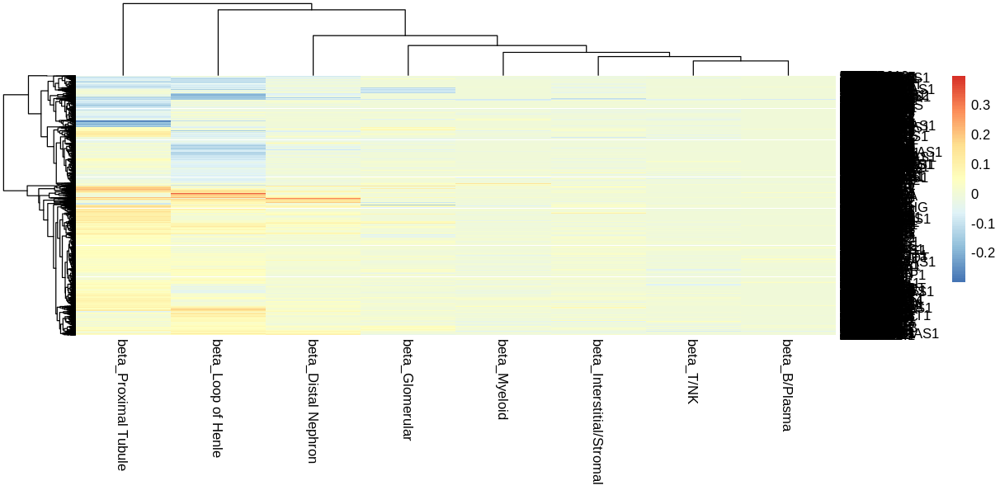

In [265]:
dat = res_all_wide[rowSums(res_all_wide %>% dplyr::select(starts_with('padj')) < 0.05, na.rm = TRUE) > 0, ] %>%  
        dplyr::select(starts_with('beta'))
dat[is.na(dat)] = 0
dat %>% dim
pheatmap(dat)

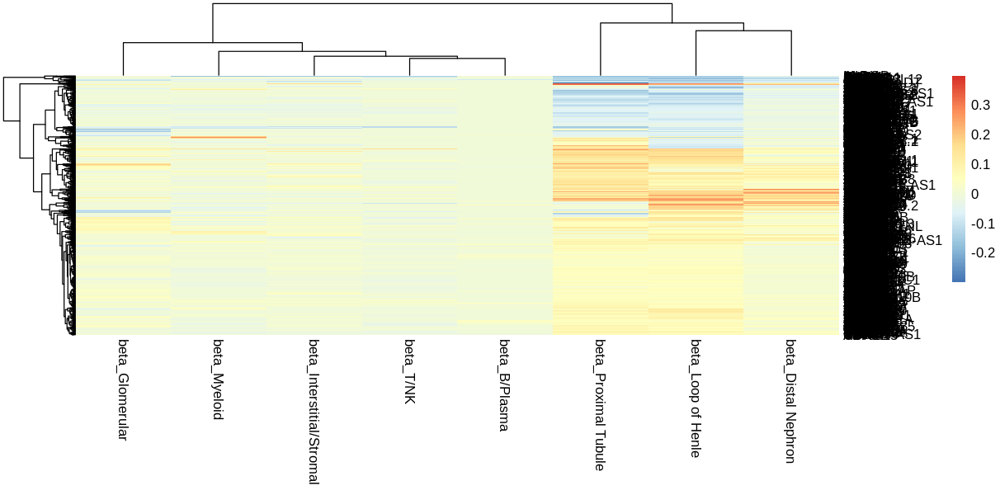

In [268]:
dat = res_all_wide[rowSums(res_all_wide %>% dplyr::select(starts_with('padj')) < 0.05, na.rm = TRUE) > 1, ] %>%  
        dplyr::select(starts_with('beta'))
dat[is.na(dat)] = 0
dat %>% dim
pheatmap(dat)

In [396]:
dat = res_all_wide[rowSums((res_all_wide %>% dplyr::select(starts_with('Beta')) %>% abs) > 0.1, na.rm = TRUE) > 1, ] %>%  
        dplyr::select(starts_with('beta'))
dat[is.na(dat)] = 0
dat %>% dim

[1] 441   8

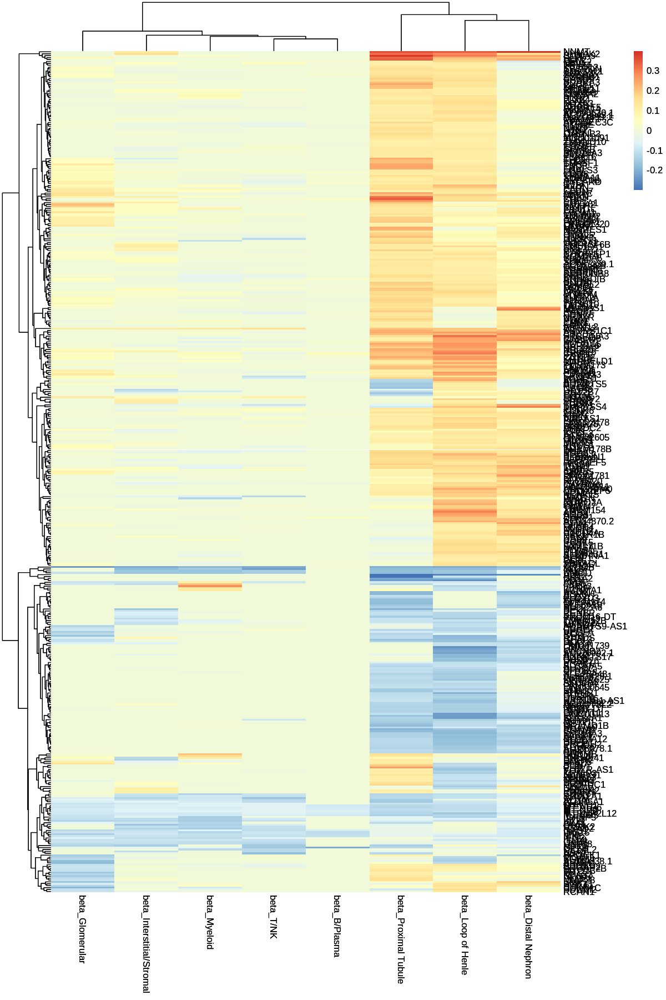

In [397]:
heatmap_res= pheatmap(dat)
heatmap_res

In [432]:
hc <- heatmap_res$tree_row
clusters <- cutree(hc,  k = 5)
dat$cluster = clusters

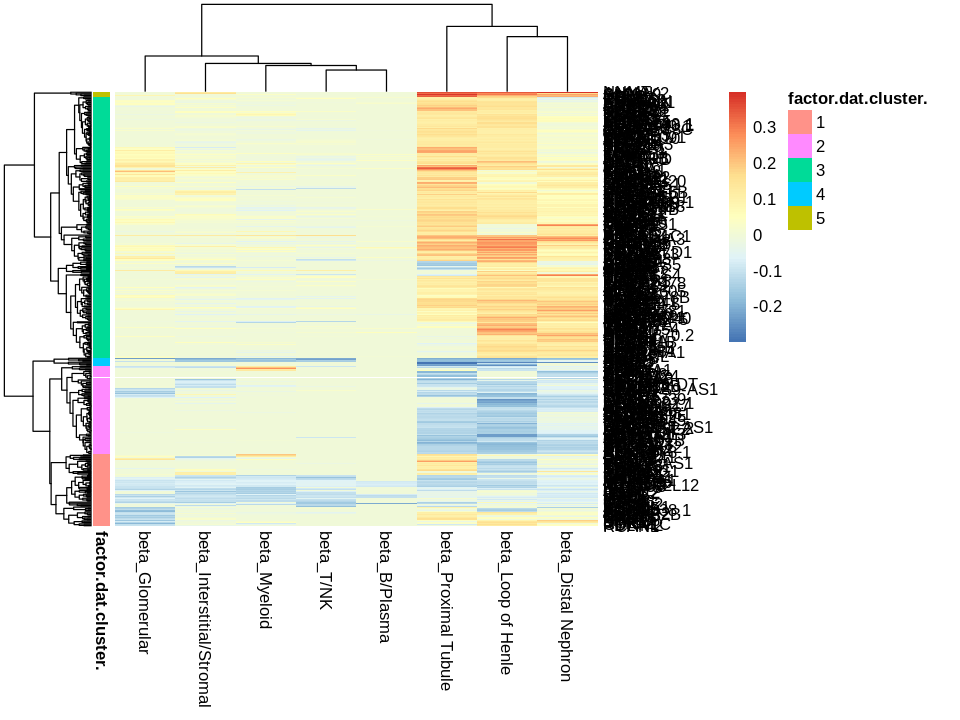

In [433]:
fig.size(6, 8)
annotation_row <- data.frame(factor(dat$cluster))
rownames(annotation_row) <- rownames(dat)

pheatmap(dat %>% dplyr::select(-cluster), annotation_row = annotation_row)

In [527]:
dat_geneord = dat %>% filter(cluster %in% clusters) %>% dplyr::select(-cluster) %>% rowMeans %>% sort %>% rev %>% names

rownames((dat %>% filter(cluster %in% clusters))[dat_geneord, ])

[1] "WFDC2"      "IGFBP6"     "NPDC1"      "CRIP1"      "ANXA1"     
  [6] "VCAN"       "C3"         "SERPINA3"   "ARL4C"      "FXYD5"     
 [11] "MMP7"       "CCND2"      "BCL2L15"    "LTF"        "PSORS1C1"  
 [16] "CLU"        "CD44"       "GABRP"      "C19orf33"   "PDLIM1"    
 [21] "SEZ6L2"     "KRT19"      "TIMP1"      "S100A2"     "IL4R"      
 [26] "PLEKHN1"    "COL1A1"     "SOX9"       "C15orf48"   "CREB5"     
 [31] "KLF2"       "PHLDA2"     "PAPPA2"     "FBLIM1"     "ABCC3"     
 [36] "ARHGAP40"   "LINC01781"  "CCN3"       "TNC"        "MCUB"      
 [41] "C1S"        "CARD16"     "LINC00511"  "CXCL2"      "ITGB6"     
 [46] "TGM2"       "PSD3"       "TMEM154"    "NCMAP"      "CLDN7"     
 [51] "MICAL2"     "FILIP1L"    "RAPGEF5"    "COL16A1"    "KRT7"      
 [56] "TMEM173"    "KCNK15"     "FKBP5"      "DGKA"       "LAMA3"     
 [61] "MESP2"      "IL18"       "MARVELD1"   "PLPP2"      "CALHM6"    
 [66] "SFTA2"      "ANXA2"      "VIM-AS1"    "TESC"       "LGALS1"    
 [71] "VIM"        "PXDN"       "CDC42EP5"   "PLP2"       "C4orf48"   
 [76] "DAPP1"      "AGR2"       "TPBG"       "PMEPA1"     "TMSB10"    
 [81] "BMP1"       "ENO2"       "AC004870.2" "TMEM178B"   "ARRDC2"    
 [86] "RHBDL2"     "LGALS3"     "TMPRSS4"    "FBN1"       "MSC-AS1"   
 [91] "SFN"        "SCARA3"     "TNFAIP2"    "FOS"        "CRABP2"    
 [96] "SNAP25"     "FHL1"       "MYADM"      "SDC3"       "CYTOR"     
[101] "LINC02478"  "S100A11"    "FHL2"       "TNIK"       "CLDN1"     
[106] "ETV4"       "FIBIN"      "ACSL4"      "TMSB4X"     "MMP2"      
[111] "TUBA1A"     "SPECC1"     "AGR3"       "PLK3"       "LRG1"      
[116] "SPON2"      "SLC6A20"    "LINC01320"  "CXCL1"      "S100A6"    
[121] "LAMC2"      "TFPI2"      "JPT1"       "RCAN3"      "PYCARD"    
[126] "CLDN4"      "FOXA3"      "MPZL2"      "RUNX1"      "TPM4"      
[131] "SLC16A5"    "LAMB3"      "KCNK6"      "SDK1"       "SOD3"      
[136] "PTN"        "SYCE3"      "COL1A2"     "SNCA"       "PGM2L1"    
[141] "ARHGDIB"    "CTXN1"      "TNFRSF6B"   "PRR7"       "ASPHD1"    
[146] "CDC42EP1"   "XKR4"       "PROS1"      "YWHAH"      "CORO2A"    
[151] "EMP1"       "ITGB4"      "TRIM59"     "MDK"        "SERPINB8"  
[156] "GPX2"       "MBOAT1"     "PLCD3"      "ARPC1B"     "RARRES1"   
[161] "CARD6"      "TM4SF1"     "KLF4"       "C2CD4A"     "SPRY4"     
[166] "CMTM7"      "CDH6"       "PLTP"       "IL32"       "IL19"      
[171] "PPP1R1B"    "MEGF11"     "CACNB3"     "NXN"        "RASSF3"    
[176] "ETV5"       "EHBP1L1"    "EHD2"       "NEK6"       "TRIM47"    
[181] "EVA1C"      "DUSP5"      "LINC02605"  "CCDC88B"    "NAV1"      
[186] "SBSPON"     "SYT16"      "ETV1"       "S100A14"    "CASP1"     
[191] "NBL1"       "ANXA3"      "VWA2"       "MISP"       "BBC3"      
[196] "MID1"       "DPP4"       "TLCD3A"     "BCAS1"      "FAM171B"   
[201] "KCTD12"     "COL9A2"     "ST6GAL1"    "NAPSA"      "CBR3"      
[206] "SLFN5"      "AC087239.1" "GBP2"       "LINC01091"  "AC090630.1"
[211] "FBXL16"     "RRAS"       "ARNTL2"     "ADGRE5"     "NPTXR"     
[216] "RAC2"       "CD68"       "FNDC4"      "ABRACL"     "AL121899.1"
[221] "CST6"       "MAP2"       "FAR2"       "PTGFR"      "TUBB3"     
[226] "NLGN1"      "ALDH3B1"    "SLC16A3"    "RTN2"       "GPM6B"     
[231] "CELF2"      "TTC9"       "AC023043.1" "APOBEC3C"   "EDN2"      
[236] "EMP3"       "LRRK1"      "BFSP1"      "ZMYND10"    "GDA"       
[241] "FOSB"       "PRRX2"      "TLE2"       "ISG20"      "TCIRG1"    
[246] "PCSK5"      "CENPF"      "SERPINA1"   "PTPRE"      "UBD"       
[251] "HS3ST1"     "TRIM7"      "LDLR"       "BBOX1"      "IFI27"     
[256] "CRYM"       "ADH6"       "PPM1N"      "AOC1"       "CA4"       
[261] "ADAMTS5"    "NAGS"       "GATA3"      "PDZD2"      "UGT2B7"

In [524]:
genes_all

[1] "WFDC2"     "IGFBP6"    "NPDC1"     "CRIP1"     "ANXA1"     "VCAN"     
 [7] "C3"        "SERPINA3"  "ARL4C"     "FXYD5"     "MMP7"      "CCND2"    
[13] "BCL2L15"   "LTF"       "PSORS1C1"  "CLU"       "CD44"      "GABRP"    
[19] "C19orf33"  "PDLIM1"    "APOE"      "SLC22A12"  "GRAMD1B"   "PRODH2"   
[25] "DPEP1"     "FTCD"      "AZGP1"     "FABP1"     "CYFIP2"    "SLC13A3"  
[31] "AGMAT"     "LINC00113" "GSTA1"     "PGAM2"     "HPD"       "SLC34A1"  
[37] "GHR"       "EGF"       "DDC"       "GPAT3"     "KHK"       "IFI44L"   
[43] "OAS1"      "ALDH6A1"   "SLC12A1"   "MT-CYB"    "USP18"     "CUBN"     
[49] "IFIT3"     "MT-ND3"    "ISG15"     "MT-ND1"    "MT-ATP6"   "IFI6"     
[55] "MX1"       "GATM"      "MT-CO3"    "GPX3"      "MTRNR2L12" "IFIT1"

In [ ]:
genes_inc = intersection(genes_inc,  (dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames)
length(genes_inc)

In [532]:
genes_inc = c('CASP1', 'VIM-AS1', 'LGALS3', 'CRIP1', 'ANXA1', 'VCAN', 'SERPINA3', 'MMP7')


In [ ]:
clusters = c(3)
dat_geneord = dat %>% filter(cluster %in% clusters) %>% dplyr::select(-cluster) %>% rowMeans %>% sort %>% rev %>% names


In [535]:
genes_inc = intersect(genes_inc,  (dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames)
genes_inc = c(genes_inc, setdiff((dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames, genes_inc) %>% 
    head(n - length(genes_inc)))


In [569]:
n =10

In [592]:
genes_all = c()

clusters = c(3)

dat_geneord = dat %>% filter(cluster %in% clusters) %>% dplyr::select(-cluster) %>% rowMeans %>% sort %>% rev %>% names

# (dat %>% filter(cluster %in% clusters))[dat_geneord, ]

(dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames 
genes_inc = c('CASP1', 'VIM-AS1', 'LGALS3', 'CRIP1', 'ANXA1', 'VCAN', 'SERPINA3', 'MMP7')
genes_inc = intersect(genes_inc,  (dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames)
genes_inc = c(genes_inc, setdiff((dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames, genes_inc) %>% 
    head(n - length(genes_inc)))
genes_all = c(genes_all, genes_inc)


clusters = c(2)

dat_geneord = dat %>% filter(cluster %in% clusters) %>% dplyr::select(-cluster) %>% rowMeans %>% sort %>% rev %>% names

# (dat %>% filter(cluster %in% clusters))[dat_geneord, ]

(dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames 
genes_inc = c('EGF', 'VEGFA', 'RENBP')
genes_inc = intersect(genes_inc,  (dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames)
genes_inc = c(genes_inc, setdiff((dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames, genes_inc) %>% 
    tail(n - length(genes_inc)))
genes_all = c(genes_all, genes_inc)


clusters = c(1)

dat_geneord = dat %>% filter(cluster %in% clusters) %>% dplyr::select(-cluster) %>% rowMeans %>% sort %>% rev %>% names

# (dat %>% filter(cluster %in% clusters))[dat_geneord, ]

(dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames 
genes_inc = c('MX1', 'IFIT1')
genes_inc = intersect(genes_inc,  (dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames)
genes_inc = c(genes_inc, setdiff((dat %>% filter(cluster %in% clusters))[dat_geneord, ] %>% rownames, genes_inc) %>% 
    tail(n - length(genes_inc)))
genes_all = c(genes_all, genes_inc)


[1] "WFDC2"      "IGFBP6"     "NPDC1"      "CRIP1"      "ANXA1"     
  [6] "VCAN"       "C3"         "SERPINA3"   "ARL4C"      "FXYD5"     
 [11] "MMP7"       "CCND2"      "BCL2L15"    "LTF"        "PSORS1C1"  
 [16] "CLU"        "CD44"       "GABRP"      "C19orf33"   "PDLIM1"    
 [21] "SEZ6L2"     "KRT19"      "TIMP1"      "S100A2"     "IL4R"      
 [26] "PLEKHN1"    "COL1A1"     "SOX9"       "C15orf48"   "CREB5"     
 [31] "KLF2"       "PHLDA2"     "PAPPA2"     "FBLIM1"     "ABCC3"     
 [36] "ARHGAP40"   "LINC01781"  "CCN3"       "TNC"        "MCUB"      
 [41] "C1S"        "CARD16"     "LINC00511"  "CXCL2"      "ITGB6"     
 [46] "TGM2"       "PSD3"       "TMEM154"    "NCMAP"      "CLDN7"     
 [51] "MICAL2"     "FILIP1L"    "RAPGEF5"    "COL16A1"    "KRT7"      
 [56] "TMEM173"    "KCNK15"     "FKBP5"      "DGKA"       "LAMA3"     
 [61] "MESP2"      "IL18"       "MARVELD1"   "PLPP2"      "CALHM6"    
 [66] "SFTA2"      "ANXA2"      "VIM-AS1"    "TESC"       "LGALS1"    
 [71] "VIM"        "PXDN"       "CDC42EP5"   "PLP2"       "C4orf48"   
 [76] "DAPP1"      "AGR2"       "TPBG"       "PMEPA1"     "TMSB10"    
 [81] "BMP1"       "ENO2"       "AC004870.2" "TMEM178B"   "ARRDC2"    
 [86] "RHBDL2"     "LGALS3"     "TMPRSS4"    "FBN1"       "MSC-AS1"   
 [91] "SFN"        "SCARA3"     "TNFAIP2"    "FOS"        "CRABP2"    
 [96] "SNAP25"     "FHL1"       "MYADM"      "SDC3"       "CYTOR"     
[101] "LINC02478"  "S100A11"    "FHL2"       "TNIK"       "CLDN1"     
[106] "ETV4"       "FIBIN"      "ACSL4"      "TMSB4X"     "MMP2"      
[111] "TUBA1A"     "SPECC1"     "AGR3"       "PLK3"       "LRG1"      
[116] "SPON2"      "SLC6A20"    "LINC01320"  "CXCL1"      "S100A6"    
[121] "LAMC2"      "TFPI2"      "JPT1"       "RCAN3"      "PYCARD"    
[126] "CLDN4"      "FOXA3"      "MPZL2"      "RUNX1"      "TPM4"      
[131] "SLC16A5"    "LAMB3"      "KCNK6"      "SDK1"       "SOD3"      
[136] "PTN"        "SYCE3"      "COL1A2"     "SNCA"       "PGM2L1"    
[141] "ARHGDIB"    "CTXN1"      "TNFRSF6B"   "PRR7"       "ASPHD1"    
[146] "CDC42EP1"   "XKR4"       "PROS1"      "YWHAH"      "CORO2A"    
[151] "EMP1"       "ITGB4"      "TRIM59"     "MDK"        "SERPINB8"  
[156] "GPX2"       "MBOAT1"     "PLCD3"      "ARPC1B"     "RARRES1"   
[161] "CARD6"      "TM4SF1"     "KLF4"       "C2CD4A"     "SPRY4"     
[166] "CMTM7"      "CDH6"       "PLTP"       "IL32"       "IL19"      
[171] "PPP1R1B"    "MEGF11"     "CACNB3"     "NXN"        "RASSF3"    
[176] "ETV5"       "EHBP1L1"    "EHD2"       "NEK6"       "TRIM47"    
[181] "EVA1C"      "DUSP5"      "LINC02605"  "CCDC88B"    "NAV1"      
[186] "SBSPON"     "SYT16"      "ETV1"       "S100A14"    "CASP1"     
[191] "NBL1"       "ANXA3"      "VWA2"       "MISP"       "BBC3"      
[196] "MID1"       "DPP4"       "TLCD3A"     "BCAS1"      "FAM171B"   
[201] "KCTD12"     "COL9A2"     "ST6GAL1"    "NAPSA"      "CBR3"      
[206] "SLFN5"      "AC087239.1" "GBP2"       "LINC01091"  "AC090630.1"
[211] "FBXL16"     "RRAS"       "ARNTL2"     "ADGRE5"     "NPTXR"     
[216] "RAC2"       "CD68"       "FNDC4"      "ABRACL"     "AL121899.1"
[221] "CST6"       "MAP2"       "FAR2"       "PTGFR"      "TUBB3"     
[226] "NLGN1"      "ALDH3B1"    "SLC16A3"    "RTN2"       "GPM6B"     
[231] "CELF2"      "TTC9"       "AC023043.1" "APOBEC3C"   "EDN2"      
[236] "EMP3"       "LRRK1"      "BFSP1"      "ZMYND10"    "GDA"       
[241] "FOSB"       "PRRX2"      "TLE2"       "ISG20"      "TCIRG1"    
[246] "PCSK5"      "CENPF"      "SERPINA1"   "PTPRE"      "UBD"       
[251] "HS3ST1"     "TRIM7"      "LDLR"       "BBOX1"      "IFI27"     
[256] "CRYM"       "ADH6"       "PPM1N"      "AOC1"       "CA4"       
[261] "ADAMTS5"    "NAGS"       "GATA3"      "PDZD2"      "UGT2B7"

[1] "FABP3"       "IL1R2"       "KCNMA1"      "FBP1"        "LINC01739"  
 [6] "AOX1"        "PLCXD3"      "LINC00645"   "PANK1"       "SLC51A"     
[11] "VSNL1"       "AKR7A3"      "SLC4A8"      "ADAMTSL2"    "SLC22A6"    
[16] "SHBG"        "AFP"         "PRAP1"       "AL031429.1"  "LINC01625"  
[21] "ACY3"        "GCGR"        "TMEM174"     "GAD1"        "SLC25A48"   
[26] "ADAMTS17"    "DUSP26"      "DIPK1B"      "GLTPD2"      "DUSP9"      
[31] "CACNB2"      "SLC39A5"     "HSD11B1-AS1" "MFSD4A"      "SLC6A19"    
[36] "F11"         "ADAMTS9-AS1" "ALDOC"       "MTTP"        "DPYS"       
[41] "MME"         "SLC7A9"      "AC026992.2"  "DCXR-DT"     "CCBE1"      
[46] "TMEM52B"     "ASPDH"       "GLYATL1"     "PCK1"        "AC026992.1" 
[51] "LPL"         "PC"          "PLA1A"       "GPT"         "BHMT"       
[56] "AGXT2"       "HPGD"        "HAO2"        "ANK2"        "PLPPR1"     
[61] "AL035078.1"  "CDHR5"       "GRM1"        "PAH"         "PTGDS"      
[66] "PRDM16-DT"   "KL"          "RENBP"       "VEGFA"       "PTGER3"     
[71] "APOE"        "SLC22A12"    "GRAMD1B"     "PRODH2"      "DPEP1"      
[76] "FTCD"        "AZGP1"       "FABP1"       "CYFIP2"      "SLC13A3"    
[81] "AGMAT"       "LINC00113"   "GSTA1"       "PGAM2"       "HPD"        
[86] "SLC34A1"     "GHR"         "EGF"         "DDC"         "GPAT3"

[1] "PMP22"      "GPNMB"      "EMILIN2"    "IGFBP3"     "HTRA1"     
 [6] "PLAU"       "SGK1"       "MYO1B"      "SRGAP2B"    "BMP2"      
[11] "PLCE1"      "PF4V1"      "FABP5"      "SRGAP2"     "NPNT"      
[16] "MMP28"      "APOL1"      "BHLHE41"    "PRTFDC1"    "NANOS1"    
[21] "BGN"        "SCN1B"      "RCAN1"      "ZNF883"     "NEFL"      
[26] "NRTN"       "PDLIM2"     "DAPK2"      "LAMA2"      "VLDLR-AS1" 
[31] "TOX"        "F5"         "KCNIP3"     "NPAS3"      "CDKN1C"    
[36] "TENM3"      "SPOCK1"     "CCL4L2"     "ARMH4"      "SGIP1"     
[41] "MGAT5"      "ASS1"       "NAT8"       "AL049838.1" "IFIT2"     
[46] "OASL"       "CMPK2"      "AK4"        "IGFBP5"     "RSAD2"     
[51] "OAS3"       "MT1G"       "ACY1"       "KHK"        "IFI44L"    
[56] "OAS1"       "ALDH6A1"    "SLC12A1"    "MT-CYB"     "USP18"     
[61] "CUBN"       "IFIT3"      "MT-ND3"     "ISG15"      "MT-ND1"    
[66] "MT-ATP6"    "IFI6"       "MX1"        "GATM"       "MT-CO3"    
[71] "GPX3"       "MTRNR2L12"  "IFIT1"

In [593]:
genes_all

[1] "CASP1"     "VIM-AS1"   "LGALS3"    "CRIP1"     "ANXA1"     "VCAN"     
 [7] "SERPINA3"  "MMP7"      "WFDC2"     "IGFBP6"    "EGF"       "VEGFA"    
[13] "RENBP"     "GSTA1"     "PGAM2"     "HPD"       "SLC34A1"   "GHR"      
[19] "DDC"       "GPAT3"     "MX1"       "IFIT1"     "ISG15"     "MT-ND1"   
[25] "MT-ATP6"   "IFI6"      "GATM"      "MT-CO3"    "GPX3"      "MTRNR2L12"

In [594]:
dat$cluster %>% table
gene_clusts = names((dat$cluster %>% table)[(dat$cluster %>% table) > 10]) %>% as.numeric
gene_clusts

.
  1   2   3   4   5 
 73  90 265   8   5 

[1] 1 2 3

In [595]:
genes_all %>% length
genes_all %>% unique %>% length

[1] 30

[1] 30

In [596]:
genes_all %>% length
genes_all %>% unique %>% length

[1] 30

[1] 30

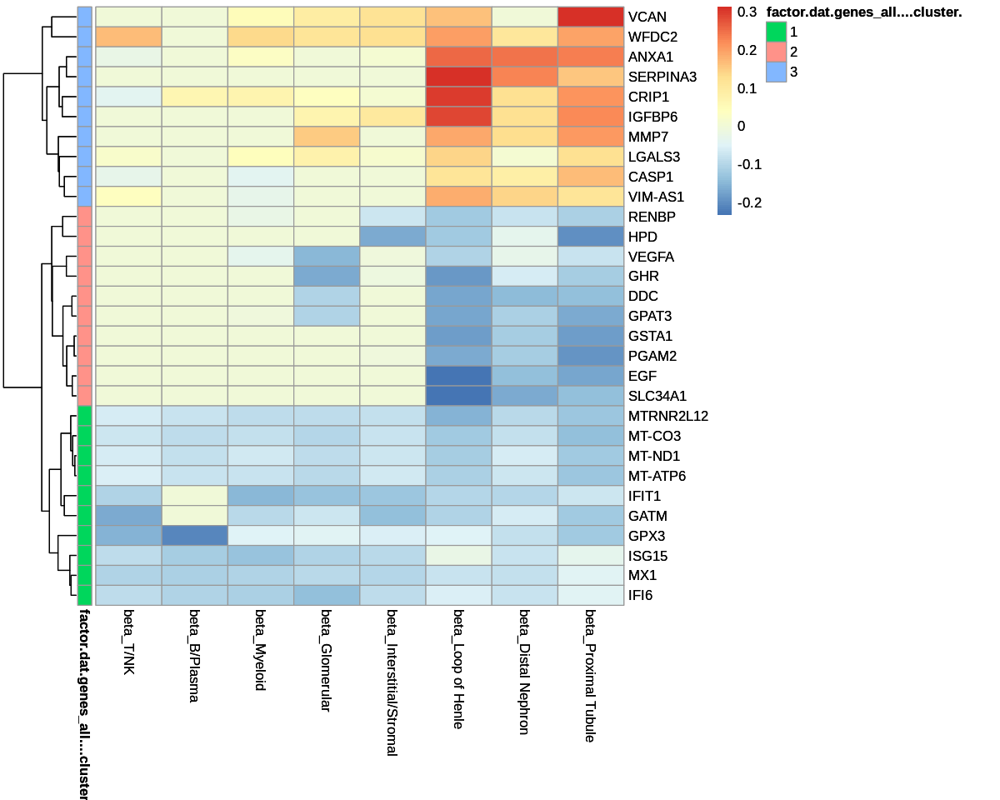

In [597]:
fig.size(8, 10)
annotation_row <- data.frame(factor(dat[genes_all, ] $cluster))
rownames(annotation_row) <- rownames(dat[genes_all, ] )

heatmap_res = pheatmap(dat[genes_all, ] %>% dplyr::select(-cluster), annotation_row = annotation_row,
        cluster_cols=FALSE)
heatmap_res

In [563]:
# dat_order = (dat[genes_all, ] %>% dplyr::select(-cluster))[heatmap_res$tree_row$order, ]

In [630]:
genes_all_order = rownames(dat[genes_all, ][heatmap_res$tree_row$order, ]) 

clus_order = colnames(dat %>% dplyr::select(-cluster) )%>% str_replace('beta_', '')

In [642]:
genes_all_order[1:n]%>% length

genes_all_order[(n+1):(2*n)]%>% length

genes_all_order[(2*n+1):(3*n)] %>% length

[1] 10

[1] 10

[1] 10

In [634]:
genes_all_order[6:10]

[1] "IGFBP6"  "MMP7"    "LGALS3"  "CASP1"   "VIM-AS1"

In [652]:
genes_all_order = c(genes_all_order[1:n],
                    genes_all_order[(2*n+1):(3*n)],
                   genes_all_order[(n+1):(2*n)]
                    )

In [653]:
genes_all_order %>% unique %>% length

[1] 30

In [654]:
genes_all_order %>% length

[1] 30

In [655]:
dat_order = dat[genes_all, ] %>% dplyr::select(-cluster) %>% rownames_to_column('feature') %>% pivot_longer(cols = -(feature), 
                                                names_to = 'cluster', values_to = 'beta')

dat_order$feature = factor(dat_order$feature, levels = genes_all_order)

In [656]:
dat_order$cluster = factor(dat_order$cluster %>% str_replace('beta_', ''), levels = clus_order)

In [659]:
vmax = (abs(dat_order$beta) %>% quantile(.95))[[1]] %>% round(2)
vmin = -vmax

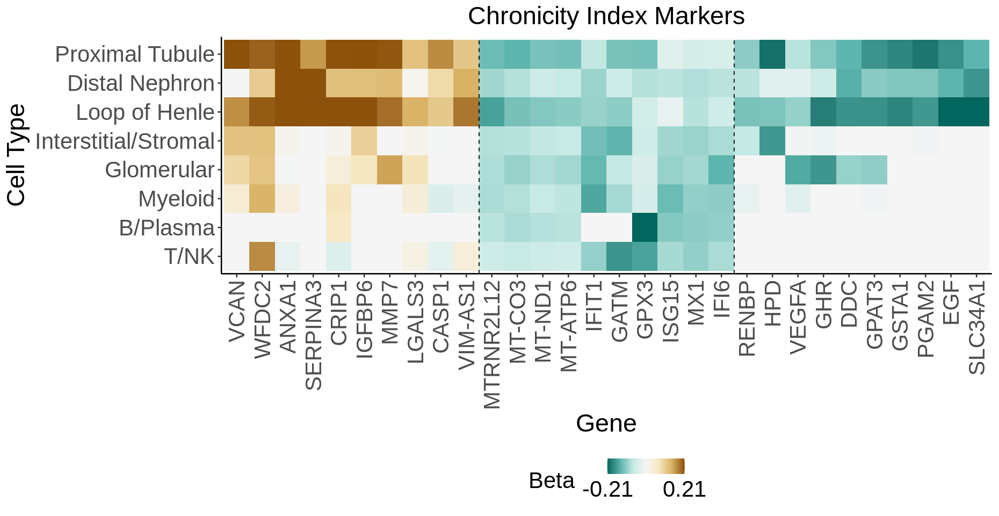

In [662]:
beta_heatmap = ggplot(dat_order, 
               aes(x = feature, y = cluster, 
                   fill = beta)) + 
    geom_tile() + 
    theme_classic(base_size = tickfontsize) + 
    scale_fill_gradientn(colours=rev(brewer.pal(7,"BrBG")), limits=c(vmin, vmax), 
                             oob = scales::squish, breaks = c(vmin, vmax))+
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = .5),
          axis.text = element_text( size = labelfontsize+5),
          axis.title = element_text(size = labelfontsize+8), 
          plot.title = element_text(size = labelfontsize+8, hjust = 0.5), 
          legend.text = element_text(size = labelfontsize+5),
          legend.title = element_text(size = labelfontsize+5),
          legend.position = 'bottom'

         ) + 
    geom_vline(xintercept = n + 0.5, linetype = 'dashed')+
    geom_vline(xintercept = 2*n + 0.5, linetype = 'dashed')+
    labs(x = "Gene", y = "Cell Type", fill = 'Beta    ', title = 'Chronicity Index Markers')

height = 8
width = 15.5
fig.size(height, width)

outplot = beta_heatmap
outplot

ggsave(paste0(figdir, 'de_gene_heatmap_chronicity.png'), plot = outplot,  
       height = height, width = width, dpi = 500)
ggsave(paste0(figdir, 'de_gene_heatmap_chronicity.pdf'), plot = outplot,  
       height = height, width = width, dpi = 500, device = cairo_pdf)

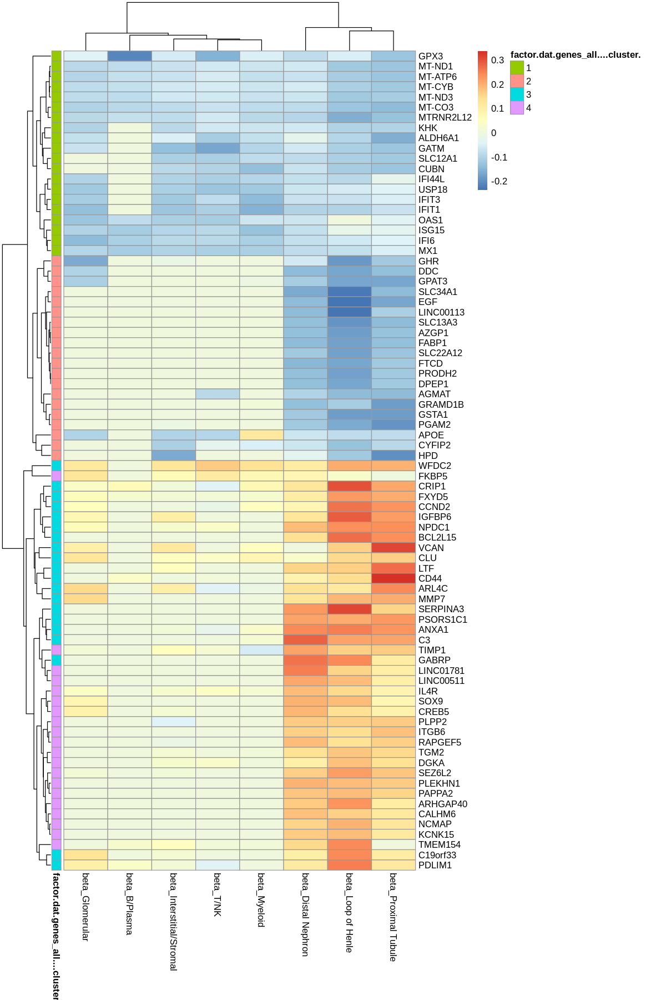

In [394]:
fig.size(15, 10)
annotation_row <- data.frame(factor(dat[genes_all, ] $cluster))
rownames(annotation_row) <- rownames(dat[genes_all, ] )

pheatmap(dat[genes_all, ] %>% dplyr::select(-cluster), annotation_row = annotation_row)

In [370]:
dat

,beta_T/NK,beta_B/Plasma,beta_Myeloid,beta_Glomerular,beta_Interstitial/Stromal,beta_Loop of Henle,beta_Distal Nephron,beta_Proximal Tubule,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
ISG15,-0.0910336606,-0.1139591089,-0.130070953,-0.102836307,-0.09506597,-0.022419632,-0.0779088754,-0.032880332,1
AGMAT,-0.0914266693,0.0000000000,0.000000000,0.000000000,0.00000000,-0.141734218,-0.1001712290,-0.141165866,2
NBL1,0.0481683026,0.0000000000,0.000000000,-0.001668323,0.05502830,0.117194744,-0.0260525653,0.101860459,3
RCAN3,0.0343953811,0.0000000000,0.045503721,-0.009368401,0.04321132,0.116132236,0.0187238771,0.123600373,3
IFI6,-0.0899486257,-0.1047193970,-0.108248265,-0.138428871,-0.08876344,-0.058719488,-0.0785981822,-0.045057723,1
PLK3,0.0429263048,0.0000000000,-0.002911797,0.000000000,-0.01461086,0.145086387,0.0736140639,0.135637099,4
IFI44L,-0.1036895448,0.0000000000,-0.095015459,-0.101798368,-0.09783830,-0.086172079,-0.0746906686,-0.023607530,1
GBP2,-0.0386358060,0.0000000000,-0.054209427,0.028370994,0.00144252,0.124178400,0.0523051069,0.163558178,3
S100A11,-0.0171094689,0.0035391281,-0.001431699,0.064384298,0.02021079,0.152015874,0.0493869135,0.122634388,3


In [312]:
sum(names(annotation_row) == rownames(dat))

[1] 441

In [306]:
dat$cluster %>% as.character

[1] "1" "2" "3" "3" "1" "4" "1" "3" "3" "3" "1" "3" "1" "1" "1" "1" "3" "3"
 [19] "1" "4" "3" "4" "1" "1" "3" "4" "5" "3" "3" "3" "4" "3" "4" "2" "3" "1"
 [37] "2" "4" "4" "4" "3" "1" "3" "1" "1" "3" "5" "1" "3" "4" "3" "1" "4" "4"
 [55] "1" "1" "1" "3" "4" "3" "3" "4" "3" "3" "3" "3" "3" "3" "3" "3" "3" "3"
 [73] "3" "4" "3" "1" "1" "4" "1" "3" "3" "1" "3" "4" "3" "1" "1" "3" "4" "4"
 [91] "5" "4" "3" "1" "3" "1" "3" "3" "3" "3" "3" "3" "4" "3" "4" "2" "3" "3"
[109] "3" "3" "3" "3" "3" "1" "1" "3" "1" "3" "3" "3" "5" "3" "3" "4" "3" "4"
[127] "1" "1" "1" "1" "1" "4" "2" "3" "1" "1" "6" "3" "3" "2" "1" "3" "4" "3"
[145] "4" "3" "2" "3" "3" "3" "3" "2" "4" "1" "1" "4" "2" "3" "4" "1" "2" "3"
[163] "1" "1" "3" "4" "3" "2" "2" "3" "3" "1" "3" "2" "3" "4" "3" "3" "3" "3"
[181] "4" "1" "3" "3" "3" "1" "3" "3" "1" "3" "4" "4" "3" "3" "1" "2" "3" "1"
[199] "1" "3" "3" "3" "1" "3" "2" "4" "2" "3" "3" "4" "3" "1" "2" "1" "3" "2"
[217] "2" "1" "3" "1" "2" "3" "3" "3" "4" "3" "3" "3" "3" "3" "2" "1" "4" "2"
[235] "3" "3" "3" "3" "1" "1" "1" "3" "4" "3" "3" "1" "3" "4" "3" "4" "4" "2"
[253] "4" "3" "3" "4" "1" "6" "4" "3" "3" "3" "1" "2" "3" "2" "4" "2" "4" "3"
[271] "4" "4" "3" "1" "3" "4" "4" "2" "3" "2" "3" "3" "4" "4" "2" "2" "2" "1"
[289] "6" "4" "3" "2" "2" "6" "1" "3" "4" "3" "2" "4" "3" "4" "3" "4" "2" "3"
[307] "3" "3" "3" "4" "2" "4" "4" "3" "3" "2" "2" "3" "4" "3" "3" "4" "3" "4"
[325] "4" "2" "2" "4" "2" "1" "4" "4" "2" "4" "3" "2" "4" "5" "2" "5" "1" "3"
[343] "4" "2" "2" "3" "2" "2" "2" "3" "2" "4" "3" "3" "5" "2" "2" "2" "5" "4"
[361] "4" "4" "2" "4" "1" "2" "3" "4" "2" "2" "1" "4" "4" "2" "1" "6" "2" "1"
[379] "2" "2" "4" "2" "2" "2" "4" "2" "4" "3" "2" "2" "2" "4" "4" "3" "4" "3"
[397] "2" "2" "2" "3" "4" "2" "2" "4" "4" "4" "4" "2" "2" "3" "3" "4" "3" "1"
[415] "2" "2" "3" "3" "4" "4" "4" "4" "2" "4" "2" "2" "4" "2" "2" "2" "3" "2"
[433] "2" "2" "2" "3" "2" "3" "3" "2" "2"

In [300]:
dat %>% dim
annotation_row %>% length

[1] 441   9

[1] 441

In [ ]:
scale_fill_brewer(palette = "Dark2")


In [124]:
res_all %>% filter(padj < 0.05) %>% arrange(desc(beta))

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
NNMT,0.3981570,0.05007017,7.951980,1.595390e-13,Distal Nephron,2.536990e-09
S100A9,0.3853854,0.04625274,8.332165,7.416290e-13,Proximal Tubule,1.094644e-08
NNMT,0.3588133,0.04762246,7.534540,5.466294e-12,Proximal Tubule,8.068250e-08
CAPN8,0.3562166,0.03925169,9.075194,1.110223e-16,Loop of Henle,1.661449e-12
NNMT,0.3471234,0.04545848,7.636053,3.025358e-13,Loop of Henle,4.527448e-09
NUPR1,0.3455211,0.04562518,7.573034,2.330025e-12,Myeloid,2.184631e-08
CFH,0.3420144,0.04504687,7.592411,1.039058e-12,Proximal Tubule,1.533649e-08
LCN2,0.3381765,0.04478593,7.550955,1.521782e-10,Proximal Tubule,2.246150e-06
CD44,0.3371692,0.03633795,9.278705,1.110223e-16,Proximal Tubule,1.638689e-12


In [125]:
res_all[grep("^IF|^IS", res_all$gene), ] %>% filter(padj < 0.05) %>% arrange(desc(beta))

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
IFI16,0.17281725,0.026001915,6.646328,5.150894e-10,Proximal Tubule,7.602720e-06
IFITM2,0.15598178,0.021727399,7.179036,7.353340e-12,Proximal Tubule,1.085353e-07
IFI27L2,0.09577743,0.015305919,6.257542,2.622343e-09,Proximal Tubule,3.870578e-05
IFNAR2,0.09391765,0.014539944,6.459286,1.324118e-09,Proximal Tubule,1.954398e-05
IFNAR2,0.09370426,0.012771681,7.336878,1.328249e-11,Loop of Henle,1.987724e-07
IFNAR2,0.08787872,0.014038579,6.259801,1.958753e-09,Distal Nephron,3.114809e-05
IFI27L1,0.08332541,0.011370710,7.328075,9.381829e-12,Proximal Tubule,1.384758e-07
IFITM2,0.07021919,0.014390853,4.879432,2.613667e-06,Loop of Henle,3.911352e-02
IFT43,0.06325551,0.008243451,7.673426,4.167777e-12,Loop of Henle,6.237079e-08


In [127]:
res_all[grep("^IF|^IS", res_all$gene), ] %>% arrange(desc(beta))

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
IFI27,0.18585331,0.052381989,3.548038,1.867897e-03,Loop of Henle,1.000000e+00
IFI16,0.17281725,0.026001915,6.646328,5.150894e-10,Proximal Tubule,7.602720e-06
ISG20,0.17109638,0.039923262,4.285631,1.983732e-04,Loop of Henle,1.000000e+00
IFITM2,0.15598178,0.021727399,7.179036,7.353340e-12,Proximal Tubule,1.085353e-07
ISG20,0.14126653,0.037018474,3.816109,3.014137e-04,Distal Nephron,1.000000e+00
IFI27,0.09920100,0.046427704,2.136677,3.600846e-02,Distal Nephron,1.000000e+00
IFI27L2,0.09577743,0.015305919,6.257542,2.622343e-09,Proximal Tubule,3.870578e-05
IFNAR2,0.09391765,0.014539944,6.459286,1.324118e-09,Proximal Tubule,1.954398e-05
IFNAR2,0.09370426,0.012771681,7.336878,1.328249e-11,Loop of Henle,1.987724e-07


In [157]:
res_all %>% filter(gene %in% isg_genes_large) %>% filter(padj < 0.05) %>% arrange(desc(beta))

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
SERPING1,0.1594177,0.01946160,8.191398,1.920686e-14,Proximal Tubule,2.834932e-10
TYMP,0.1074341,0.02128432,5.047571,2.688144e-06,Loop of Henle,4.022807e-02


In [158]:
res_all %>% filter(gene %in% isg_genes_large) %>% arrange(desc(beta))

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
SERPING1,0.1594177213,0.01946160,8.19139766,1.920686e-14,Proximal Tubule,2.834932e-10
TYMP,0.1074341480,0.02128432,5.04757143,2.688144e-06,Loop of Henle,4.022807e-02
PSMB9,0.0899893827,0.02833092,3.17636619,3.143739e-03,Loop of Henle,1.000000e+00
TYMP,0.0785250620,0.01779958,4.41162359,1.752890e-05,Distal Nephron,2.787446e-01
TNFSF10,0.0772647618,0.02040835,3.78593855,2.561852e-04,Loop of Henle,1.000000e+00
IFITM3,0.0734442819,0.02369480,3.09959436,2.488977e-03,Proximal Tubule,1.000000e+00
TNFSF10,0.0630725879,0.02337886,2.69784660,1.105407e-02,Glomerular,1.000000e+00
LY6E,0.0620193433,0.02754505,2.25156014,3.185592e-02,Loop of Henle,1.000000e+00
TNFSF10,0.0602998862,0.01555042,3.87770198,9.115105e-05,Proximal Tubule,1.000000e+00


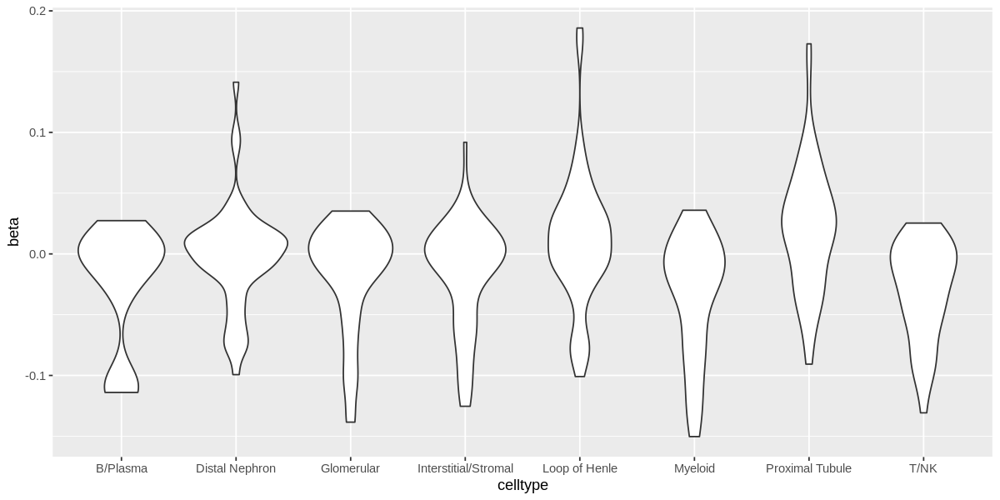

In [89]:
ggplot(res_all[grep("^IF|^IS", res_all$gene), ])+
    geom_violin(aes(x = celltype, y = beta))

In [ ]:
res_all %>% filter(gene %in% isg_genes_large)

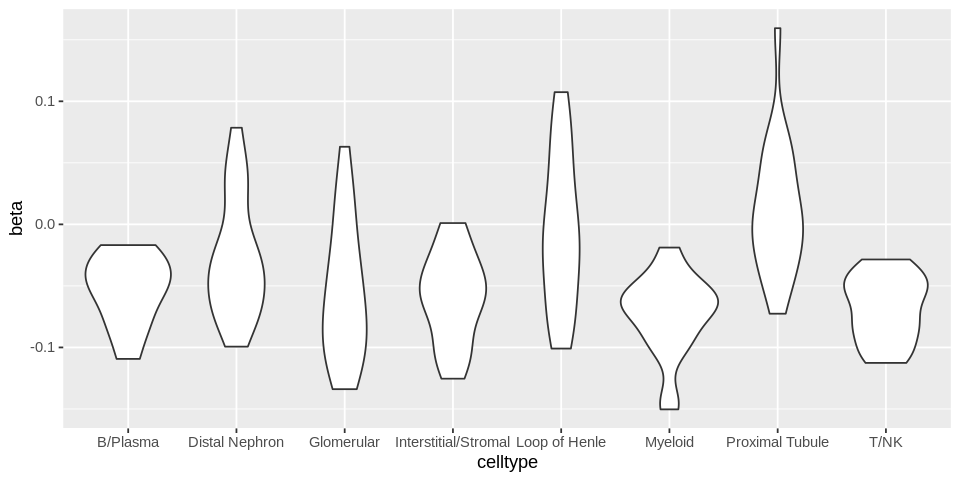

In [160]:
fig.size(4, 8)
ggplot(res_all %>% filter(gene %in% isg_genes_large))+
    geom_violin(aes(x = celltype, y = beta))

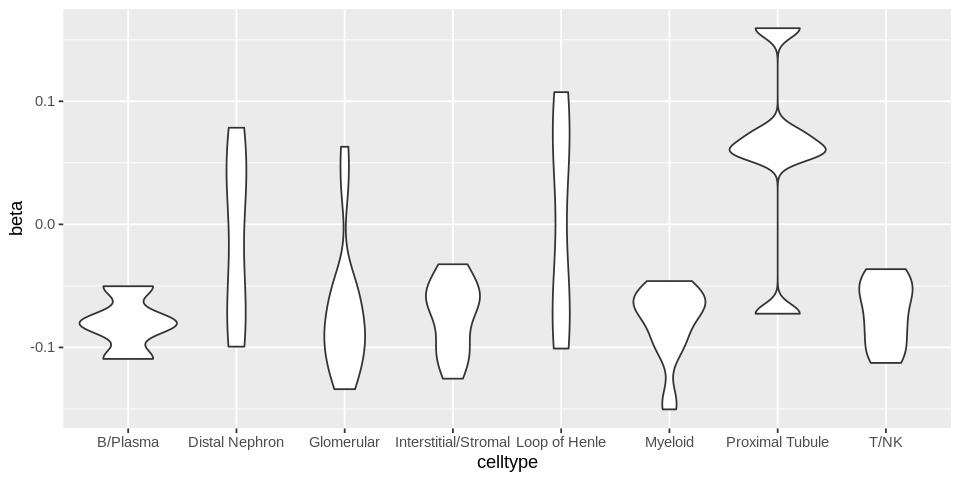

In [218]:
fig.size(4, 8)
ggplot(res_all %>% filter(p < 0.05, gene %in% isg_genes_large))+
    geom_violin(aes(x = celltype, y = beta))

In [41]:
gsea_list[['all']] %>% filter(padj < 0.05) %>% dplyr::select(-leadingEdge) %>% arrange(desc(NES)) %>% head(50)

,pathway,pval,padj,log2err,ES,NES,size,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,GOCC_CYTOSOLIC_RIBOSOME,1.921261e-19,1.488977e-15,1.1421912,0.7179632,2.964882,92,all
2,GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT,4.024619e-14,3.119080e-10,0.9653278,0.7540425,2.885590,54,all
3,GOBP_CYTOPLASMIC_TRANSLATION,4.161843e-19,3.225428e-15,1.1330899,0.6314222,2.836265,141,all
4,HP_OSTEOSARCOMA,4.735761e-08,3.670215e-04,0.7195128,0.7675737,2.635642,33,all
5,GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME,1.255328e-16,9.728793e-13,1.0476265,0.5850459,2.627247,155,all
6,GOCC_RIBOSOMAL_SUBUNIT,6.914806e-14,5.358974e-10,0.9545416,0.5479308,2.516004,169,all
7,HP_PERSISTENCE_OF_HEMOGLOBIN_F,8.898453e-08,6.896301e-04,0.7049757,0.7809256,2.515296,26,all
8,GOCC_POLYSOMAL_RIBOSOME,4.326294e-07,3.352878e-03,0.6749629,0.7418840,2.506826,29,all
9,HP_PURE_RED_CELL_APLASIA,7.542752e-07,5.845633e-03,0.6594444,0.7584683,2.463442,24,all


In [42]:
gsea_list[['all']] %>% filter(padj < 0.05) %>% dplyr::select(-leadingEdge) %>% arrange(desc(NES)) %>% tail(50)

,pathway,pval,padj,log2err,ES,NES,size,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
229,HP_APLASIA_HYPOPLASIA_OF_THE_CEREBRAL_WHITE_MATTER,3.439316e-08,2.665470e-04,0.7195128,-0.8437067,-2.529849,16,all
230,HP_HYPOKALEMIA,1.431311e-09,1.109266e-05,0.7881868,-0.6268596,-2.533941,53,all
231,GOBP_FATTY_ACID_CATABOLIC_PROCESS,4.132435e-12,3.202637e-08,0.8870750,-0.5692509,-2.534604,95,all
232,GOMF_ELECTRON_TRANSFER_ACTIVITY,1.601617e-12,1.241253e-08,0.9101197,-0.5467457,-2.536751,114,all
233,HP_ABNORMAL_CIRCULATING_FATTY_ACID_CONCENTRATION,1.047760e-09,8.120141e-06,0.7881868,-0.6376753,-2.537013,53,all
234,HP_ABNORMAL_CIRCULATING_PROTEINOGENIC_AMINO_ACID_DERIVATIVE_CONCENTRATION,1.722788e-09,1.335160e-05,0.7881868,-0.6281273,-2.537074,52,all
235,HP_ABNORMAL_CIRCULATING_NON_PROTEINOGENIC_AMINO_ACID_CONCENTRATION,8.122939e-08,6.295278e-04,0.7049757,-0.7829201,-2.552064,21,all
236,HP_ABNORMALITY_OF_THE_MITOCHONDRION,1.684122e-16,1.305195e-12,1.0476265,-0.5264867,-2.574797,172,all
237,HP_ABNORMAL_CSF_METABOLITE_LEVEL,4.238568e-13,3.284890e-09,0.9325952,-0.5601971,-2.575304,110,all


In [62]:
paths_plot = rbind(gsea_list[['all']] %>% filter(padj < 0.05) %>% 
                   arrange(desc(NES)) %>% dplyr::select(pathway, NES) %>% head(4), 
                   gsea_list[['all']] %>% filter(padj < 0.05) %>% 
                   arrange(desc(NES)) %>% dplyr::select(pathway, NES) %>% tail(4))
paths_plot = paths_plot$pathway

In [214]:
nctypes = 3

pathlist = ((gsea_all %>% filter(padj < 0.05, NES > 0))$pathway %>% table)
pathlist = pathlist[pathlist > nctypes] %>% names

sig_paths_up = pathlist

sig_paths_up

pathlist = ((gsea_all %>% filter(padj < 0.05, NES < 0))$pathway %>% table)
pathlist = pathlist[pathlist > nctypes] %>% names

sig_paths_down = pathlist

sig_paths_down

[1] "GOBP_CYTOPLASMIC_TRANSLATION"                       
 [2] "GOBP_NCRNA_METABOLIC_PROCESS"                       
 [3] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_BIOGENESIS"          
 [4] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_SUBUNIT_ORGANIZATION"
 [5] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS"            
 [6] "GOBP_RIBOSOME_BIOGENESIS"                           
 [7] "GOBP_RRNA_METABOLIC_PROCESS"                        
 [8] "GOCC_ACTIN_CYTOSKELETON"                            
 [9] "GOCC_CELL_SUBSTRATE_JUNCTION"                       
[10] "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"      
[11] "GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT"             
[12] "GOCC_CYTOSOLIC_RIBOSOME"                            
[13] "GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT"             
[14] "GOCC_EXTERNAL_ENCAPSULATING_STRUCTURE"              
[15] "GOCC_LARGE_RIBOSOMAL_SUBUNIT"                       
[16] "GOCC_MICROTUBULE"                                   
[17] "GOCC_POLYSOMAL_RIBOSOME"                            
[18] "GOCC_RIBOSOMAL_SUBUNIT"                             
[19] "GOCC_RIBOSOME"                                      
[20] "GOMF_CADHERIN_BINDING"                              
[21] "GOMF_CELL_ADHESION_MOLECULE_BINDING"                
[22] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"            
[23] "GOMF_STRUCTURAL_MOLECULE_ACTIVITY"                  
[24] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"         
[25] "HALLMARK_MYC_TARGETS_V1"                            
[26] "HP_ERYTHROID_HYPOPLASIA"                            
[27] "HP_OSTEOSARCOMA"                                    
[28] "HP_PERSISTENCE_OF_HEMOGLOBIN_F"                     
[29] "HP_PURE_RED_CELL_APLASIA"

[1] "GOBP_AEROBIC_RESPIRATION"                                            
 [2] "GOBP_ALCOHOL_METABOLIC_PROCESS"                                      
 [3] "GOBP_ATP_METABOLIC_PROCESS"                                          
 [4] "GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT"                       
 [5] "GOBP_CELLULAR_AMINO_ACID_CATABOLIC_PROCESS"                          
 [6] "GOBP_CELLULAR_AMINO_ACID_METABOLIC_PROCESS"                          
 [7] "GOBP_CELLULAR_RESPIRATION"                                           
 [8] "GOBP_DEFENSE_RESPONSE_TO_SYMBIONT"                                   
 [9] "GOBP_ENERGY_DERIVATION_BY_OXIDATION_OF_ORGANIC_COMPOUNDS"            
[10] "GOBP_FATTY_ACID_METABOLIC_PROCESS"                                   
[11] "GOBP_GENERATION_OF_PRECURSOR_METABOLITES_AND_ENERGY"                 
[12] "GOBP_MONOCARBOXYLIC_ACID_METABOLIC_PROCESS"                          
[13] "GOBP_ORGANIC_ACID_CATABOLIC_PROCESS"                                 
[14] "GOBP_OXIDATIVE_PHOSPHORYLATION"                                      
[15] "GOBP_PROTON_TRANSMEMBRANE_TRANSPORT"                                 
[16] "GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN"                           
[17] "GOBP_RESPONSE_TO_VIRUS"                                              
[18] "GOBP_SMALL_MOLECULE_BIOSYNTHETIC_PROCESS"                            
[19] "GOBP_SMALL_MOLECULE_CATABOLIC_PROCESS"                               
[20] "GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX"                   
[21] "GOCC_MITOCHONDRIAL_MATRIX"                                           
[22] "GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX"                       
[23] "GOCC_OXIDOREDUCTASE_COMPLEX"                                         
[24] "GOCC_RESPIRASOME"                                                    
[25] "GOMF_ACTIVE_ION_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"                  
[26] "GOMF_ACTIVE_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"                      
[27] "GOMF_CATION_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"                      
[28] "GOMF_ELECTRON_TRANSFER_ACTIVITY"                                     
[29] "GOMF_INORGANIC_MOLECULAR_ENTITY_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"  
[30] "GOMF_NAD_BINDING"                                                    
[31] "GOMF_OXIDOREDUCTION_DRIVEN_ACTIVE_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"
[32] "GOMF_PRIMARY_ACTIVE_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"              
[33] "GOMF_PROTON_TRANSMEMBRANE_TRANSPORTER_ACTIVITY"                      
[34] "HALLMARK_FATTY_ACID_METABOLISM"                                      
[35] "HALLMARK_INTERFERON_ALPHA_RESPONSE"                                  
[36] "HALLMARK_INTERFERON_GAMMA_RESPONSE"                                  
[37] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"                                  
[38] "HP_ABNORMAL_BLOOD_GLUCOSE_CONCENTRATION"                             
[39] "HP_ABNORMAL_CIRCULATING_AMINO_ACID_CONCENTRATION"                    
[40] "HP_ABNORMAL_CIRCULATING_CARBOXYLIC_ACID_CONCENTRATION"               
[41] "HP_ABNORMAL_CSF_METABOLITE_LEVEL"                                    
[42] "HP_ABNORMAL_MITOCHONDRIA_IN_MUSCLE_TISSUE"                           
[43] "HP_ABNORMAL_URINE_METABOLITE_LEVEL"                                  
[44] "HP_ABNORMAL_URINE_PH"                                                
[45] "HP_ABNORMALITY_OF_ACID_BASE_HOMEOSTASIS"                             
[46] "HP_ABNORMALITY_OF_THE_BASAL_GANGLIA"                                 
[47] "HP_ABNORMALITY_OF_THE_MITOCHONDRION"                                 
[48] "HP_ABNORMALITY_OF_URINE_HOMEOSTASIS"                                 
[49] "HP_DYSTONIA"                                                         
[50] "HP_ENCEPHALOPATHY"                                                   
[51] "HP_HEADACHE"                                                         
[52] "HP_INCREASED_CSF_LACTATE"                                            
[53] "HP_INCREASED_SERUM_LACTATE"                

In [215]:
paths_plot = c(sig_paths_up, sig_paths_down)

In [216]:
dat = gsea_all %>% filter(pathway %in% paths_plot)# %>% pivot_wider(names_from = celltype, values_from = NES, id_cols = pathway)%>% as.data.frame
# rownames(dat) = dat$pathway
dat$pathway = factor(dat$pathway, levels = rev(paths_plot))


In [132]:
# map = c(setNames('All', 'all'))
# for (ctype in celltypes){
#     name = ctype_list[[ctype]][3]
#     map = c(map, setNames(ctype, name))
# }

In [133]:
# dat$celltype_rename = map[dat$celltype]

In [77]:
gsea_all %>% filter(pathway %in% c('HALLMARK_INTERFERON_ALPHA_RESPONSE',
                                  'HALLMARK_INTERFERON_GAMMA_RESPONSE')) %>% dplyr::select(-leadingEdge) %>% arrange(desc(NES))

pathway,pval,padj,log2err,ES,NES,size,celltype,celltype_rename
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.068981e-09,7.578007e-06,0.78818681,0.4363220,2.200548,164,loh,Loop of Henle
HALLMARK_INTERFERON_ALPHA_RESPONSE,4.534413e-04,1.000000e+00,0.49849311,0.3785256,1.720451,91,loh,Loop of Henle
HALLMARK_INTERFERON_GAMMA_RESPONSE,5.379499e-03,1.000000e+00,0.40701792,0.3165182,1.458379,166,pt,Proximal Tubule
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.449115e-01,1.000000e+00,0.11776579,0.2912905,1.186806,168,dn,Distal Nephron
HALLMARK_INTERFERON_ALPHA_RESPONSE,5.642458e-01,1.000000e+00,0.04522474,0.2230419,0.951677,91,pt,Proximal Tubule
HALLMARK_INTERFERON_ALPHA_RESPONSE,3.712121e-01,1.000000e+00,0.20207171,-0.2263826,-1.043956,93,dn,Distal Nephron
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.387182e-05,1.850066e-01,0.57561026,-0.3429310,-1.738864,190,all,All
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.362148e-06,1.415399e-02,0.62725674,-0.4323201,-1.981757,127,glom,Glomerular
HALLMARK_INTERFERON_ALPHA_RESPONSE,1.518280e-10,1.176667e-06,0.82665730,-0.5534061,-2.478590,94,all,All


In [ ]:
# paths_plot

[1] "GOBP_ACTIVATION_OF_IMMUNE_RESPONSE"         
[2] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION" 
[3] "GOBP_POSITIVE_REGULATION_OF_IMMUNE_RESPONSE"
[4] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_BIOGENESIS"  
[5] "GOBP_SMALL_MOLECULE_CATABOLIC_PROCESS"      
[6] "GOBP_ORGANIC_ACID_METABOLIC_PROCESS"        
[7] "GOBP_ORGANIC_ACID_CATABOLIC_PROCESS"        
[8] "HP_ABNORMALITY_OF_ACID_BASE_HOMEOSTASIS"

In [524]:
# paths_plot_short = c('H_IFN_ALPHA', 'H_IFN_GAMMA',
#                     'GOMF_CALCIUM_PB', 'GOBP_TRMEM_TRANS',
#                     'GOBP_ORG_INNERMEM', 'HP_MYOPATHY', 'GOCC_MITOPROT_COMP',
#                     'GOCC_INNERMITOMEM')

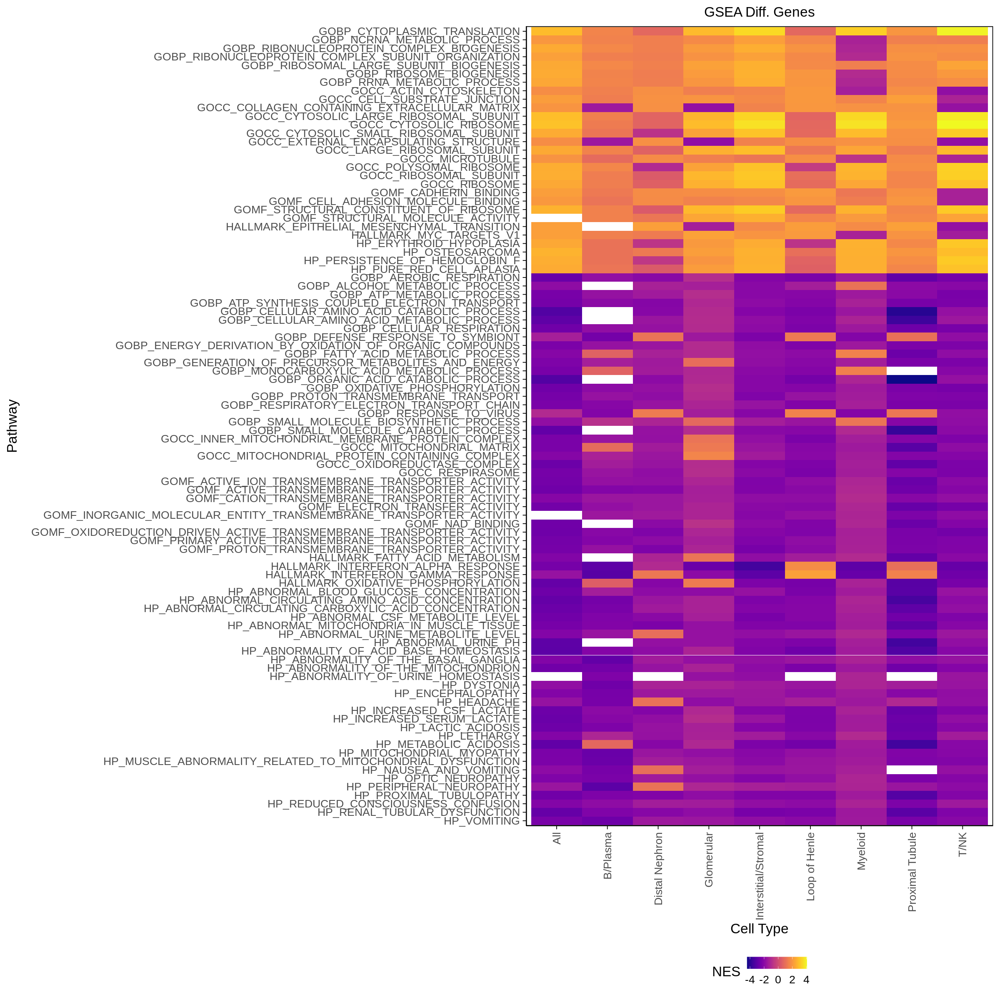

In [79]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    # scale_y_discrete(labels = rev(paths_plot_short))+# Border around the panel
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 20
width = 20
fig.size(height, width)
outplot = hmap
outplot

# ggsave(paste0(figdir, 'gsea_heatmap_casectrl.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'gsea_heatmap_casectrl.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)


In [80]:
paths_plot 

[1] "GOBP_CYTOPLASMIC_TRANSLATION"                                        
 [2] "GOBP_NCRNA_METABOLIC_PROCESS"                                        
 [3] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_BIOGENESIS"                           
 [4] "GOBP_RIBONUCLEOPROTEIN_COMPLEX_SUBUNIT_ORGANIZATION"                 
 [5] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS"                             
 [6] "GOBP_RIBOSOME_BIOGENESIS"                                            
 [7] "GOBP_RRNA_METABOLIC_PROCESS"                                         
 [8] "GOCC_ACTIN_CYTOSKELETON"                                             
 [9] "GOCC_CELL_SUBSTRATE_JUNCTION"                                        
[10] "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"                       
[11] "GOCC_CYTOSOLIC_LARGE_RIBOSOMAL_SUBUNIT"                              
[12] "GOCC_CYTOSOLIC_RIBOSOME"                                             
[13] "GOCC_CYTOSOLIC_SMALL_RIBOSOMAL_SUBUNIT"                              
[14] "GOCC_EXTERNAL_ENCAPSULATING_STRUCTURE"                               
[15] "GOCC_LARGE_RIBOSOMAL_SUBUNIT"                                        
[16] "GOCC_MICROTUBULE"                                                    
[17] "GOCC_POLYSOMAL_RIBOSOME"                                             
[18] "GOCC_RIBOSOMAL_SUBUNIT"                                              
[19] "GOCC_RIBOSOME"                                                       
[20] "GOMF_CADHERIN_BINDING"                                               
[21] "GOMF_CELL_ADHESION_MOLECULE_BINDING"                                 
[22] "GOMF_STRUCTURAL_CONSTITUENT_OF_RIBOSOME"                             
[23] "GOMF_STRUCTURAL_MOLECULE_ACTIVITY"                                   
[24] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"                          
[25] "HALLMARK_MYC_TARGETS_V1"                                             
[26] "HP_ERYTHROID_HYPOPLASIA"                                             
[27] "HP_OSTEOSARCOMA"                                                     
[28] "HP_PERSISTENCE_OF_HEMOGLOBIN_F"                                      
[29] "HP_PURE_RED_CELL_APLASIA"                                            
[30] "GOBP_AEROBIC_RESPIRATION"                                            
[31] "GOBP_ALCOHOL_METABOLIC_PROCESS"                                      
[32] "GOBP_ATP_METABOLIC_PROCESS"                                          
[33] "GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT"                       
[34] "GOBP_CELLULAR_AMINO_ACID_CATABOLIC_PROCESS"                          
[35] "GOBP_CELLULAR_AMINO_ACID_METABOLIC_PROCESS"                          
[36] "GOBP_CELLULAR_RESPIRATION"                                           
[37] "GOBP_DEFENSE_RESPONSE_TO_SYMBIONT"                                   
[38] "GOBP_ENERGY_DERIVATION_BY_OXIDATION_OF_ORGANIC_COMPOUNDS"            
[39] "GOBP_FATTY_ACID_METABOLIC_PROCESS"                                   
[40] "GOBP_GENERATION_OF_PRECURSOR_METABOLITES_AND_ENERGY"                 
[41] "GOBP_MONOCARBOXYLIC_ACID_METABOLIC_PROCESS"                          
[42] "GOBP_ORGANIC_ACID_CATABOLIC_PROCESS"                                 
[43] "GOBP_OXIDATIVE_PHOSPHORYLATION"                                      
[44] "GOBP_PROTON_TRANSMEMBRANE_TRANSPORT"                                 
[45] "GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN"                           
[46] "GOBP_RESPONSE_TO_VIRUS"                                              
[47] "GOBP_SMALL_MOLECULE_BIOSYNTHETIC_PROCESS"                            
[48] "GOBP_SMALL_MOLECULE_CATABOLIC_PROCESS"                               
[49] "GOCC_INNER_MITOCHONDRIAL_MEMBRANE_PROTEIN_COMPLEX"                   
[50] "GOCC_MITOCHONDRIAL_MATRIX"                                           
[51] "GOCC_MITOCHONDRIAL_PROTEIN_CONTAINING_COMPLEX"                       
[52] "GOCC_OXIDOREDUCTASE_COMPLEX"                                         
[53] "GOCC_RESPIRASOME"                          

In [211]:
pathways['HP_RENAL_TUBULAR_DYSFUNCTION']
pathways[['HP_RENAL_TUBULAR_DYSFUNCTION']] %>% length

pathways['HP_ABNORMAL_URINE_PH']
pathways[['HP_ABNORMAL_URINE_PH']] %>% length

intersect(pathways[['HP_RENAL_TUBULAR_DYSFUNCTION']], pathways[['HP_ABNORMAL_URINE_PH']])
intersect(pathways[['HP_RENAL_TUBULAR_DYSFUNCTION']], pathways[['HP_ABNORMAL_URINE_PH']]) %>% length

$HP_RENAL_TUBULAR_DYSFUNCTION
  [1] "ABCC8"    "ALDOB"    "ATP6V0A4" "ATP6V1B1" "ATP7B"    "BCS1L"   
  [7] "CA2"      "CAD"      "CLCN5"    "CLCNKB"   "CLDN16"   "COA8"    
 [13] "COG6"     "COQ2"     "CPT1A"    "CTNS"     "CYP11B2"  "EHHADH"  
 [19] "EPG5"     "ETFA"     "ETFB"     "ETFDH"    "FAH"      "FBXL4"   
 [25] "FN1"      "FOXRED1"  "GATA3"    "GATM"     "GCK"      "GNAS"    
 [31] "HBB"      "HNF1B"    "HNF1B"    "HNF4A"    "INS"      "JAG1"    
 [37] "KCNJ11"   "KCNJ2"    "KCNJ5"    "KYNU"     "LRP2"     "MMUT"    
 [43] "MT-CO1"   "MT-CO2"   "MT-CO3"   "MT-ND1"   "MT-ND2"   "MT-ND3"  
 [49] "MT-ND4"   "MT-ND5"   "MT-ND6"   "MT-TF"    "MT-TH"    "MT-TL1"  
 [55] "MT-TN"    "MT-TQ"    "MT-TS1"   "MT-TS2"   "MT-TW"    "NADK2"   
 [61] "NDUFA1"   "NDUFA11"  "NDUFA6"   "NDUFA6"   "NDUFA6"   "NDUFA6"  
 [67] "NDUFA6"   "NDUFAF1"  "NDUFAF2"  "NDUFAF3"  "NDUFAF4"  "NDUFAF5" 
 [73] "NDUFAF6"  "NDUFAF8"  "NDUFB10"  "NDUFB11"  "NDUFB3"   "NDUFB8"  
 [79] "NDUFB9"   "NDUFS1"   "NDUFS1"   "NDUFS2"   "NDUFS3"   "NDUFS3"  
 [85] "NDUFS4"   "NDUFS6"   "NDUFS7"   "NDUFS8"   "NDUFV1"   "NDUFV2"  
 [91] "NOTCH2"   "NUBPL"    "OCRL"     "PC"       "PDSS2"    "PDX1"    
 [97] "PEX19"    "PHEX"     "PHKA2"    "PHKG2"    "PIGA"     "PMM2"    
[103] "RMND1"    "RRM2B"    "SCO2"     "SLC12A3"  "SLC2A2"   "SLC34A1" 
[109] "SLC34A3"  "SLC4A1"   "SLC4A4"   "SLC5A2"   "STAT3"    "SURF1"   
[115] "SURF1"    "TIMMDC1"  "TMEM126B" "UQCC2"    "VIPAS39"  "VPS33B"

[1] 120

$HP_ABNORMAL_URINE_PH
 [1] "ABCD4"    "ACAD8"    "ACAD9"    "ACADM"    "ACADS"    "ACADVL"  
 [7] "ACSF3"    "AGXT"     "ALAD"     "ALDH5A1"  "BTD"      "CD320"   
[13] "COX16"    "CPOX"     "CPT2"     "D2HGDH"   "DHTKD1"   "DNAJC19" 
[19] "ETFA"     "ETFB"     "ETFDH"    "ETHE1"    "FLAD1"    "GATA1"   
[25] "GATM"     "GCDH"     "GRHPR"    "HADH"     "HCFC1"    "HGD"     
[31] "HLCS"     "HMBS"     "HMGCL"    "HOGA1"    "HPD"      "IDH2"    
[37] "KIF1B"    "L2HGDH"   "LDHD"     "LMBRD1"   "MCCC1"    "MCCC2"   
[43] "MCCC2"    "MCCC2"    "MCEE"     "MLYCD"    "MMAA"     "MMAB"    
[49] "MMACHC"   "MMADHC"   "MMUT"     "MPC1"     "MRPS2"    "MT-ATP6" 
[55] "MT-ND1"   "MT-ND2"   "MT-ND3"   "MT-ND4"   "MT-ND5"   "MT-ND6"  
[61] "MT-TK"    "MT-TL1"   "MT-TV"    "MT-TW"    "MVK"      "NADK2"   
[67] "NDUFB10"  "NDUFS4"   "NFS1"     "OXCT1"    "PCCA"     "PCCB"    
[73] "PDP1"     "PET117"   "PEX1"     "POLG"     "PPOX"     "PRDX1"   
[79] "RET"      "SCO1"     "SDHD"     "SLC25A1"  "SLC25A19" "SLC25A20"
[85] "SLC25A21" "SLC25A4"  "SLC26A1"  "SLC52A1"  "SLC52A2"  "SLC52A2" 
[91] "SUCLA2"   "SUCLG1"   "SUGCT"    "TAFAZZIN" "TAT"      "TCN2"    
[97] "UROC1"    "UROS"

[1] 98

[1] "ETFA"    "ETFB"    "ETFDH"   "GATM"    "MMUT"    "MT-ND1"  "MT-ND2" 
 [8] "MT-ND3"  "MT-ND4"  "MT-ND5"  "MT-ND6"  "MT-TL1"  "MT-TW"   "NADK2"  
[15] "NDUFB10" "NDUFS4"

[1] 16

In [220]:
paths_plot = intersect(paths_plot, c('GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX', 
                        'GOBP_CYTOPLASMIC_TRANSLATION',
                        'GOCC_RIBOSOMAL_SUBUNIT', 'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION',
                       
                        
                        'HALLMARK_INTERFERON_ALPHA_RESPONSE', 'HALLMARK_INTERFERON_GAMMA_RESPONSE',
                       'HP_RENAL_TUBULAR_DYSFUNCTION'))

In [225]:
paths_plot

[1] "GOBP_CYTOPLASMIC_TRANSLATION"                 
[2] "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"
[3] "GOCC_RIBOSOMAL_SUBUNIT"                       
[4] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"   
[5] "HALLMARK_INTERFERON_ALPHA_RESPONSE"           
[6] "HALLMARK_INTERFERON_GAMMA_RESPONSE"           
[7] "HP_RENAL_TUBULAR_DYSFUNCTION"

In [226]:
paths_plot_short = c('GOBP_CYTO_TRANS',
                     'GOCC_COLL_ECM',
                     'GOCC_RIBO_SUB',
                     'HALLMARK_EMT',
                     'HALLMARK_IFN_A',
                     'HALLMARK_IFN_G',
                     'HP_RENTUB_DYS'
)

In [222]:
dat = dat %>%filter(pathway %in% paths_plot)

In [223]:
dat = dat %>% mutate(label = ifelse(padj < 0.05, '﹡', ''))

Warning message in geom_text(aes(x = celltype_rename, y = pathway, label = label), :
“Ignoring unknown parameters: `fill`”


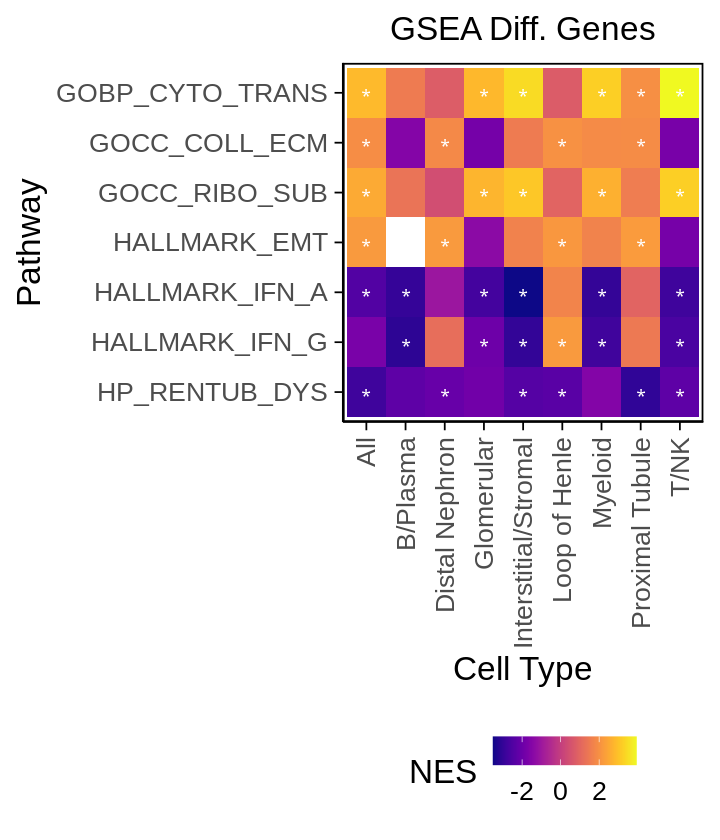

In [231]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    geom_text(aes(x = celltype_rename, y =pathway, label = label), fill = 'black', color = "white", size = 6) +
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    scale_y_discrete(labels = rev(paths_plot_short))+
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 7
width = 6
fig.size(height, width)
outplot = hmap
outplot

ggsave(paste0(figdir, 'gsea_heatmap_chronicity.png'), plot = outplot,  
       height = height, width = width, dpi = 500)
ggsave(paste0(figdir, 'gsea_heatmap_chronicity.pdf'), plot = outplot,  
       height = height, width = width, dpi = 500, device = cairo_pdf)


In [109]:
dat %>% filter(pathway %in% c('HALLMARK_INTERFERON_ALPHA_RESPONSE', 'HALLMARK_INTERFERON_GAMMA_RESPONSE')) %>% 
    dplyr::select(-leadingEdge) %>% arrange(desc(NES))

pathway,pval,padj,log2err,ES,NES,size,celltype,celltype_rename,label
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.068981e-09,7.578007e-06,0.78818681,0.4363220,2.200548,164,loh,Loop of Henle,﹡
HALLMARK_INTERFERON_ALPHA_RESPONSE,4.534413e-04,1.000000e+00,0.49849311,0.3785256,1.720451,91,loh,Loop of Henle,
HALLMARK_INTERFERON_GAMMA_RESPONSE,5.379499e-03,1.000000e+00,0.40701792,0.3165182,1.458379,166,pt,Proximal Tubule,
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.449115e-01,1.000000e+00,0.11776579,0.2912905,1.186806,168,dn,Distal Nephron,
HALLMARK_INTERFERON_ALPHA_RESPONSE,5.642458e-01,1.000000e+00,0.04522474,0.2230419,0.951677,91,pt,Proximal Tubule,
HALLMARK_INTERFERON_ALPHA_RESPONSE,3.712121e-01,1.000000e+00,0.20207171,-0.2263826,-1.043956,93,dn,Distal Nephron,
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.387182e-05,1.850066e-01,0.57561026,-0.3429310,-1.738864,190,all,All,
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.362148e-06,1.415399e-02,0.62725674,-0.4323201,-1.981757,127,glom,Glomerular,﹡
HALLMARK_INTERFERON_ALPHA_RESPONSE,1.518280e-10,1.176667e-06,0.82665730,-0.5534061,-2.478590,94,all,All,﹡


In [138]:
res_all %>% filter(gene %in% isg_genes_large) %>% filter(padj < 0.05)

gene,beta,stderr,z.score,p,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
TYMP,0.1074341,0.02128432,5.047571,2.688144e-06,Loop of Henle,4.022807e-02
SERPING1,0.1594177,0.01946160,8.191398,1.920686e-14,Proximal Tubule,2.834932e-10


In [104]:
paths_plot

[1] "GOBP_CYTOPLASMIC_TRANSLATION"                 
[2] "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"
[3] "GOCC_RIBOSOMAL_SUBUNIT"                       
[4] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"   
[5] "HALLMARK_INTERFERON_ALPHA_RESPONSE"           
[6] "HALLMARK_INTERFERON_GAMMA_RESPONSE"           
[7] "HP_ABNORMAL_URINE_PH"                         
[8] "HP_RENAL_TUBULAR_DYSFUNCTION"

In [332]:
genes_show = isg_genes_large

dat = res_all %>% filter(gene %in% isg_genes_large)
# dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

dat$gene = factor(dat$gene, levels = genes_show)

[1] 149   7

In [333]:
dat$celltype = factor(dat$celltype, levels = c('Loop of Henle', 'Proximal Tubule', 'Distal Nephron',
                                          'T/NK', 'B/Plasma', 'Myeloid', 'Glomerular', 'Interstitial/Stromal'))

In [334]:
dat$celltype %>% unique

[1] T/NK                 B/Plasma             Myeloid             
[4] Glomerular           Interstitial/Stromal Loop of Henle       
[7] Distal Nephron       Proximal Tubule     
8 Levels: Loop of Henle Proximal Tubule Distal Nephron T/NK ... Interstitial/Stromal

In [359]:
vmax = (abs(dat$beta) %>% quantile(.99))[[1]] %>% round(2)

In [360]:
vmax

[1] 0.15

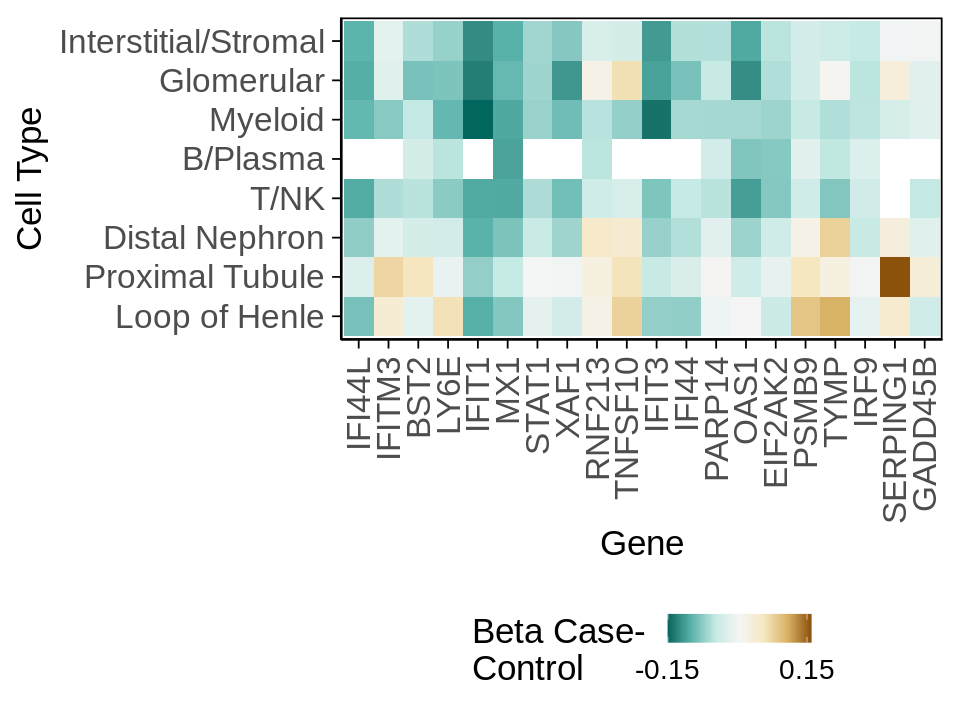

In [367]:
de_plot = ggplot(dat)+
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_gradientn(colours=rev(brewer.pal(7,"BrBG")), breaks = c(-vmax, vmax))+
    theme_classic(base_size = tickfontsize+5)+
    theme(text = element_text(family = "Arial"),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = labelfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') +  # Border around the panel
    labs(x = 'Gene', y = 'Cell Type', fill = 'Beta Case-\nControl')
    # geom_vline(xintercept = 10.5, linetype = 'dashed')


height = 6
width = 8

fig.size(height, width)
outplot = de_plot
outplot

ggsave(paste0(figdir, 'de_gene_isgs_heatmap_chronicity.png'), plot = outplot,  
       height = height, width = width, dpi = 500)
ggsave(paste0(figdir, 'de_gene_isgs_heatmap_chronicity.pdf'), plot = outplot,  
       height = height, width = width, dpi = 500, device = cairo_pdf)



In [139]:
no_dups = table((gsea_all_resid %>% filter(padj < 0.05, NES  >0))$pathway
               )[table((gsea_all_resid %>% filter(padj < 0.05, NES  >0))$pathway)==1] %>% names

In [140]:
paths_plot = c()
for (ctype in celltypes){
    paths_ctype = (gsea_all_resid %>% filter(pathway %in% no_dups,padj < 0.05, NES >0, celltype_rename == ctype) %>% 
                   arrange(desc(NES)) %>% head(4))$pathway
    paths_plot = c(paths_plot, paths_ctype)
    # paths_plot = c(paths_plot, (gsea_list_resid[[ctype]] %>% filter(padj < 0.05, , NES > 0) %>% arrange(desc(NES)) %>% head(4))$pathway)
    # print(ctype)
    # print(paths_plot)
}

In [141]:
paths_plot

[1] "HP_ADENOCARCINOMA_OF_THE_COLON"               
 [2] "HP_ABNORMAL_NUMBER_OF_ERYTHROID_PRECURSORS"   
 [3] "HP_INCREASED_MEAN_CORPUSCULAR_VOLUME"         
 [4] "HP_OSTEOSARCOMA"                              
 [5] "GOBP_ELECTRON_TRANSPORT_CHAIN"                
 [6] "HP_ABNORMAL_CELLULAR_PHENOTYPE"               
 [7] "GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT"
 [8] "GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN"    
 [9] "GOBP_CELLULAR_ALDEHYDE_METABOLIC_PROCESS"     
[10] "GOBP_ETHER_METABOLIC_PROCESS"                 
[11] "GOBP_LIPID_CATABOLIC_PROCESS"                 
[12] "GOBP_FATTY_ACID_METABOLIC_PROCESS"            
[13] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"           
[14] "GOCC_MITOCHONDRIAL_MATRIX"                    
[15] "GOBP_MITOCHONDRIAL_TRANSMEMBRANE_TRANSPORT"   
[16] "GOCC_PROTON_TRANSPORTING_ATP_SYNTHASE_COMPLEX"
[17] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS"      
[18] "HP_DUPLICATION_OF_THUMB_PHALANX"              
[19] "GOBP_RIBOSOME_BIOGENESIS"                     
[20] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_ASSEMBLY"        
[21] "GOCC_PROTEASOME_COMPLEX"                      
[22] "GOCC_ENDOPEPTIDASE_COMPLEX"                   
[23] "GOCC_PROTEASOME_ACCESSORY_COMPLEX"            
[24] "GOCC_PROTEASOME_REGULATORY_PARTICLE"          
[25] "HP_RETINAL_ARTERIOLAR_TORTUOSITY"             
[26] "GOBP_RESPONSE_TO_INTERLEUKIN_1"               
[27] "GOBP_CELLULAR_RESPONSE_TO_INTERLEUKIN_1"      
[28] "HP_HYPOGONADOTROPIC_HYPOGONADISM"             
[29] "HP_SIMPLIFIED_GYRAL_PATTERN"                  
[30] "GOBP_REGULATION_OF_VIRAL_GENOME_REPLICATION"  
[31] "HP_IRIS_COLOBOMA"                             
[32] "GOBP_VIRAL_GENOME_REPLICATION"

In [69]:
# paths_plot = unique(paths_plot)

In [142]:
dat = gsea_all_resid %>% filter(pathway %in% paths_plot)# %>% pivot_wider(names_from = celltype, values_from = NES, id_cols = pathway)%>% as.data.frame
# rownames(dat) = dat$pathway
dat$pathway = factor(dat$pathway, levels = rev(paths_plot))

# dat$celltype_rename = map[dat$celltype %>% str_replace('resid_', '')]

dat$celltype_rename = factor(dat$celltype_rename, levels = celltypes)

In [143]:
length(paths_plot)

[1] 32

In [144]:
length(unique(paths_plot))

[1] 32

In [145]:
paths_plot

[1] "HP_ADENOCARCINOMA_OF_THE_COLON"               
 [2] "HP_ABNORMAL_NUMBER_OF_ERYTHROID_PRECURSORS"   
 [3] "HP_INCREASED_MEAN_CORPUSCULAR_VOLUME"         
 [4] "HP_OSTEOSARCOMA"                              
 [5] "GOBP_ELECTRON_TRANSPORT_CHAIN"                
 [6] "HP_ABNORMAL_CELLULAR_PHENOTYPE"               
 [7] "GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT"
 [8] "GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN"    
 [9] "GOBP_CELLULAR_ALDEHYDE_METABOLIC_PROCESS"     
[10] "GOBP_ETHER_METABOLIC_PROCESS"                 
[11] "GOBP_LIPID_CATABOLIC_PROCESS"                 
[12] "GOBP_FATTY_ACID_METABOLIC_PROCESS"            
[13] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"           
[14] "GOCC_MITOCHONDRIAL_MATRIX"                    
[15] "GOBP_MITOCHONDRIAL_TRANSMEMBRANE_TRANSPORT"   
[16] "GOCC_PROTON_TRANSPORTING_ATP_SYNTHASE_COMPLEX"
[17] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_BIOGENESIS"      
[18] "HP_DUPLICATION_OF_THUMB_PHALANX"              
[19] "GOBP_RIBOSOME_BIOGENESIS"                     
[20] "GOBP_RIBOSOMAL_LARGE_SUBUNIT_ASSEMBLY"        
[21] "GOCC_PROTEASOME_COMPLEX"                      
[22] "GOCC_ENDOPEPTIDASE_COMPLEX"                   
[23] "GOCC_PROTEASOME_ACCESSORY_COMPLEX"            
[24] "GOCC_PROTEASOME_REGULATORY_PARTICLE"          
[25] "HP_RETINAL_ARTERIOLAR_TORTUOSITY"             
[26] "GOBP_RESPONSE_TO_INTERLEUKIN_1"               
[27] "GOBP_CELLULAR_RESPONSE_TO_INTERLEUKIN_1"      
[28] "HP_HYPOGONADOTROPIC_HYPOGONADISM"             
[29] "HP_SIMPLIFIED_GYRAL_PATTERN"                  
[30] "GOBP_REGULATION_OF_VIRAL_GENOME_REPLICATION"  
[31] "HP_IRIS_COLOBOMA"                             
[32] "GOBP_VIRAL_GENOME_REPLICATION"

In [41]:
# paths_plot_short = c(
#                      'HP_ABNORM_LOWURIN',
#                      'HP_SHORT_DIGIT',
#                      'HP_NEO_GASTRO',
#                      'GOBP_NONMEMB_ORG',                    
#                      'GOBP_PRECURS_METAB',
#                      'GOBP_TRMEM_TRANS',
#                      'GOBP_ENERGY_OXIDORGAN',
#                      'GOCC_MITOPROT_COMP',
#                      'GOBP_CATION_TRANS',
#                      'GOCC_MEMPROTCOMP',
#                      'GOBP_REG_TRANS',
#                      'GOCC_SUB_JUNCT',
#                      'GOBP_CYTO_TRANS',
#                      'GOCC_CYTO_RIBO',
#                      'GOMF_STRUCT_RIBO',
#                      'GOCC_RIBO_SUB',
#                      'GOCC_INNERMITOMEM',
#                      'GOBP_ORG_INNERMEM'                    
# )

In [60]:
length(paths_plot)
length(paths_plot_short)

[1] 27

[1] 8

In [506]:
# paths_plot_short = c('GOBP_NONMEMB_ORG',
#                      'HP_HEM_NEOPLASM',
#                      'HP_ABNORM_MUSCUPLIMB',
#                      'HP_SARCOMA',
#                      'GOBP_PRECURS_METAB',
#                      'GOCC_MITOPROT_COMP',
#                      'GOBP_TRMEM_TRANS',
#                      'GOBP_ENERGY_OXIDORGAN',
#                      'GOBP_CATION_TRANS',
#                      'GOCC_MEMPROTCOMP',
#                      'GOBP_REG_TRANS',
#                      'GOCC_ANCH_JUNCT',
#                      'GOBP_CYTO_TRANS',
#                      'GOCC_CYTO_RIBO',
#                      'GOCC_RIBO_SUB',
#                      'GOMF_STRUCT_RIBO',
#                      'GOBP_CILIUM_MOV',
#                      'GOCC_INNERMITOMEM',
#                      'GOBP_ORG_INNERMEM'                    
# )

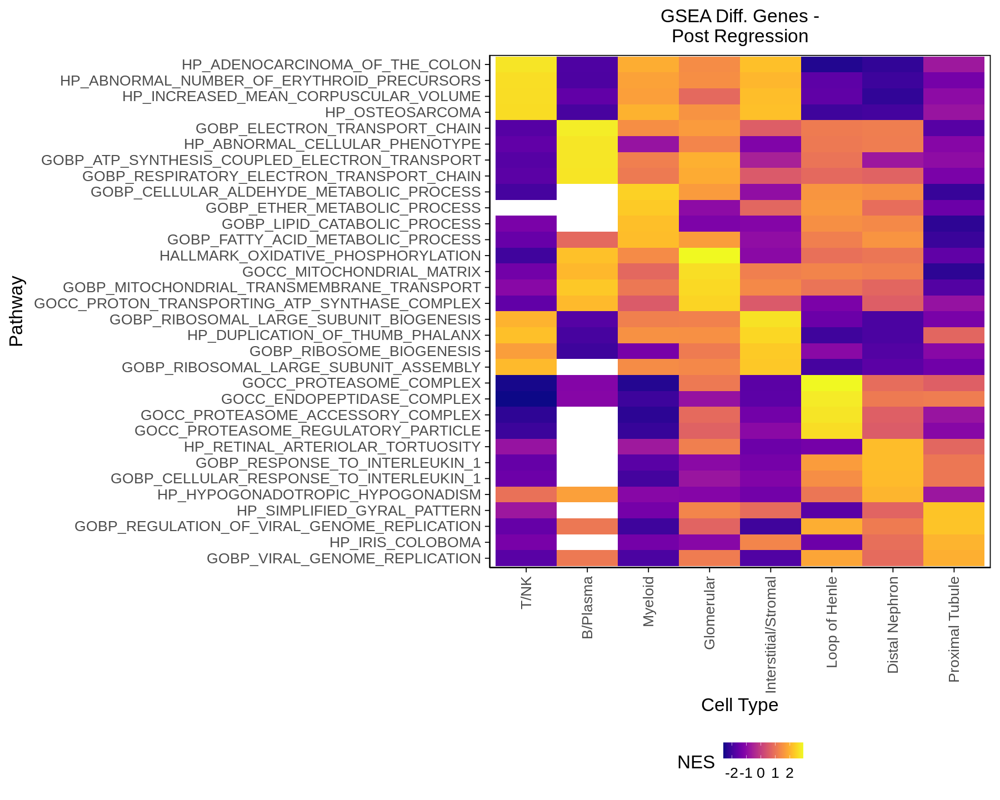

In [147]:
hmap = ggplot(dat)+
    geom_tile(aes(x = celltype_rename, y =pathway, fill = NES))+
    scale_fill_viridis(option = 'plasma', na.value = 'white')+
    theme_classic(base_size = labelfontsize)+
    theme(text = element_text(family = "Arial"), 
          plot.title = element_text(hjust = 0.5, size = labelfontsize),
          axis.text.x = element_text(angle = 90, hjust = 1,  vjust = 0.5),
          axis.text = element_text(size = tickfontsize),
          axis.line = element_line(color = "black", size = 0.5),  # Ensuring axis lines are black and visible
          axis.ticks = element_line(color = "black", size = 0.5),  # Adding ticks to the axes
          panel.border = element_rect(color = "black", fill = NA, size = 1),
         legend.position = 'bottom') + 
    # scale_y_discrete(labels = rev(paths_plot_short))+
    labs(x = 'Cell Type', y = 'Pathway', fill = 'NES', title = 'GSEA Diff. Genes -\nPost Regression')
    # scale_fill_gradient2(low = 'blue', mid = 'lightgray', high = 'red', na.value = 'white')

height = 12
width = 15
fig.size(height, width)
outplot = hmap
outplot

# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.png'), plot = outplot,  
#        height = height, width = width, dpi = 500)
# ggsave(paste0(figdir, 'gsearegress_heatmap_casectrl.pdf'), plot = outplot,  
#        height = height, width = width, dpi = 500, device = cairo_pdf)



# Blood vs tissue, by cell type

## Run differential expression

In [9]:
clinical = readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/cna_new/clinical_data_05042023.rds') %>% 
                        rename(Final_Site = Site) %>% dplyr::select(-sample)

first_biop_pred <- readRDS("/data/srlab2/qxiao/AMP-SLE/data/clinical/df_pred_biop.rds")

clinical = merge(clinical, first_biop_pred, by.x = 'AMP.Subject_ID', by.y = 'Subject_ID')

In [65]:
qcd_meta %>% head(2) %>% t

,1,2
cell,AAACGAAGTATTCTCT-1-AMPSLEkid_cells_0134,AAAGAACAGAAATTGC-1-AMPSLEkid_cells_0134
sample,AMPSLEkid_cells_0134,AMPSLEkid_cells_0134
Annot.separate,T,T
dataset,scRNAseq,scRNAseq
uwotUMAP1,1.193111,4.724340
uwotUMAP2,-15.00063,-13.64553
Site,Rochester,Rochester
Type,LN,LN
processing.batch,47,47
nCount_RNA,2474,3155


[1] 123

[1] 246  54

[1] 36601   246

[1] 6669

$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 228   2   6   3   0   0   2   3   1   1

$density
 [1] 9.26829268 0.08130081 0.24390244 0.12195122 0.00000000 0.00000000
 [7] 0.08130081 0.12195122 0.04065041 0.04065041

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"


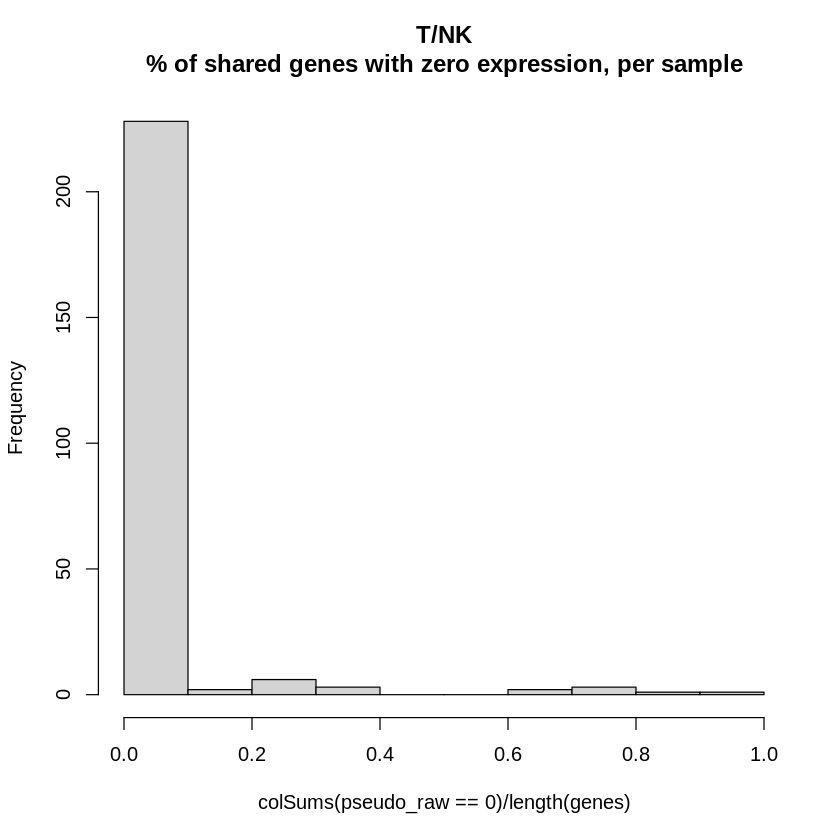

In [262]:
# ctype = 'T/NK'

# qcd_meta = readRDS(ctype_list[[ctype]][1])
# qcd_raw = readRDS(ctype_list[[ctype]][2])
# qcd_raw = qcd_raw[, qcd_meta$cell]
# qcd_meta = qcd_meta %>% mutate(individual = str_replace(sample, 'AMPSLEkid_cells_', ''))
# pseudo_raw = pseudobulk(qcd_raw, qcd_meta$individual)

# qcd_pbmc = readRDS(ctype_list[[ctype]][5])
# qcd_raw_pbmc = qcd_pbmc@assays$RNA@counts
# qcd_meta_pbmc = readRDS(ctype_list[[ctype]][6])
# qcd_raw_pbmc = qcd_raw_pbmc[, qcd_meta_pbmc$Cell]
# pseudo_raw_pbmc = pseudobulk(qcd_raw_pbmc, qcd_meta_pbmc$individual)

# sample_overlap = intersect(qcd_meta$individual, qcd_meta_pbmc$individual)
# pseudo_raw = pseudo_raw[, sample_overlap]
# pseudo_raw_pbmc = pseudo_raw_pbmc[, sample_overlap]

# colnames(pseudo_raw) = paste0(colnames(pseudo_raw), '_tissue')
# colnames(pseudo_raw_pbmc) = paste0(colnames(pseudo_raw_pbmc), '_blood')

# sample_meta = clinical
# sample_meta = sample_meta[sample_meta$individual %in% sample_overlap, ]

# sample_meta = rbind(sample_meta %>% mutate(tissue = 'tissue', individual_tissue = paste0(individual, '_tissue')),
#                     sample_meta %>% mutate(tissue = 'blood', individual_tissue = paste0(individual, '_blood')))

# sample_meta = sample_meta %>% as.data.frame
# rownames(sample_meta) = sample_meta$individual_tissue
# sample_meta$individual = as.factor(sample_meta$individual)

# joint_counts = cbind(pseudo_raw, pseudo_raw_pbmc)
# sample_meta = sample_meta[colnames(joint_counts), ]

# sample_overlap %>% length
# sample_meta %>% dim
# joint_counts %>% dim

# pseudo_raw = joint_counts

# site_dummies = sample_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

# ncounts = colSums(pseudo_raw)
# sample_meta$ncounts = ncounts

# sample_meta_tissue = sample_meta[sample_meta$tissue=='tissue',]
# sample_meta_blood = sample_meta[sample_meta$tissue=='blood',]

# ndonor_thresh = round(nrow(sample_meta_tissue)*.9)
# genes_tissue = rownames(pseudo_raw[, rownames(sample_meta_tissue)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_tissue)] >= genecount_thresh) > ndonor_thresh]

# ndonor_thresh = round(nrow(sample_meta_blood)*.9)
# genes_blood = rownames(pseudo_raw[, rownames(sample_meta_blood)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_blood)] >= genecount_thresh) > ndonor_thresh]

# genes = intersect(genes_blood, genes_tissue)
# genes %>% length

# pseudo_raw = pseudo_raw[genes, ]


# print(hist(colSums(pseudo_raw==0)/length(genes), main = paste0(ctype, '\n% of shared genes with zero expression, per sample')))


In [290]:
# pseudo_raw = joint_counts

# site_dummies = sample_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

# ncounts = colSums(pseudo_raw)
# sample_meta$ncounts = ncounts

# sample_meta_tissue = sample_meta[sample_meta$tissue=='tissue',]
# sample_meta_blood = sample_meta[sample_meta$tissue=='blood',]

# ndonor_thresh = round(nrow(sample_meta_tissue)*.95)
# genes_tissue = rownames(pseudo_raw[, rownames(sample_meta_tissue)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_tissue)] >= genecount_thresh) > ndonor_thresh]

# ndonor_thresh = round(nrow(sample_meta_blood)*.95)
# genes_blood = rownames(pseudo_raw[, rownames(sample_meta_blood)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_blood)] >= genecount_thresh) > ndonor_thresh]

# genes = intersect(genes_blood, genes_tissue)
# genes %>% length

# pseudo_raw = pseudo_raw[genes, ]

[1] 2890

In [291]:
# pct_zero = colSums(pseudo_raw==0)/length(genes)


# (pct_zero < 0.1) %>% table %>% prop.table
# (pct_zero < 0.01) %>% table %>% prop.table
# (pct_zero < 0.001) %>% table %>% prop.table
# (pct_zero == 0) %>% table %>% prop.table

# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'tissue'] < 0.1) %>% table %>% prop.table
# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'tissue'] < 0.01) %>% table %>% prop.table
# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'tissue'] == 0) %>% table %>% prop.table

# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'blood'] < 0.1) %>% table %>% prop.table
# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'blood'] < 0.01) %>% table %>% prop.table
# (pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'blood'] == 0) %>% table %>% prop.table

# pct_zero[(colnames(pseudo_raw) %>% str_split('_') %>% map(2) %>% unlist)== 'blood']

# print(hist(colSums(pseudo_raw==0)/length(genes), main = paste0(ctype, '\n% of shared genes with zero expression, per sample'),
#           breaks = seq(0, 1, .025)))


In [10]:
ctype = 'T/NK'

[1] 123

[1] 246  54

[1] 36601   246

[1] 6669

$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 228   2   6   3   0   0   2   3   1   1

$density
 [1] 9.26829268 0.08130081 0.24390244 0.12195122 0.00000000 0.00000000
 [7] 0.08130081 0.12195122 0.04065041 0.04065041

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 98


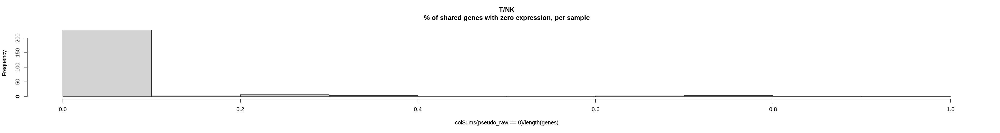

In [117]:
# qcd_meta = readRDS(ctype_list[[ctype]][1])
# qcd_raw = readRDS(ctype_list[[ctype]][2])
# qcd_raw = qcd_raw[, qcd_meta$cell]
# qcd_meta = qcd_meta %>% mutate(individual = str_replace(sample, 'AMPSLEkid_cells_', ''))
# pseudo_raw = pseudobulk(qcd_raw, qcd_meta$individual)

# qcd_pbmc = readRDS(ctype_list[[ctype]][5])
# qcd_raw_pbmc = qcd_pbmc@assays$RNA@counts
# qcd_meta_pbmc = readRDS(ctype_list[[ctype]][6])
# qcd_raw_pbmc = qcd_raw_pbmc[, qcd_meta_pbmc$Cell]
# pseudo_raw_pbmc = pseudobulk(qcd_raw_pbmc, qcd_meta_pbmc$individual)

# sample_overlap = intersect(qcd_meta$individual, qcd_meta_pbmc$individual)
# pseudo_raw = pseudo_raw[, sample_overlap]
# pseudo_raw_pbmc = pseudo_raw_pbmc[, sample_overlap]

# colnames(pseudo_raw) = paste0(colnames(pseudo_raw), '_tissue')
# colnames(pseudo_raw_pbmc) = paste0(colnames(pseudo_raw_pbmc), '_blood')

# sample_meta = clinical
# sample_meta = sample_meta[sample_meta$individual %in% sample_overlap, ]

# sample_meta = rbind(sample_meta %>% mutate(tissue = 'tissue', individual_tissue = paste0(individual, '_tissue')),
#                     sample_meta %>% mutate(tissue = 'blood', individual_tissue = paste0(individual, '_blood')))

# sample_meta = sample_meta %>% as.data.frame
# rownames(sample_meta) = sample_meta$individual_tissue
# sample_meta$individual = as.factor(sample_meta$individual)

# joint_counts = cbind(pseudo_raw, pseudo_raw_pbmc)
# sample_meta = sample_meta[colnames(joint_counts), ]

# sample_overlap %>% length
# sample_meta %>% dim
# joint_counts %>% dim

# pseudo_raw = joint_counts

# site_dummies = sample_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

# ncounts = colSums(pseudo_raw)
# sample_meta$ncounts = ncounts

# sample_meta_tissue = sample_meta[sample_meta$tissue=='tissue',]
# sample_meta_blood = sample_meta[sample_meta$tissue=='blood',]

# ndonor_thresh = round(nrow(sample_meta_tissue)*.9)
# genes_tissue = rownames(pseudo_raw[, rownames(sample_meta_tissue)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_tissue)] >= genecount_thresh) > ndonor_thresh]

# ndonor_thresh = round(nrow(sample_meta_blood)*.9)
# genes_blood = rownames(pseudo_raw[, rownames(sample_meta_blood)])[rowSums(
#     pseudo_raw[, rownames(sample_meta_blood)] >= genecount_thresh) > ndonor_thresh]

# genes = intersect(genes_blood, genes_tissue)
# genes %>% length

# pseudo_raw = pseudo_raw[genes, ]


# print(hist(colSums(pseudo_raw==0)/length(genes), main = paste0(ctype, '\n% of shared genes with zero expression, per sample')))

# samples_filt = sample_meta[colSums(pseudo_raw==0)/length(genes) > 0, ]$individual
# print(length(samples_filt))
# sample_meta = sample_meta[!(sample_meta$individual %in% samples_filt), ]
# pseudo_raw = pseudo_raw[, rownames(sample_meta)]


In [121]:
(pseudo_raw==0 )%>% colSums %>% sort

0134_tissue 0137_tissue 0142_tissue 0147_tissue 0150_tissue 0428_tissue 
          0           0           0           0           0           0 
0844_tissue 0846_tissue 0848_tissue 0850_tissue 0851_tissue 0852_tissue 
          0           0           0           0           0           0 
0882_tissue 0889_tissue 1133_tissue 1134_tissue 1141_tissue 1142_tissue 
          0           0           0           0           0           0 
1154_tissue 1157_tissue 1222_tissue 1241_tissue 1242_tissue 1259_tissue 
          0           0           0           0           0           0 
2712_tissue 2725_tissue 2743_tissue 2800_tissue 2804_tissue 2809_tissue 
          0           0           0           0           0           0 
2811_tissue 2812_tissue 2821_tissue 2836_tissue 2842_tissue 2877_tissue 
          0           0           0           0           0           0 
3003_tissue  0134_blood  0137_blood  0142_blood  0147_blood  0150_blood 
          0           0           0           0           0           0 
 0428_blood  0844_blood  0846_blood  0848_blood  0850_blood  0851_blood 
          0           0           0           0           0           0 
 0852_blood  0882_blood  0889_blood  1133_blood  1134_blood  1141_blood 
          0           0           0           0           0           0 
 1142_blood  1154_blood  1157_blood  1222_blood  1241_blood  1242_blood 
          0           0           0           0           0           0 
 1259_blood  2712_blood  2725_blood  2743_blood  2800_blood  2804_blood 
          0           0           0           0           0           0 
 2809_blood  2811_blood  2812_blood  2821_blood  2836_blood  2842_blood 
          0           0           0           0           0           0 
 2877_blood  3003_blood 
          0           0

[1] "T/NK"
$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 228   2   6   3   0   0   2   3   1   1

$density
 [1] 9.26829268 0.08130081 0.24390244 0.12195122 0.00000000 0.00000000
 [7] 0.08130081 0.12195122 0.04065041 0.04065041

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 98
[1] "B/Plasma"
$breaks
 [1] 0.00 0.05 0.10 0.15 0.20 0.25 0.30 0.35 0.40 0.45 0.50 0.55 0.60

$counts
 [1] 201   8   6   2   3   2   1   2   0   4   0   1

$density
 [1] 17.47826087  0.69565217  0.52173913  0.17391304  0.26086957  0.17391304
 [7]  0.08695652  0.17391304  0.00000000  0.34782609  0.00000000  0.08695652

$mids
 [1] 0.025 0.075 0.125 0.175 0.225 0.275 0.325 0.375 0.425 0.475 0.525 0.575

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 51


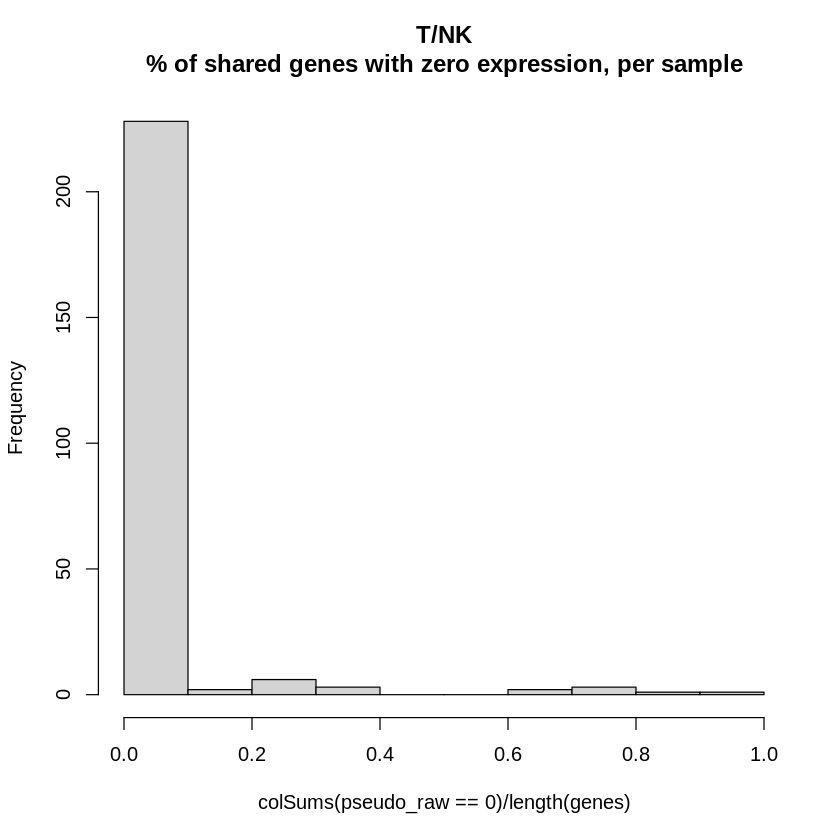

[1] "Myeloid"
$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 235   4   3   0   3   0   0   0   3   2

$density
 [1] 9.40 0.16 0.12 0.00 0.12 0.00 0.00 0.00 0.12 0.08

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 141


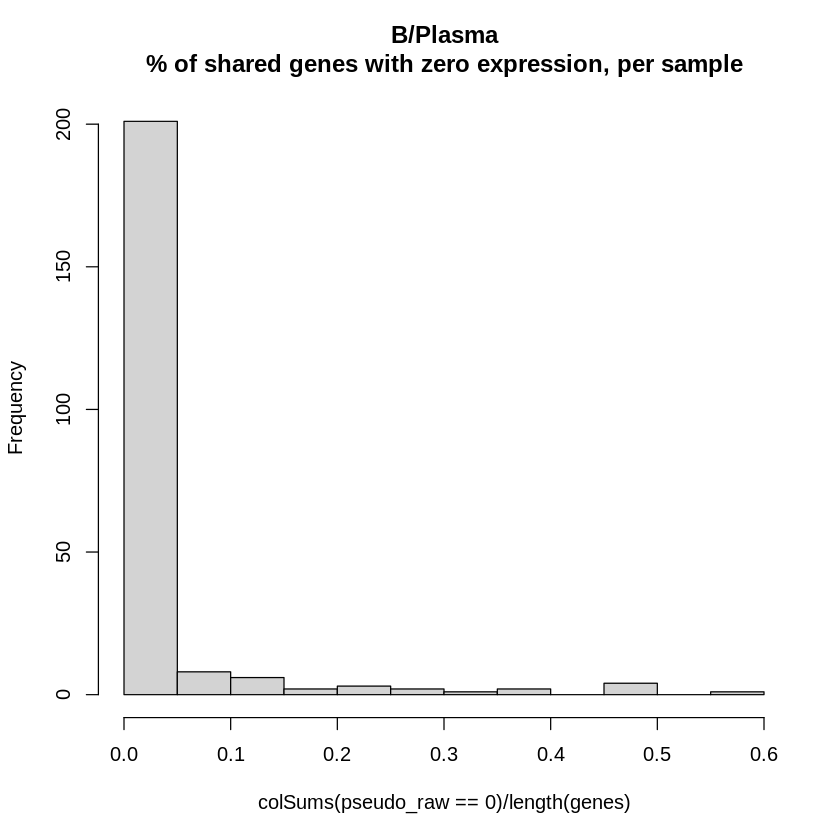

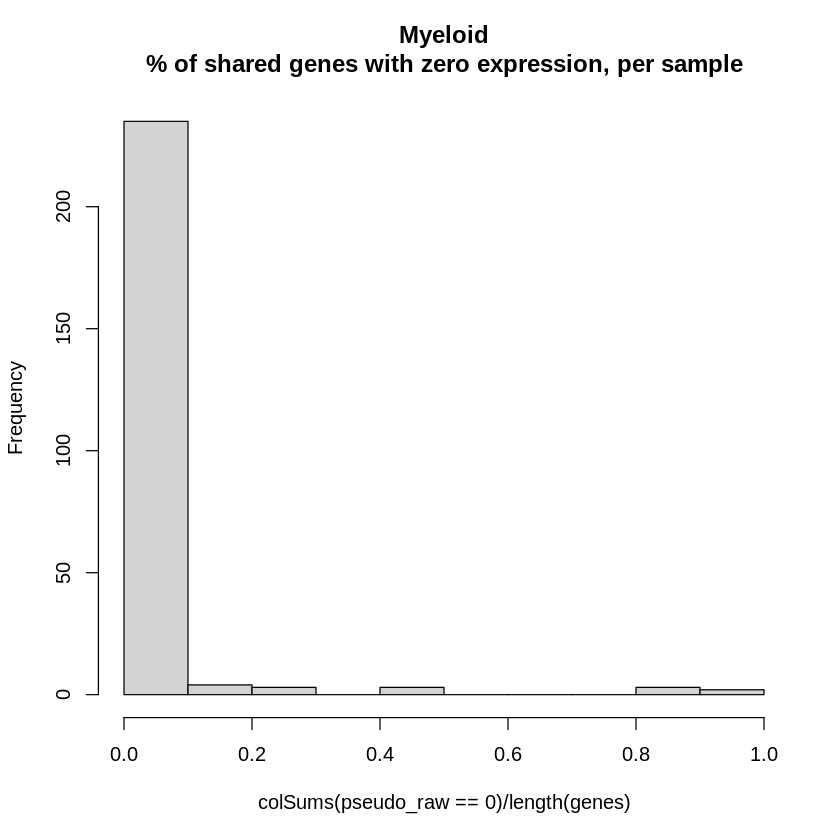

In [13]:
for (ctype in immune_ctypes) {
    print(ctype)

    qcd_meta = readRDS(ctype_list[[ctype]][1])
    qcd_raw = readRDS(ctype_list[[ctype]][2])
    qcd_raw = qcd_raw[, qcd_meta$cell]
    qcd_meta = qcd_meta %>% mutate(individual = str_replace(sample, 'AMPSLEkid_cells_', ''))
    pseudo_raw = pseudobulk(qcd_raw, qcd_meta$individual)

    qcd_pbmc = readRDS(ctype_list[[ctype]][5])
    qcd_raw_pbmc = qcd_pbmc@assays$RNA@counts
    qcd_meta_pbmc = readRDS(ctype_list[[ctype]][6])
    qcd_raw_pbmc = qcd_raw_pbmc[, qcd_meta_pbmc$Cell]
    pseudo_raw_pbmc = pseudobulk(qcd_raw_pbmc, qcd_meta_pbmc$individual)

    sample_overlap = intersect(qcd_meta$individual, qcd_meta_pbmc$individual)
    pseudo_raw = pseudo_raw[, sample_overlap]
    pseudo_raw_pbmc = pseudo_raw_pbmc[, sample_overlap]

    colnames(pseudo_raw) = paste0(colnames(pseudo_raw), '_tissue')
    colnames(pseudo_raw_pbmc) = paste0(colnames(pseudo_raw_pbmc), '_blood')

    sample_meta = clinical
    sample_meta = sample_meta[sample_meta$individual %in% sample_overlap, ]

    sample_meta = rbind(sample_meta %>% mutate(tissue = 'tissue', individual_tissue = paste0(individual, '_tissue')),
                        sample_meta %>% mutate(tissue = 'blood', individual_tissue = paste0(individual, '_blood')))

    sample_meta = sample_meta %>% as.data.frame
    rownames(sample_meta) = sample_meta$individual_tissue
    sample_meta$individual = as.factor(sample_meta$individual)

    joint_counts = cbind(pseudo_raw, pseudo_raw_pbmc)
    sample_meta = sample_meta[colnames(joint_counts), ]

    sample_overlap %>% length
    sample_meta %>% dim
    joint_counts %>% dim

    pseudo_raw = joint_counts

    site_dummies = sample_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

    ncounts = colSums(pseudo_raw)
    sample_meta$ncounts = ncounts

    sample_meta_tissue = sample_meta[sample_meta$tissue=='tissue',]
    sample_meta_blood = sample_meta[sample_meta$tissue=='blood',]

    ndonor_thresh = round(nrow(sample_meta_tissue)*.9)
    genes_tissue = rownames(pseudo_raw[, rownames(sample_meta_tissue)])[rowSums(
        pseudo_raw[, rownames(sample_meta_tissue)] >= genecount_thresh) > ndonor_thresh]

    ndonor_thresh = round(nrow(sample_meta_blood)*.9)
    genes_blood = rownames(pseudo_raw[, rownames(sample_meta_blood)])[rowSums(
        pseudo_raw[, rownames(sample_meta_blood)] >= genecount_thresh) > ndonor_thresh]

    genes = intersect(genes_blood, genes_tissue)
    genes %>% length

    pseudo_raw = pseudo_raw[genes, ]


    print(hist(colSums(pseudo_raw==0)/length(genes), main = paste0(ctype, '\n% of shared genes with zero expression, per sample')))

    samples_filt = sample_meta[colSums(pseudo_raw==0)/length(genes) > 0, ]$individual
    print(length(samples_filt))
    sample_meta = sample_meta[!(sample_meta$individual %in% samples_filt), ]
    pseudo_raw = pseudo_raw[, rownames(sample_meta)]

    pseudo_raw = pseudo_raw + pseudocount

    plan(multisession, workers = 20)

    system.time(
    suppressMessages({
    suppressWarnings({
        res_list = future_lapply(genes, future.seed = TRUE, function(gene){

            tryCatch({
        res = data.frame()

        gene_expr = pseudo_raw[gene, ]

        null_fm = as.formula(paste0(c('gene_expr ~ individual', 
                              ' + offset(log(ncounts))'), collapse = '') )
        full_fm = as.formula(paste0(c('gene_expr ~ individual + tissue', 
                              ' + offset(log(ncounts))'), collapse = '') )

#         null_fm = as.formula(paste0(c('gene_expr ~ individual + First_biop + ', paste0(site_dummies, collapse = ' + '), 
#                               ' + offset(log(ncounts))'), collapse = '') )
#         full_fm = as.formula(paste0(c('gene_expr ~ individual + First_biop + tissue', paste0(site_dummies, collapse = ' + '), 
#                               ' + offset(log(ncounts))'), collapse = '') )

        null = glm.nb(null_fm, data = sample_meta)
        full = glm.nb(full_fm, data = sample_meta)

        z =summary(full)$coefficients['tissuetissue', "z value"]
        se = summary(full)$coefficients['tissuetissue', "Std. Error"]
        b = summary(full)$coefficients['tissuetissue', "Estimate"] #full$coefficients[['TypeLN']]
        pval = anova(full, null)[2, 'Pr(Chi)']
        res = rbind(res, data.frame('gene' = gene, 'beta' = b, 'stderr' = se, 'z-score' = z, 'p' = pval))       
        return(res)

        }, error = function(e) {
            message(paste("Error for gene:", gene))
            message("Error message:", e$message)
            return(NULL)  # Return NULL if there's an error to avoid stopping the loop
          })

        })})})
    )

    res = do.call("rbind", res_list)
    res['celltype'] = ctype
    res$padj = p.adjust(res$p, method = "bonferroni")

    name = ctype_list[[ctype]][3]
    saveRDS(res, paste0(outdir, name, '_tissue_differential_expression_20250421_pseudo_sitebio.rds'))
    flush.console()
    gc()

}

In [14]:
print('done')

[1] "done"


In [ ]:
# Run permutations

In [113]:
n_permutations = 10

[1] "T/NK"
$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 228   2   6   3   0   0   2   3   1   1

$density
 [1] 9.26829268 0.08130081 0.24390244 0.12195122 0.00000000 0.00000000
 [7] 0.08130081 0.12195122 0.04065041 0.04065041

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 98
[1] "B/Plasma"
$breaks
 [1] 0.00 0.05 0.10 0.15 0.20 0.25 0.30 0.35 0.40 0.45 0.50 0.55 0.60

$counts
 [1] 201   8   6   2   3   2   1   2   0   4   0   1

$density
 [1] 17.47826087  0.69565217  0.52173913  0.17391304  0.26086957  0.17391304
 [7]  0.08695652  0.17391304  0.00000000  0.34782609  0.00000000  0.08695652

$mids
 [1] 0.025 0.075 0.125 0.175 0.225 0.275 0.325 0.375 0.425 0.475 0.525 0.575

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 51


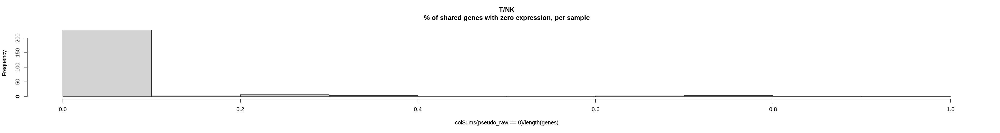

[1] "Myeloid"
$breaks
 [1] 0.0 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0

$counts
 [1] 235   4   3   0   3   0   0   0   3   2

$density
 [1] 9.40 0.16 0.12 0.00 0.12 0.00 0.00 0.00 0.12 0.08

$mids
 [1] 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95

$xname
[1] "colSums(pseudo_raw == 0)/length(genes)"

$equidist
[1] TRUE

attr(,"class")
[1] "histogram"
[1] 141


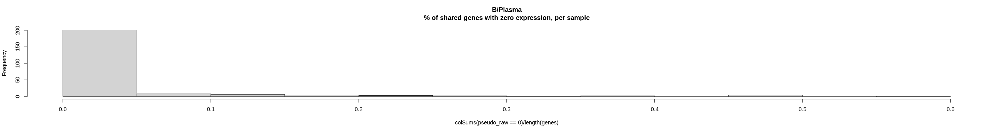

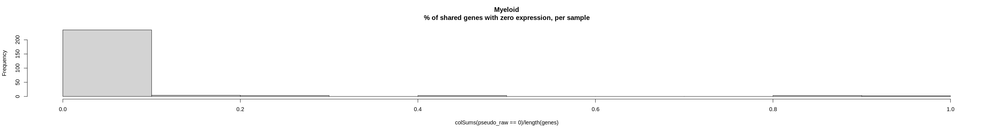

In [114]:
for (ctype in immune_ctypes) {
    print(ctype)

    qcd_meta = readRDS(ctype_list[[ctype]][1])
    qcd_raw = readRDS(ctype_list[[ctype]][2])
    qcd_raw = qcd_raw[, qcd_meta$cell]
    qcd_meta = qcd_meta %>% mutate(individual = str_replace(sample, 'AMPSLEkid_cells_', ''))
    pseudo_raw = pseudobulk(qcd_raw, qcd_meta$individual)

    qcd_pbmc = readRDS(ctype_list[[ctype]][5])
    qcd_raw_pbmc = qcd_pbmc@assays$RNA@counts
    qcd_meta_pbmc = readRDS(ctype_list[[ctype]][6])
    qcd_raw_pbmc = qcd_raw_pbmc[, qcd_meta_pbmc$Cell]
    pseudo_raw_pbmc = pseudobulk(qcd_raw_pbmc, qcd_meta_pbmc$individual)

    sample_overlap = intersect(qcd_meta$individual, qcd_meta_pbmc$individual)
    pseudo_raw = pseudo_raw[, sample_overlap]
    pseudo_raw_pbmc = pseudo_raw_pbmc[, sample_overlap]

    colnames(pseudo_raw) = paste0(colnames(pseudo_raw), '_tissue')
    colnames(pseudo_raw_pbmc) = paste0(colnames(pseudo_raw_pbmc), '_blood')

    sample_meta = clinical
    sample_meta = sample_meta[sample_meta$individual %in% sample_overlap, ]

    sample_meta = rbind(sample_meta %>% mutate(tissue = 'tissue', individual_tissue = paste0(individual, '_tissue')),
                        sample_meta %>% mutate(tissue = 'blood', individual_tissue = paste0(individual, '_blood')))

    sample_meta = sample_meta %>% as.data.frame
    rownames(sample_meta) = sample_meta$individual_tissue
    sample_meta$individual = as.factor(sample_meta$individual)

    joint_counts = cbind(pseudo_raw, pseudo_raw_pbmc)
    sample_meta = sample_meta[colnames(joint_counts), ]

    sample_overlap %>% length
    sample_meta %>% dim
    joint_counts %>% dim

    pseudo_raw = joint_counts

    site_dummies = sample_meta %>% dplyr::select(starts_with('Final_Site_')) %>% colnames

    ncounts = colSums(pseudo_raw)
    sample_meta$ncounts = ncounts

    sample_meta_tissue = sample_meta[sample_meta$tissue=='tissue',]
    sample_meta_blood = sample_meta[sample_meta$tissue=='blood',]

    ndonor_thresh = round(nrow(sample_meta_tissue)*.9)
    genes_tissue = rownames(pseudo_raw[, rownames(sample_meta_tissue)])[rowSums(
        pseudo_raw[, rownames(sample_meta_tissue)] >= genecount_thresh) > ndonor_thresh]

    ndonor_thresh = round(nrow(sample_meta_blood)*.9)
    genes_blood = rownames(pseudo_raw[, rownames(sample_meta_blood)])[rowSums(
        pseudo_raw[, rownames(sample_meta_blood)] >= genecount_thresh) > ndonor_thresh]

    genes = intersect(genes_blood, genes_tissue)
    genes %>% length

    pseudo_raw = pseudo_raw[genes, ]


    print(hist(colSums(pseudo_raw==0)/length(genes), main = paste0(ctype, '\n% of shared genes with zero expression, per sample')))

    samples_filt = sample_meta[colSums(pseudo_raw==0)/length(genes) > 0, ]$individual
    print(length(samples_filt))
    sample_meta = sample_meta[!(sample_meta$individual %in% samples_filt), ]
    pseudo_raw = pseudo_raw[, rownames(sample_meta)]

    pseudo_raw = pseudo_raw + pseudocount

    plan(multisession, workers = 20)

    system.time(
    suppressMessages({
    suppressWarnings({
        res_list = future_lapply(genes, future.seed = TRUE, function(gene){

            tryCatch({
        res = data.frame()

        gene_expr = pseudo_raw[gene, ]

        null_fm = as.formula(paste0(c('gene_expr ~ individual', 
                              ' + offset(log(ncounts))'), collapse = '') )
        full_fm = as.formula(paste0(c('gene_expr ~ individual + tissue', 
                              ' + offset(log(ncounts))'), collapse = '') )
        null = glm.nb(null_fm, data = sample_meta)
                
        
        for (i in range(1, n_permutations)){
            sample_meta_permuted = sample_meta
            sample_meta_permuted$tissue = sample_meta_permuted$tissue %>% sample
            full = glm.nb(full_fm, data = sample_meta_permuted)
            z =summary(full)$coefficients['tissuetissue', "z value"]
            se = summary(full)$coefficients['tissuetissue', "Std. Error"]
            b = summary(full)$coefficients['tissuetissue', "Estimate"] #full$coefficients[['TypeLN']]
            pval = anova(full, null)[2, 'Pr(Chi)']
            res = rbind(res, data.frame('gene' = gene, 'beta' = b, 'stderr' = se, 'z-score' = z, 'p' = pval,
                                       'i' = i))       
       }
        return(res)

        }, error = function(e) {
            message(paste("Error for gene:", gene))
            message("Error message:", e$message)
            return(NULL)  # Return NULL if there's an error to avoid stopping the loop
          })

        })})})
    )

    res = do.call("rbind", res_list)
    res['celltype'] = ctype
    res$padj = p.adjust(res$p, method = "bonferroni")

    name = ctype_list[[ctype]][3]
    saveRDS(res, paste0(outdir, name, '_permuted_tissue_differential_expression_20250421_pseudo_sitebio.rds'))
    flush.console()
    gc()

}

In [111]:
res_list

gene,beta,stderr,z.score,p,i
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NOC2L,0.04195804,0.03201242,1.310680,0.1900501,1
NOC2L,-0.02060383,0.03153190,-0.653428,0.5134646,2
gene,beta,stderr,z.score,p,i
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ISG15,0.2856135,0.09392684,3.040808,0.005296665,1
ISG15,-0.1503306,0.09761720,-1.540002,0.131742944,2


In [112]:
res

gene,beta,stderr,z.score,p,i,celltype,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
NOC2L,0.04195804,0.03201242,1.310680,0.190050139,1,T/NK,0.76020056
NOC2L,-0.02060383,0.03153190,-0.653428,0.513464608,2,T/NK,1.00000000
ISG15,0.28561345,0.09392684,3.040808,0.005296665,1,T/NK,0.02118666
ISG15,-0.15033065,0.09761720,-1.540002,0.131742944,2,T/NK,0.52697178


## Load results

In [37]:
res_list = list()
res_all = data.frame()

for (ctype in immune_ctypes){
    
    name = ctype_list[[ctype]][3]
    de_fn = paste0(outdir, name, '_tissue_differential_expression_20250421_pseudo_sitebio.rds')
    res = readRDS(de_fn)
    print(res$gene %>% unique %>% length)
    
    res_all = rbind(res_all, res)
    res_list[[ctype]] = res
    rownames(res_list[[ctype]]) = res$gene
}

[1] 6669
[1] 797
[1] 8822


In [13]:
res_list_permuted = list()
res_all_permuted = data.frame()

for (ctype in immune_ctypes){
    
    name = ctype_list[[ctype]][3]
    de_fn = paste0(outdir, name, '_permuted_tissue_differential_expression_20250421_pseudo_sitebio.rds')
    res = readRDS(de_fn)
    print(res$gene %>% unique %>% length)
    
    res_all_permuted = rbind(res_all_permuted, res)
    res_list_permuted[[ctype]] = res
    # rownames(res_list_permuted[[ctype]]) = res$gene
}

[1] 6665
[1] 794
[1] 8814


In [242]:
immune_ctypes

[1] "T/NK"     "B/Plasma" "Myeloid"

In [18]:
ctype = 'T/NK'
print(ctype)
res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta))

[1] "T/NK"


,gene,beta,stderr,z.score,p,celltype,padj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
FOSB,FOSB,3.911211,0.08913664,43.87883,0,T/NK,0
FXYD2,FXYD2,3.590688,0.12361488,29.04738,0,T/NK,0
ATP1B1,ATP1B1,3.132861,0.08691628,36.04459,0,T/NK,0
TNF,TNF,2.937478,0.07567455,38.81725,0,T/NK,0
MT-ATP8,MT-ATP8,2.884837,0.08277013,34.85361,0,T/NK,0
JUN,JUN,2.724379,0.11422600,23.85078,0,T/NK,0
MZF1-AS1,MZF1-AS1,2.690215,0.05805007,46.34300,0,T/NK,0
CLU,CLU,2.545682,0.09031025,28.18818,0,T/NK,0
CKB,CKB,2.543876,0.07226785,35.20065,0,T/NK,0


In [19]:
ctype = 'B/Plasma'
print(ctype)
res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta))

[1] "B/Plasma"


,gene,beta,stderr,z.score,p,celltype,padj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
IGHG1,IGHG1,4.6934053,0.08870341,52.91121,0,B/Plasma,0
IGHG3,IGHG3,4.5476402,0.10781304,42.18080,0,B/Plasma,0
IGKC,IGKC,3.4208127,0.06697846,51.07332,0,B/Plasma,0
XBP1,XBP1,3.3159506,0.05140393,64.50772,0,B/Plasma,0
IGLC2,IGLC2,3.2081189,0.10067099,31.86736,0,B/Plasma,0
MZB1,MZB1,2.7677042,0.05315479,52.06877,0,B/Plasma,0
FOSB,FOSB,2.7244441,0.09028575,30.17579,0,B/Plasma,0
SSR4,SSR4,2.1371626,0.04430602,48.23639,0,B/Plasma,0
MT-ATP8,MT-ATP8,1.9472080,0.06464719,30.12053,0,B/Plasma,0


In [20]:
ctype = 'Myeloid'
print(ctype)
res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta))

[1] "Myeloid"


,gene,beta,stderr,z.score,p,celltype,padj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
APOC1,APOC1,7.329722,0.17472699,41.94957,0,Myeloid,0
GPNMB,GPNMB,5.007932,0.15311505,32.70698,0,Myeloid,0
GPX3,GPX3,4.591730,0.14723924,31.18550,0,Myeloid,0
PLTP,PLTP,4.560961,0.06808157,66.99259,0,Myeloid,0
FXYD2,FXYD2,4.460085,0.10601838,42.06897,0,Myeloid,0
FN1,FN1,4.307216,0.23550728,18.28910,0,Myeloid,0
C1QC,C1QC,4.186210,0.10889449,38.44281,0,Myeloid,0
OLR1,OLR1,3.965738,0.17515663,22.64110,0,Myeloid,0
FCGBP,FCGBP,3.705531,0.20199274,18.34487,0,Myeloid,0


In [21]:
for (ctype in immune_ctypes){
   print(res_list[[ctype]] %>% filter(padj < 0.05) %>% arrange(desc(beta)))
}

                     gene        beta      stderr    z.score            p
FOSB                 FOSB  3.91121117 0.089136643  43.878825 0.000000e+00
FXYD2               FXYD2  3.59068801 0.123614878  29.047377 0.000000e+00
ATP1B1             ATP1B1  3.13286117 0.086916277  36.044585 0.000000e+00
TNF                   TNF  2.93747826 0.075674554  38.817252 0.000000e+00
MT-ATP8           MT-ATP8  2.88483741 0.082770126  34.853607 0.000000e+00
JUN                   JUN  2.72437930 0.114226003  23.850780 0.000000e+00
MZF1-AS1         MZF1-AS1  2.69021479 0.058050073  46.343005 0.000000e+00
CLU                   CLU  2.54568156 0.090310249  28.188180 0.000000e+00
CKB                   CKB  2.54387553 0.072267850  35.200653 0.000000e+00
HSPA1B             HSPA1B  2.44904523 0.070469654  34.753190 0.000000e+00
MT-ND4L           MT-ND4L  2.24289450 0.073344119  30.580427 0.000000e+00
SRGAP3             SRGAP3  2.19715920 0.103866096  21.153767 0.000000e+00
FOS                   FOS  2.09840183 

## Visualize results

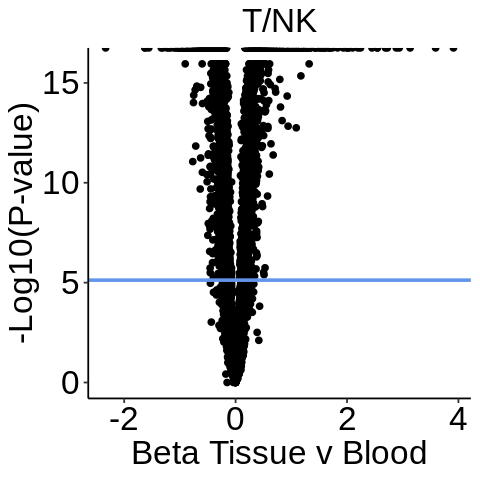

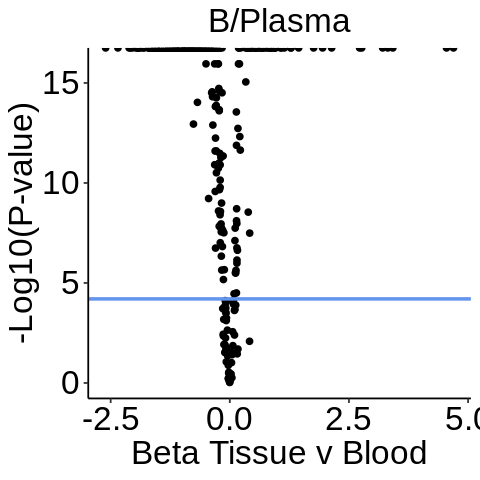

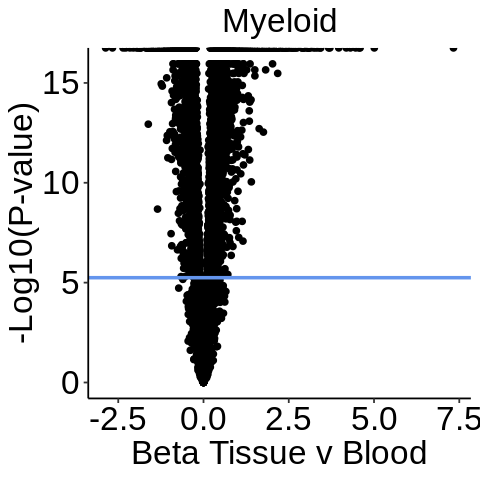

In [22]:
for (ctype in immune_ctypes){
    res = res_list[[ctype]]
        
    fig.size(4, 4)
    p = ggplot(res)+
        geom_point(aes(x = beta, y = -log10(p)))+
        theme_classic()+
        theme(text=element_text(family="Arial"),
        legend.position = "none",
        panel.grid = element_blank(),
        axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
        axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
        axis.title = element_text(size=labelfontsize, hjust = 0.5),
        plot.title = element_text(size=labelfontsize, hjust = 0.5),
        )+
        geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue', linewidth = 1)+
        labs(x = 'Beta Tissue v Blood', y = '-Log10(P-value)', title = ctype)
    print(p)
}

In [25]:
dat = res_all %>% filter(padj < 0.05)

In [42]:
genes_up = (dat %>% filter(beta > 0))$gene %>% table
genes_up = genes_up[genes_up == length(immune_ctypes)]  %>% names

In [43]:
genes_down = (dat %>% filter(beta < 0))$gene %>% table
genes_down = genes_down[genes_down == length(immune_ctypes)]  %>% names

In [44]:
genes_up

genes_down

[1] "AKR1A1"   "ATP5MC1"  "ATP5MD"   "ATP5ME"   "ATP5PF"   "ATRAID"  
 [7] "CD63"     "CNPY2"    "COPS9"    "DAD1"     "DYNLL1"   "FOSB"    
[13] "HAX1"     "HIST1H4C" "KRTCAP2"  "MRPL51"   "MT-ATP8"  "MT-ND4L" 
[19] "MT-ND5"   "MT-ND6"   "NDUFA1"   "NDUFA3"   "NDUFAF3"  "NDUFB4"  
[25] "NDUFC2"   "NDUFS6"   "OST4"     "POLR2L"   "PRDX1"    "PRDX2"   
[31] "RPS27L"   "SEC61G"   "SLIRP"    "TMBIM6"   "TMEM258"  "TMEM59"  
[37] "UBL5"     "UQCRQ"

[1] "ACTR2"     "ADAR"      "ADD1"      "ADD3"      "AHNAK"     "AKAP13"   
  [7] "ANAPC5"    "ARF1"      "ARGLU1"    "ARID1B"    "ARID4B"    "ARPC5"    
 [13] "ATM"       "ATP2B1"    "ATRX"      "BCLAF1"    "BOD1L1"    "CAPZA1"   
 [19] "CAST"      "CCNL1"     "CD46"      "CD55"      "CD99"      "CDC42"    
 [25] "CDC42SE2"  "CDV3"      "CELF2"     "CFLAR"     "CHD2"      "CNBP"     
 [31] "CSDE1"     "CTSS"      "DDX21"     "DDX5"      "DOCK8"     "EEF2"     
 [37] "EID1"      "EIF2S3"    "EIF3H"     "EIF3L"     "EIF4B"     "EIF4G2"   
 [43] "EIF5"      "ELF1"      "EVI2B"     "EZR"       "FAM133B"   "FMNL1"    
 [49] "FNBP4"     "FOXP1"     "GOLGA4"    "GOLGB1"    "GPBP1"     "GRB2"     
 [55] "H3F3B"     "HCLS1"     "HLA-F"     "HNRNPA2B1" "HNRNPA3"   "HNRNPC"   
 [61] "HNRNPD"    "HNRNPDL"   "HNRNPH1"   "HNRNPH3"   "HNRNPK"    "HNRNPR"   
 [67] "HNRNPU"    "HP1BP3"    "IFITM2"    "IFNAR1"    "IKZF1"     "IQGAP1"   
 [73] "IRF1"      "JAK1"      "JMJD1C"    "JTB"       "KHDRBS1"   "KLF13"    
 [79] "KLF2"      "KMT2E"     "LCP1"      "LINC01578" "LRMP"      "MBD2"     
 [85] "MBD4"      "MBNL1"     "MCL1"      "MDM4"      "MT-CO2"    "MTDH"     
 [91] "MTPN"      "MTRNR2L12" "MYCBP2"    "NCL"       "NCOA3"     "NEAT1"    
 [97] "NKTR"      "OGA"       "OGT"       "PAIP2"     "PAPOLA"    "PCBP2"    
[103] "PLAC8"     "PNISR"     "PNN"       "PNRC1"     "PRKCB"     "PRR13"    
[109] "PRRC2C"    "PSIP1"     "PSME1"     "PTP4A2"    "PTPRC"     "RAP1B"    
[115] "RBBP4"     "RBM3"      "RBM39"     "RCSD1"     "RPL13A"    "RPL29"    
[121] "RPL31"     "RPL4"      "RPL6"      "RPL7"      "RPS14"     "RPS17"    
[127] "RPS20"     "RPS7"      "RSL1D1"    "RTF1"      "S100A10"   "SCAF11"   
[133] "SEC31A"    "SEPTIN7"   "SET"       "SF1"       "SF3B1"     "SH3BGRL3" 
[139] "SH3GLB1"   "SLC25A6"   "SMAP2"     "SMCHD1"    "SP100"     "SP110"    
[145] "SRRM1"     "SRRM2"     "SRSF10"    "SRSF4"     "SRSF5"     "STK17B"   
[151] "STK4"      "TAGLN2"    "TAPBP"     "TCEA1"     "TCF25"     "TKT"      
[157] "TLE5"      "TNRC6B"    "TPM3"      "TRIM38"    "TSC22D3"   "UBE2D3"   
[163] "UBXN4"     "USP15"     "USP16"     "UTRN"      "XRCC5"     "YTHDC1"   
[169] "YWHAB"     "YWHAZ"     "ZFAND6"

In [45]:
genes_up = (res_all %>% filter(beta > 0))$gene %>% table
genes_up = genes_up[genes_up == length(immune_ctypes)]  %>% names

genes_up = (res_all %>% filter(gene %in% genes_up, padj < 0.05))$gene %>% unique

In [55]:
genes_down = (res_all %>% filter(beta < 0))$gene %>% table
genes_down = genes_down[genes_down == length(immune_ctypes)]  %>% names

genes_down = (res_all %>% filter(gene %in% genes_down, padj < 0.05))$gene %>% unique

In [56]:
genes_up %>% length
genes_down  %>% length

[1] 67

[1] 274

In [93]:
genes_up  %>% sort

[1] "AKR1A1"   "ATP5MC1"  "ATP5MD"   "ATP5ME"   "ATP5PF"   "ATRAID"  
 [7] "BST2"     "CD63"     "CNPY2"    "COPE"     "COPS9"    "COX7A2"  
[13] "CUTA"     "CYBA"     "DAD1"     "DYNLL1"   "EIF2S2"   "FOSB"    
[19] "GSTP1"    "HAX1"     "HIST1H4C" "ITM2C"    "JUN"      "KRTCAP2" 
[25] "MRPL51"   "MRPL52"   "MRPS24"   "MT-ATP8"  "MT-ND4L"  "MT-ND5"  
[31] "MT-ND6"   "NDUFA1"   "NDUFA3"   "NDUFAF3"  "NDUFB1"   "NDUFB11" 
[37] "NDUFB3"   "NDUFB4"   "NDUFB7"   "NDUFC1"   "NDUFC2"   "NDUFS6"  
[43] "OST4"     "OSTC"     "PABPC4"   "PET100"   "POLR2L"   "PRDX1"   
[49] "PRDX2"    "PRDX5"    "RABAC1"   "REEP5"    "RPS27L"   "SEC61G"  
[55] "SLIRP"    "SNHG25"   "SPCS1"    "SPCS2"    "SSR4"     "TMBIM6"  
[61] "TMEM258"  "TMEM59"   "TXN"      "UBL5"     "UQCRQ"    "XBP1"    
[67] "ZNF706"

In [92]:
genes_down %>% sort

[1] "ACTR2"     "ACTR3"     "ADAR"      "ADD1"      "ADD3"      "AHNAK"    
  [7] "AKAP13"    "AKAP9"     "ANAPC5"    "ANKRD12"   "ANP32B"    "ARF1"     
 [13] "ARGLU1"    "ARHGDIB"   "ARID1B"    "ARID4B"    "ARPC1B"    "ARPC5"    
 [19] "ATM"       "ATP2B1"    "ATRX"      "BCLAF1"    "BOD1L1"    "BTG1"     
 [25] "BTG2"      "CALM1"     "CAP1"      "CAPZA1"    "CAST"      "CCNL1"    
 [31] "CD46"      "CD52"      "CD55"      "CD99"      "CDC42"     "CDC42SE2" 
 [37] "CDV3"      "CELF2"     "CFLAR"     "CHD2"      "CNBP"      "COX4I1"   
 [43] "CSDE1"     "CTSS"      "DBNL"      "DDX17"     "DDX21"     "DDX24"    
 [49] "DDX3X"     "DDX5"      "DHX36"     "DOCK8"     "EBLN3P"    "EEF1A1"   
 [55] "EEF2"      "EID1"      "EIF2S3"    "EIF3F"     "EIF3H"     "EIF3L"    
 [61] "EIF4B"     "EIF4G2"    "EIF5"      "ELF1"      "EMP3"      "EVI2B"    
 [67] "EZR"       "FAM107B"   "FAM133B"   "FMNL1"     "FNBP4"     "FOXP1"    
 [73] "GAS5"      "GDI2"      "GOLGA4"    "GOLGB1"    "GPBP1"     "GRB2"     
 [79] "GTF3A"     "H3F3A"     "H3F3B"     "HCLS1"     "HLA-C"     "HLA-E"    
 [85] "HLA-F"     "HNRNPA2B1" "HNRNPA3"   "HNRNPC"    "HNRNPD"    "HNRNPDL"  
 [91] "HNRNPH1"   "HNRNPH3"   "HNRNPK"    "HNRNPR"    "HNRNPU"    "HP1BP3"   
 [97] "IFI16"     "IFITM2"    "IFNAR1"    "IKZF1"     "IQGAP1"    "IRF1"     
[103] "ISG20"     "JAK1"      "JMJD1C"    "JTB"       "KHDRBS1"   "KLF13"    
[109] "KLF2"      "KMT2E"     "LAMTOR1"   "LAPTM5"    "LCP1"      "LIMD2"    
[115] "LINC01578" "LRMP"      "LSP1"      "LY6E"      "MBD2"      "MBD4"     
[121] "MBNL1"     "MCL1"      "MDM4"      "MT-ATP6"   "MT-CO2"    "MT-CO3"   
[127] "MT-ND1"    "MTDH"      "MTPN"      "MTRNR2L12" "MYCBP2"    "NACA"     
[133] "NAP1L1"    "NCL"       "NCOA3"     "NEAT1"     "NFKBIA"    "NGLY1"    
[139] "NKTR"      "NOP53"     "OGA"       "OGT"       "ORAI2"     "PABPC1"   
[145] "PABPN1"    "PAIP2"     "PAPOLA"    "PARP14"    "PCBP1"     "PCBP2"    
[151] "PCMTD1"    "PDIA3"     "PLAC8"     "PNISR"     "PNN"       "PNRC1"    
[157] "PPDPF"     "PPM1K"     "PRKCB"     "PRPF4B"    "PRR13"     "PRRC2C"   
[163] "PSIP1"     "PSMB10"    "PSME1"     "PTP4A2"    "PTPRC"     "RAB2A"    
[169] "RAP1B"     "RBBP4"     "RBM25"     "RBM3"      "RBM39"     "RBM4"     
[175] "RBM6"      "RCSD1"     "RESF1"     "RNF7"      "RPL11"     "RPL13A"   
[181] "RPL14"     "RPL17"     "RPL18"     "RPL19"     "RPL23"     "RPL29"    
[187] "RPL31"     "RPL32"     "RPL4"      "RPL6"      "RPL7"      "RPLP0"    
[193] "RPS11"     "RPS13"     "RPS14"     "RPS17"     "RPS20"     "RPS24"    
[199] "RPS6"      "RPS7"      "RPS8"      "RSL1D1"    "RTF1"      "S100A10"  
[205] "SCAF11"    "SEC31A"    "SEPTIN6"   "SEPTIN7"   "SET"       "SF1"      
[211] "SF3B1"     "SH3BGRL"   "SH3BGRL3"  "SH3GLB1"   "SLC25A6"   "SMAP2"    
[217] "SMCHD1"    "SMIM14"    "SNX2"      "SP100"     "SP110"     "SP140"    
[223] "SRRM1"     "SRRM2"     "SRSF10"    "SRSF3"     "SRSF4"     "SRSF5"    
[229] "STK17B"    "STK4"      "TAGLN2"    "TAPBP"     "TCEA1"     "TCF25"    
[235] "TERF2IP"   "TKT"       "TLE5"      "TMSB10"    "TNRC6B"    "TPM3"     
[241] "TPT1"      "TRA2B"     "TRAPPC5"   "TRIM38"    "TSC22D3"   "TTC14"    
[247] "TTC3"      "TUT4"      "TXNIP"     "UBC"       "UBE2B"     "UBE2D2"   
[253] "UBE2D3"    "UBE2I"     "UBXN4"     "UFM1"      "USP15"     "USP16"    
[259] "UTRN"      "VAMP2"     "VAPA"      "VIM"       "XRCC5"     "YIPF4"    
[265] "YME1L1"    "YTHDC1"    "YWHAB"     "YWHAZ"     "ZC3H15"    "ZFAND6"   
[271] "ZFP36"     "ZFP36L2"   "ZNF292"    "ZRANB2"

In [57]:
genes_show = c(genes_up, genes_down)

In [59]:
dat = res_all %>% filter(gene %in% genes_show)

In [69]:
dat$gene = factor(dat$gene, levels = genes_show)

In [87]:
vmax = (abs(dat$beta) %>% quantile(.99))[[1]] %>% round(1)

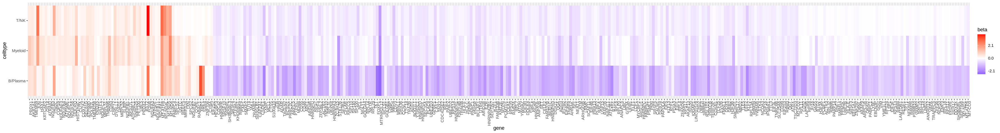

In [89]:
fig.size(4, 30)
ggplot(dat) + 
    geom_tile(aes(x = gene, y = celltype, fill = beta))+
    scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red', na.value = 'lightgray',
                        breaks = c(-vmax, 0, vmax), oob = scales::squish)+
    theme(axis.text.x = element_text(angle = 90, hjust = 1))

    # scale_fill_viridis(option = 'plasma', na.value = 'white')

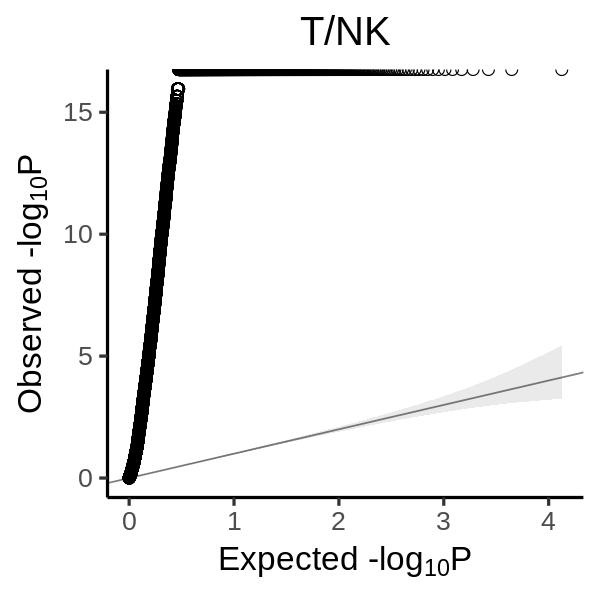

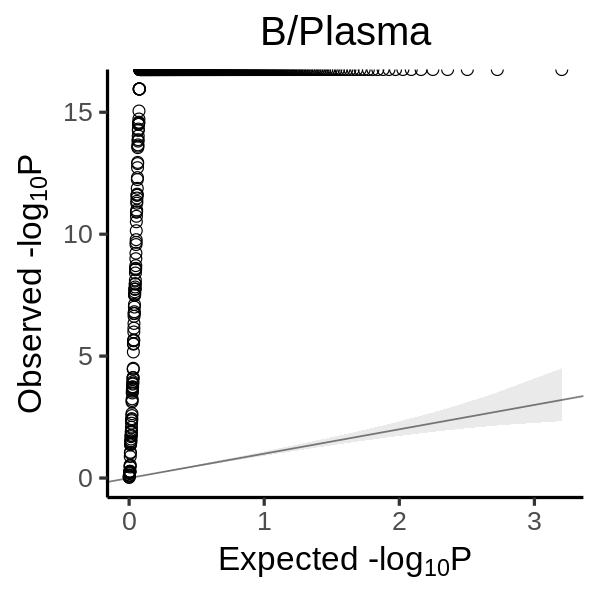

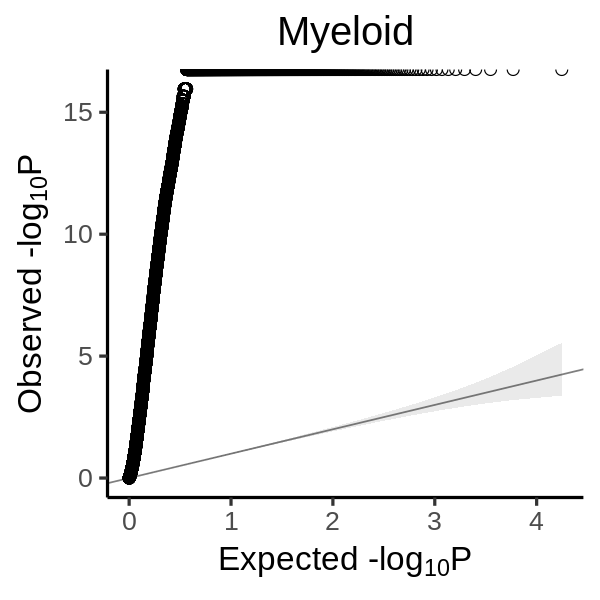

In [38]:
for (ctype in immune_ctypes) {
    res = res_all %>% filter(celltype == ctype)
    
    ps = res$p

    fig.size (5, 5)
    p = gg_qqplot(ps)+
        theme_classic(base_size = 20)+
        theme(plot.title = element_text(hjust = 0.5))+
        ggtitle(paste0(ctype))
    print(p)
}

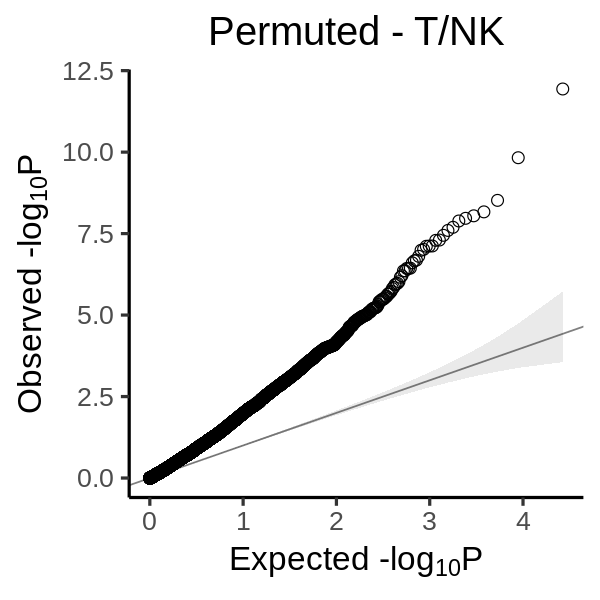

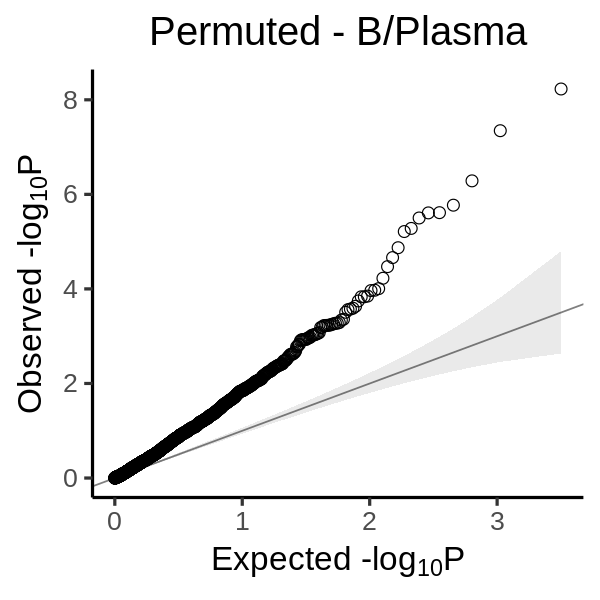

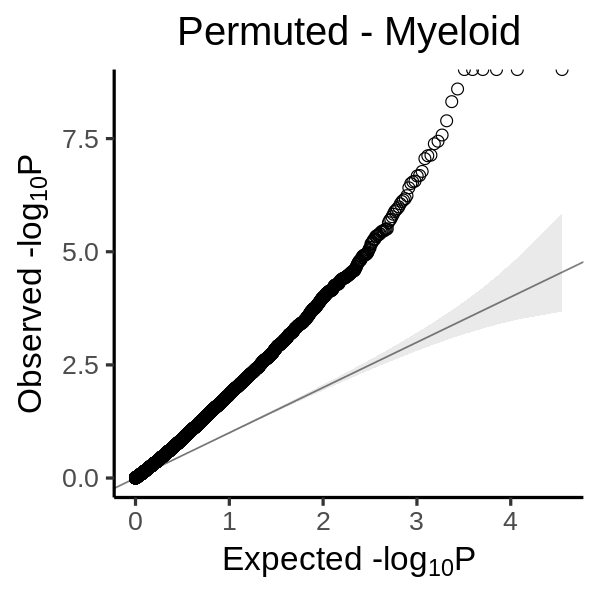

In [36]:
for (ctype in immune_ctypes) {
    res = res_all_permuted %>% filter(celltype == ctype)
    
    ps = res$p

    fig.size (5, 5)
    p = gg_qqplot(ps)+
        theme_classic(base_size = 20)+
        theme(plot.title = element_text(hjust = 0.5))+
        ggtitle(paste0('Permuted - ', ctype))
    print(p)
}

# Scratch

In [ ]:
fig.size(5, 15)
ggplot(dat)+
    geom_tile(aes(x = celltype, y =pathway, fill = NES))+
    scale_fill_viridis()+
    theme_classic(base_size = tickfontsize)

In [213]:
library(pheatmap)

In [210]:
overlap = sort(unique(res_all$gene))[(res_all$gene %>% table) >= length(celltypes)]

In [211]:
length(overlap)

[1] 211

In [214]:
dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 4978    8

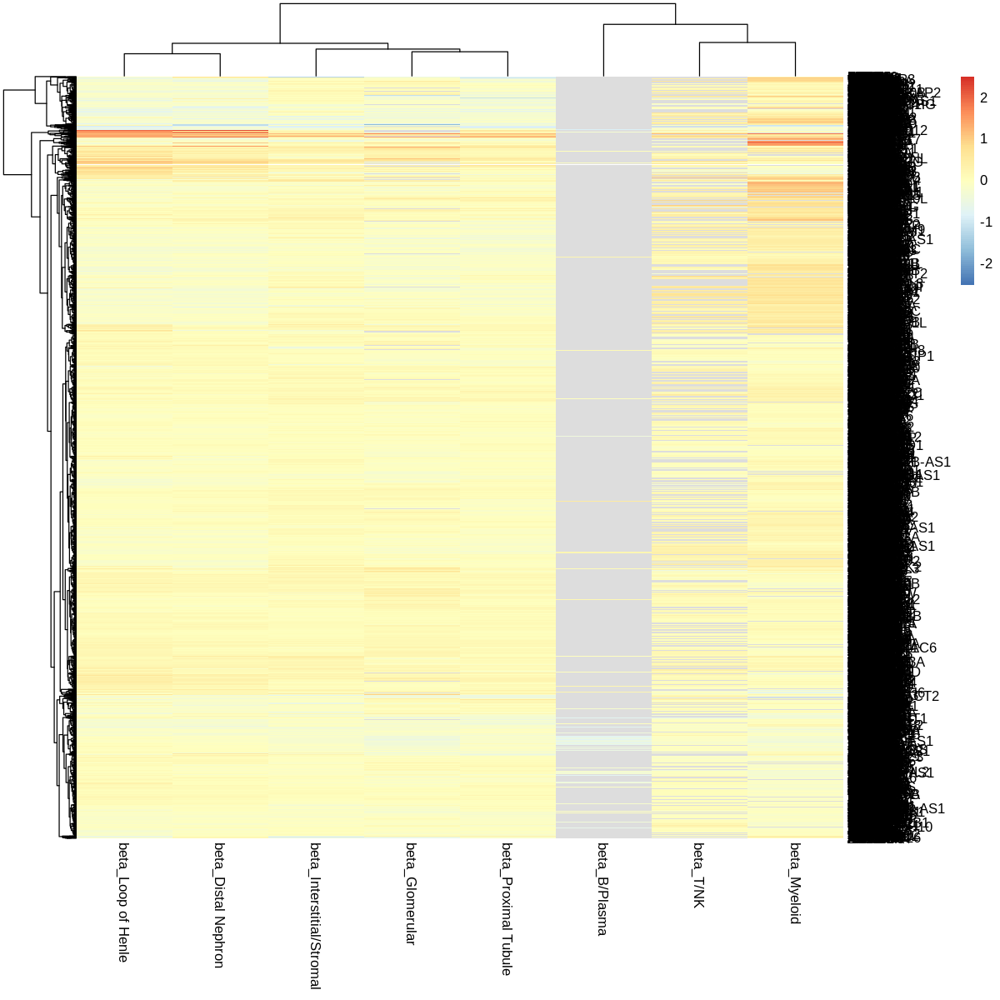

In [215]:
fig.size(10, 10)
pheatmap(dat)

In [216]:
dat = (res_all_wide %>% dplyr::select(starts_with('padj'))) < 0.05

# filter to at least 1 significant gene
dat = replace(dat, is.na(dat), FALSE)
genes_show = rownames(dat)[rowSums(dat)>3]

dat = res_all_wide %>% dplyr::select(starts_with('beta'))
dat = dat[genes_show, ]
dat = dat[!(rowSums(is.na(dat)) > 2), ]
dat %>% dim

[1] 219   8

In [217]:
dat %>% dim

[1] 219   8

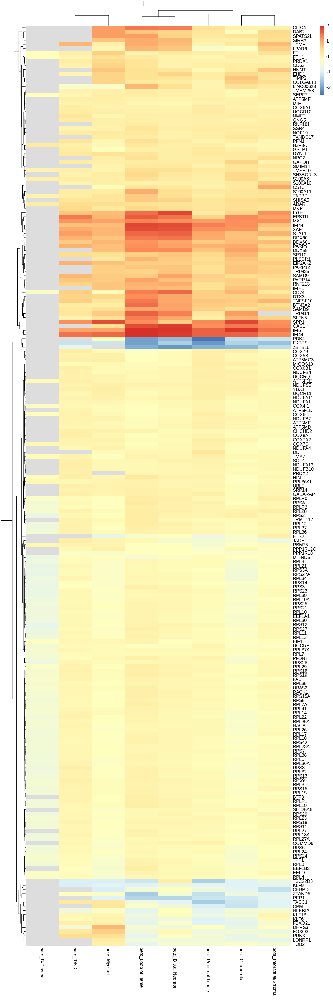

In [218]:
fig.size(30, 10)
pheatmap(dat)

In [306]:
for (ctype in celltypes) {
    print(ctype)
}

[1] "T/NK"
[1] "B/Plasma"
[1] "Myeloid"
[1] "Glomerular"
[1] "Interstitial/Stromal"
[1] "Loop of Henle"
[1] "Distal Nephron"
[1] "Proximal Tubule"


[1] "T/NK"
[1] "Upregulated"
 [1] "SPEN"     "RPS6KA1"  "GBP5"     "TRAF3IP3" "LYST"     "MAL"     
 [7] "PSD4"     "CX3CR1"   "TIGIT"    "IGFBP7"   "GRK6"     "YWHAZ"   
[13] "VCP"      "SH2D3C"   "PTPN6"    "PTPN11"   "TPP2"     "RASA3"   
[19] "PSME2"    "DDHD1"    "SPTLC2"   "ANXA2"    "CSK"      "CYLD"    
[25] "CNN2"     "TPM4"     "POU2F2"   "P2RY8"    "SASH3"   
[1] "Downregulated"
 [1] "LINC00623" "ZFP36L2"   "TUBA4A"    "CXCR6"     "GPR171"    "IL7R"     
 [7] "PTGER4"    "TMEM173"   "PNRC1"     "PRDM1"     "CRYBG1"    "IFNGR1"   
[13] "SYTL3"     "LEPROTL1"  "ANAPC16"   "CD69"      "FKBP11"    "GLIPR1"   
[19] "GPR65"     "APBA2"     "SNHG9"     "SOCS1"     "HNRNPL"    "PIK3IP1"  
[1] "Myeloid"
[1] "Upregulated"
  [1] "RERE"      "PIK3CD"    "DHRS3"     "TMEM51"    "PLEKHM2"   "ARHGEF10L"
  [7] "FUCA1"     "EPB41"     "RNF19B"    "HIVEP3"    "YBX1"      "MKNK1"    
 [13] "OSBPL9"    "LRRC8C"    "CEPT1"     "PDE4DIP"   "ARNT"      "ARHGEF11" 
 [19] "ATP1B1"    "NPL"       "RG

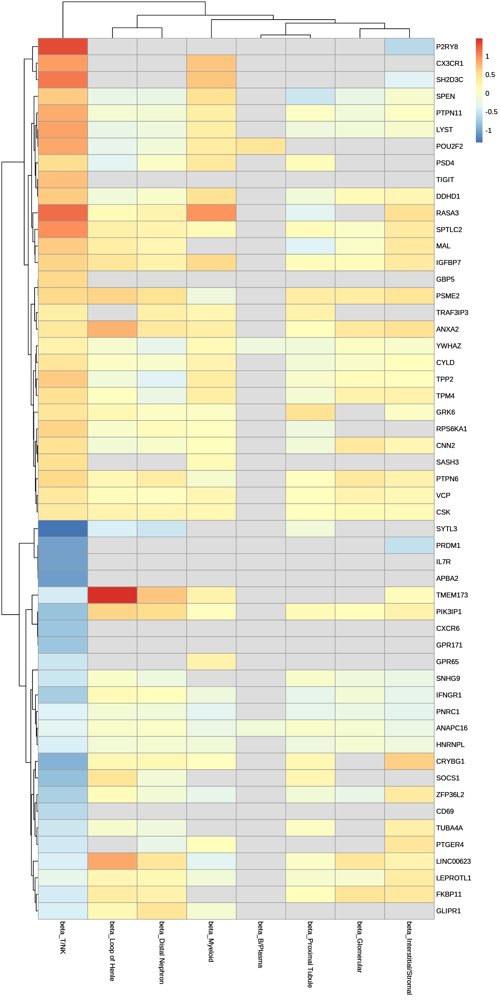

[1] "Glomerular"
[1] "Upregulated"
 [1] "MXRA8"    "PTPRF"    "RAB3B"    "PGM1"     "GADD45A"  "SHC1"    
 [7] "ENAH"     "GALNT2"   "C1orf198" "ITGB1BP1" "CMTM6"    "DAG1"    
[13] "DCBLD2"   "MYLK"     "GOLIM4"   "LAP3"     "SNCA"     "MAP1B"   
[19] "NREP"     "HBEGF"    "DBN1"     "PDLIM7"   "TMEM63B"  "OGFRL1"  
[25] "TCF21"    "FKBP9"    "CALU"     "DLC1"     "SLC25A37" "MAL2"    
[31] "GSN"      "LRRC8A"   "ETS1"     "AMIGO2"   "HSP90B1"  "NUAK1"   
[37] "MLEC"     "DNAJC3"   "PDIA3"    "TMED3"    "FAM234A"  "CPD"     
[43] "ITGA3"    "RAB31"    "GALNT1"   "MFSD12"   "AXL"      "PMEPA1"  
[49] "RHBDD3"   "DESI1"   
[1] "Downregulated"
 [1] "TUT4"       "STXBP3"     "LONRF2"     "ZC3H6"      "NIFK-AS1"  
 [6] "BIN1"       "TGFBR2"     "IFT57"      "GOLGB1"     "ADCY5"     
[11] "VEPH1"      "RGS12"      "CDS1"       "PTPN13"     "TET2"      
[16] "ARHGAP10"   "MTMR12"     "NPR3"       "ITGA1"      "PNISR"     
[21] "ENPP1"      "PLAGL1"     "AL009176.1" "AC083862.3" "AC004889.1"


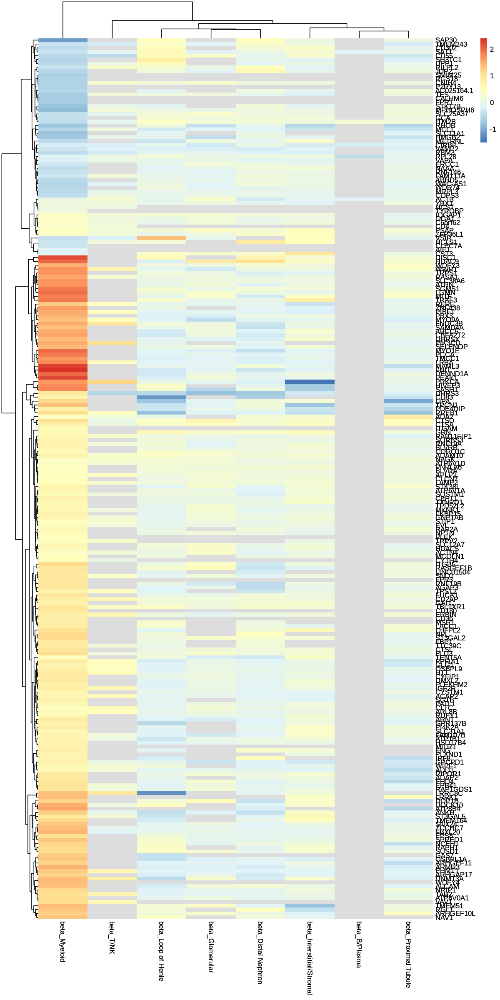

[1] "Interstitial/Stromal"
[1] "Upregulated"
  [1] "PGD"       "FBXO44"    "TNFRSF1B"  "ZNF436"    "RSRP1"     "LDLRAP1"  
  [7] "MAN1C1"    "SLC9A1"    "YTHDF2"    "TMEM39B"   "KIAA1522"  "TIE1"     
 [13] "TMED5"     "CAPZA1"    "MOV10"     "CTSK"      "S100A16"   "ARHGEF2"  
 [19] "F11R"      "MPZL1"     "SFT2D2"    "GORAB"     "PLA2G4A"   "CFH"      
 [25] "CD34"      "HLX"       "CNRIP1"    "RAB11FIP5" "TTL"       "CYBRD1"   
 [31] "COL3A1"    "SLC40A1"   "HSPE1"     "BOK"       "SEC13"     "ZDHHC3"   
 [37] "CCDC80"    "HCLS1"     "LXN"       "ATP13A3"   "TNK2"      "KLF3"     
 [43] "PCDH18"    "SMAD1"     "VEGFC"     "C7"        "ZNF608"    "SLC12A2"  
 [49] "CXCL14"    "TBC1D9B"   "MGAT1"     "DSP"       "TUBB"      "HSPA1A"   
 [55] "TNXB"      "CLIC5"     "RAB23"     "PGM3"      "CRYBG1"    "CD24"     
 [61] "MARCKS"    "SMPDL3A"   "RSPO3"     "ECHDC1"    "CHST12"    "THSD7A"   
 [67] "HGF"       "SEMA3D"    "GNG11"     "COL1A2"    "PCOLCE"    "NOS3"     
 [73] "LEPROTL1"  "

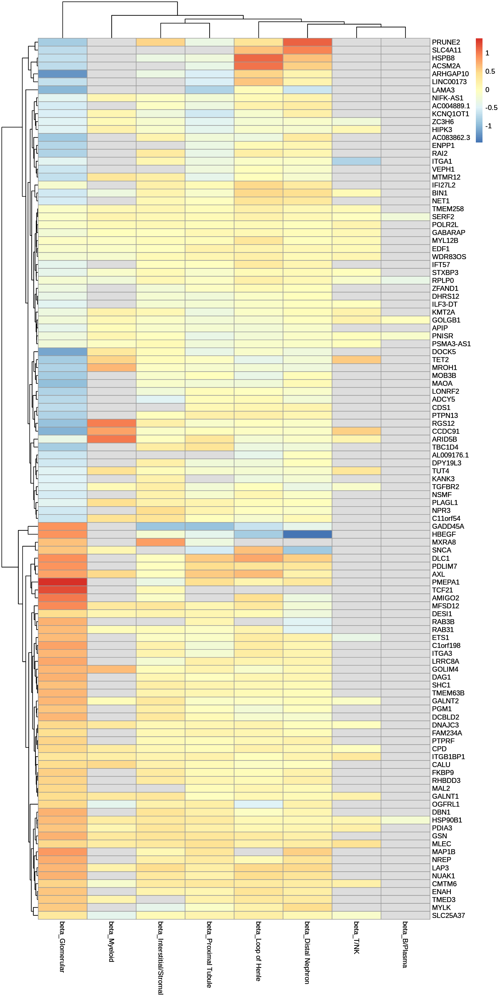

[1] "Loop of Henle"
[1] "Upregulated"
  [1] "TNFRSF14"     "CENPS"        "FBXO6"        "NECAP2"       "NBPF1"       
  [6] "UBXN10"       "RPL11"        "GALE"         "RCAN3"        "PTAFR"       
 [11] "ATP5IF1"      "SYNC"         "ATP6V0B"      "BEST4"        "TXNDC12"     
 [16] "LINC01781"    "SNX7"         "CSF1"         "DENND2D"      "MAB21L3"     
 [21] "MTMR11"       "TDRKH-AS1"    "S100A1"       "RPS27"        "DPM3"        
 [26] "DUSP23"       "MPC2"         "RABGAP1L-IT1" "PAPPA2"       "QSOX1"       
 [31] "MR1"          "IVNS1ABP"     "ELF3"         "UBE2T"        "NENF"        
 [36] "SMYD2"        "AIDA"         "TMEM63A"      "GUK1"         "RNF187"      
 [41] "ADSS"         "SCCPDH"       "SH3BP5L"      "PXDN"         "TRIB2"       
 [46] "LRATD1"       "KRTCAP3"      "SLC1A4"       "PCBP1"        "MTHFD2"      
 [51] "SLC35F5"      "SCTR"         "MYO7B"        "PTPN18"       "LYPD1"       
 [56] "KIF5C"        "RND3"         "SCN3A"        "GALNT3"       "HOXD

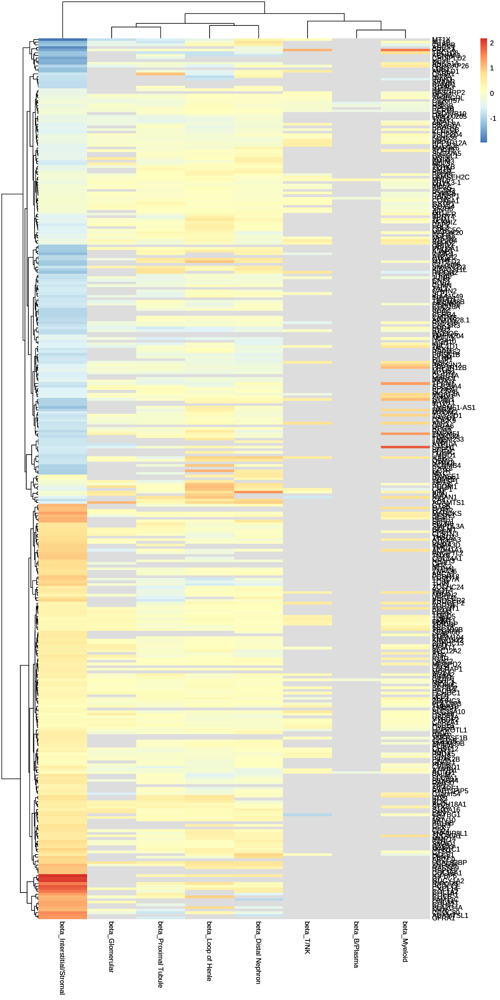

[1] "Distal Nephron"
[1] "Upregulated"
  [1] "MMEL1"        "AL513320.1"   "TNFRSF25"     "C1orf167"     "AL031293.1"  
  [6] "FBLIM1"       "ARHGEF19"     "CPLANE2"      "ATP13A2"      "AKR7A2"      
 [11] "RNF186"       "WNT4"         "NCMAP"        "AL031280.1"   "UBXN11"      
 [16] "TRNP1"        "THEMIS2"      "XKR8"         "SESN2"        "RCC1"        
 [21] "MARCKSL1"     "TMEM54"       "TMEM35B"      "LSM10"        "CDCA8"       
 [26] "C1orf122"     "RHBDL2"       "MYCL"         "ZFP69B"       "RIMKLA"      
 [31] "ZMYND12"      "CLDN19"       "ZNF691"       "SLC2A1"       "CFAP57"      
 [36] "TMEM125"      "C1orf210"     "CCDC24"       "LINC00853"    "BEND5"       
 [41] "GPX7"         "CZIB"         "AL606760.1"   "LRP8"         "TMEM59"      
 [46] "LINC02778"    "AC099791.2"   "ANGPTL3"      "AK4"          "AL359504.2"  
 [51] "GBP1"         "GCLM"         "BCL2L15"      "TRIM45"       "ECM1"        
 [56] "FALEC"        "RFX5"         "RIIAD1"       "CREB3L4"      "ADA

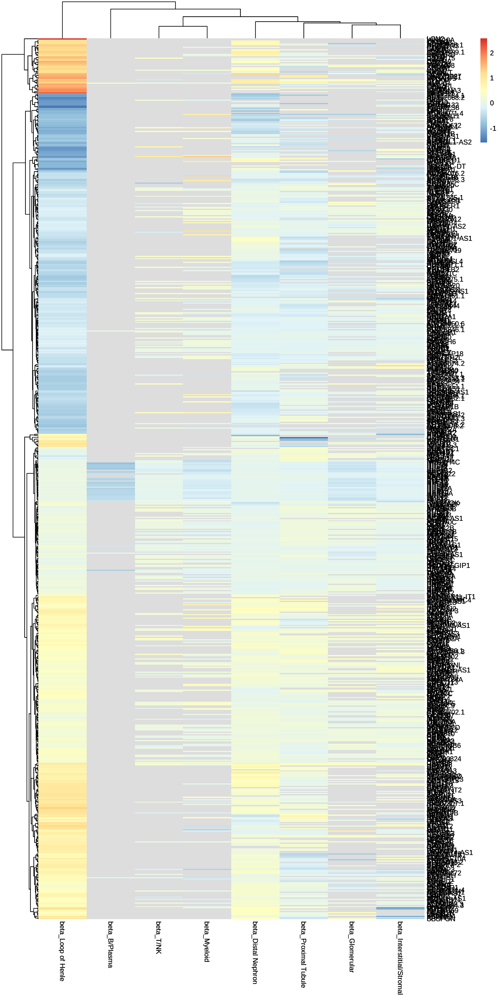

[1] "Proximal Tubule"
[1] "Upregulated"
 [1] "PLCH2"      "MICOS10"    "FMO5"       "SLC26A9"    "AGT"       
 [6] "VSNL1"      "FAM98A"     "AC008074.2" "PAIP2B"     "COX5B"     
[11] "LINC01159"  "ATP5MC3"    "SATB2"      "SLC23A3"    "SLC22A13"  
[16] "TMA7"       "TOMM70"     "NDUFB4"     "TM4SF18"    "RARRES1"   
[21] "SCHIP1"     "THPO"       "ATP5ME"     "UCHL1"      "SLC39A8"   
[26] "UGT8"       "GUCY1A1"    "SLC6A18"    "OXCT1"      "COX7C"     
[31] "SLCO4C1"    "UQCRQ"      "HAVCR2"     "F12"        "C2"        
[36] "CYP21A2"    "SLC22A7"    "CRIP3"      "COX7A2"     "MTRES1"    
[41] "TPD52L1"    "FILNC1"     "NDUFA4"     "STEAP1"     "LHFPL3-AS2"
[46] "AC073346.1" "TFEC"       "TMEM176A"   "B4GALT1"    "RORB"      
[51] "CKS2"       "RNF183"     "PAPPA"      "BRINP1"     "PTER"      
[56] "LINC01517"  "MORN4"      "ENTPD7"     "ATP5MD"     "RASSF10"   
[61] "AL049629.1" "TIMM8B"     "ADAMTS15"   "BEST3"      "CHST11"    
[66] "TMEM263"    "MVK"        "CABP1"      "COMMD

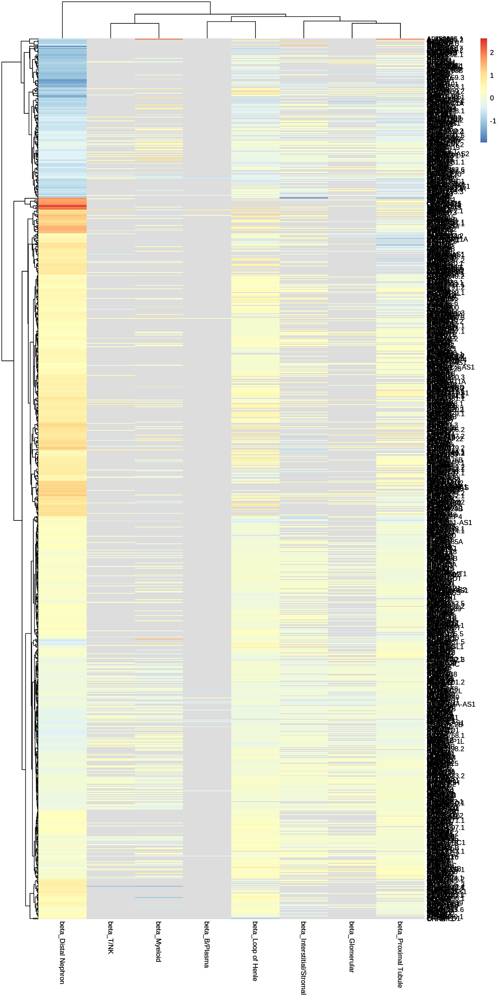

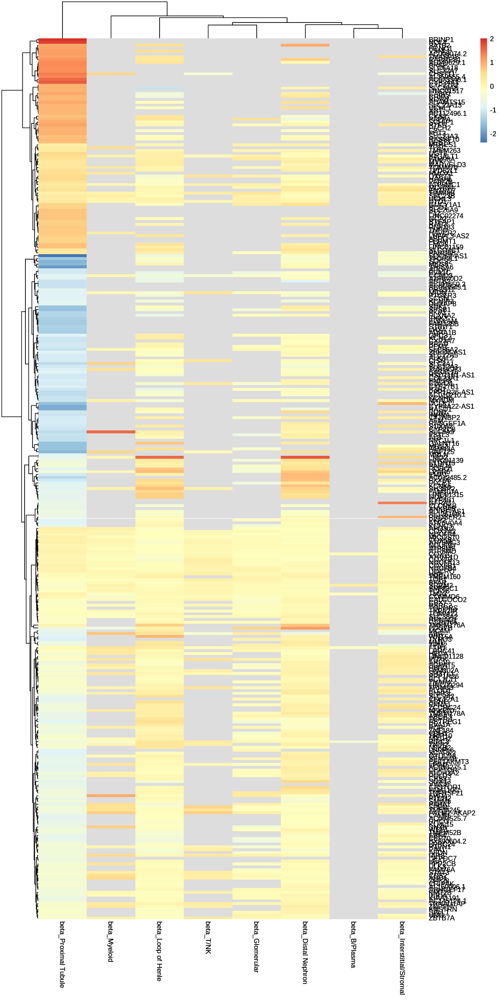

In [334]:
for (ctype in celltypes){
    if (ctype == 'B/Plasma'){next}
    
    genelist = ((res_all %>% filter(padj < 0.05, beta > 0))$gene %>% table)
    genelist = genelist[genelist== 1] %>% names
    genelist = (res_all %>% filter(gene %in% genelist, padj < 0.05, beta > 0, celltype == ctype))$gene
    sig_up_single = genelist
    
    genelist = ((res_all %>% filter(padj < 0.05, beta < 0))$gene %>% table)
    genelist = genelist[genelist== 1] %>% names
    genelist = (res_all %>% filter(gene %in% genelist, padj < 0.05, beta < 0, celltype == ctype))$gene
    sig_down_single = genelist

    dat = res_all_wide %>% dplyr::select(starts_with('beta'))
    dat = dat[c(sig_up_single, sig_down_single), ]
    # dat = dat[!(rowSums(is.na(dat)) > 2), ]
    dat %>% dim

    print(ctype)
    print('Upregulated')
    print(sig_up_single)
    print('Downregulated')
    print(sig_down_single)

    fig.size(20, 10)
    print(pheatmap(dat))
}

In [111]:
ctype

[1] "B/Plasma"

In [90]:
ctype = 'Glomerular'

In [72]:
qcd_raw = qcd_raw_tissue[, qcd_meta$cell]


In [70]:
colnames(qcd_raw) = qcd_meta$sample

In [76]:
pseudo_raw = pseudobulk(qcd_raw, qcd_meta$sample)

In [77]:
pseudo_raw %>% dim

[1] 36601   233

In [83]:
genes = rownames(pseudo_raw)[rowSums(pseudo_raw > genecount_thresh) > ndonor_thresh]

In [85]:
print(length(genes))

[1] 7458


[1] 1

In [87]:
system.time(
suppressMessages({
suppressWarnings({
    res_list = future_lapply(genes, future.seed = TRUE, function(gene){
    res = data.frame()
        
    gene_expr = pseudo_raw[gene, ]

    null = glm.nb(gene_expr ~ offset(log(ncounts)), data = sample_meta)
    full = glm.nb(gene_expr ~ Type + offset(log(ncounts)), data = sample_meta)
    b = full$coefficients[['TypeLN']]
    pval = anova(full, null)[2, 'Pr(Chi)']
    res = rbind(res, data.frame('gene' = gene, 'beta' = b,  'p' = pval))       
    return(res)
    })})})
)

res = do.call("rbind", res_list)
res['celltype'] = ctype
res$padj = p.adjust(res$p, method = "bonferroni")

name = ctype_list[[ctype]][3]

saveRDS(res, paste0(outdir, name, '_case_control_differential_expression_20250303.rds'))

In [95]:
paste0(outdir, outname)

[1] "../../data/tissue/glom_case_control_differential_expression_20250303.txt"

## T/NK

In [3]:
qcd_meta <-readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations02062024.rds')
qcd_raw <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_rawcounts_03062023.rds')
qcd_raw <- qcd_raw[, qcd_meta$cell]

# qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_08112024.rds')
# qcd_norm <- qcd_norm[, qcd_meta$cell]

In [4]:
qcd_raw_rename = qcd_raw
colnames(qcd_raw_rename) = qcd_meta$sample

In [5]:
qcd_meta %>% dim
qcd_raw_rename %>% dim

[1] 37510    52

[1] 36601 37510

In [7]:
# Convert group labels into a sparse indicator matrix
group_levels <- unique(qcd_meta$sample)
group_matrix <- sparseMatrix(
  i = match(qcd_meta$sample, group_levels), 
  j = seq_len(nrow(qcd_meta)), 
)

# Perform sparse matrix multiplication to sum within groups
pseudo_raw <- group_matrix %*% (qcd_raw_rename %>% t)

# Assign row names to match groups
rownames(pseudo_raw) <- group_levels

pseudo_raw = pseudo_raw %>% t

In [8]:
ncounts = colSums(pseudo_raw)

sample_meta = qcd_meta[!duplicated(qcd_meta$sample), ]

rownames(sample_meta) = sample_meta$sample

sample_meta$ncounts <- ncounts

In [32]:
ndonor_thresh = round(nrow(sample_meta)*.9) #round(nrow(sample_meta)/2)
genecount_thresh = 0

In [82]:
# log_counts = log10(pseudo_raw + 1)

In [83]:
# log_counts %>% dim

[1] 36601   227

In [88]:


# gene = genes[1]



In [13]:
parallel::detectCores()


[1] 96

In [14]:
library(future)
library(future.apply)

plan(multicore, workers = 30)

In [34]:
genes = rownames(pseudo_raw)[rowSums(pseudo_raw > genecount_thresh) > ndonor_thresh]



In [35]:
genes %>% length

[1] 3771

In [59]:
genes = rownames(pseudo_raw)[rowSums(pseudo_raw > genecount_thresh) > ndonor_thresh]
print(genes %>% length)
system.time(
suppressMessages({
suppressWarnings({
    res_list = future_lapply(genes, future.seed = TRUE, function(gene){
    res = data.frame()
        
    gene_expr = pseudo_raw[gene, ]

    null = glm.nb(gene_expr ~ offset(log(ncounts)), data = sample_meta)
    full = glm.nb(gene_expr ~ Type + offset(log(ncounts)), data = sample_meta)
    b = full$coefficients[['TypeLN']]
    pval = anova(full, null)[2, 'Pr(Chi)']
    res = rbind(res, data.frame('gene' = gene, 'beta' = b,  'p' = pval))       
    
    return(res)
    }
)
}
)}
))


[1] 3771


   user  system elapsed 
 46.219   8.677  13.143 

In [60]:
res = do.call("rbind", res_list)
res['celltype'] = 'T/NK'
res$padj = p.adjust(res$p, method = "bonferroni")

In [61]:
saveRDS(res, '../../data/tissue/TNK_case_control_differential_expression_20250303.txt')

In [4]:
res = readRDS('../../data/tissue/TNK_case_control_differential_expression_20250303.txt')

In [171]:
getwd()

[1] "/data/srlab/ssg34/SLE_kidney_v2/scripts/figure_notebooks"

In [127]:
# write.table(
#   res,
#   file = '../data/tissue/TNK_case_control_differential_expression_20250303.txt',
#   sep = "\t",             
#   row.names = TRUE,       
#   col.names = TRUE,      
#   quote = FALSE)


- Filter out donors w < 10 cells
- Include only genes in 90-99% of samples

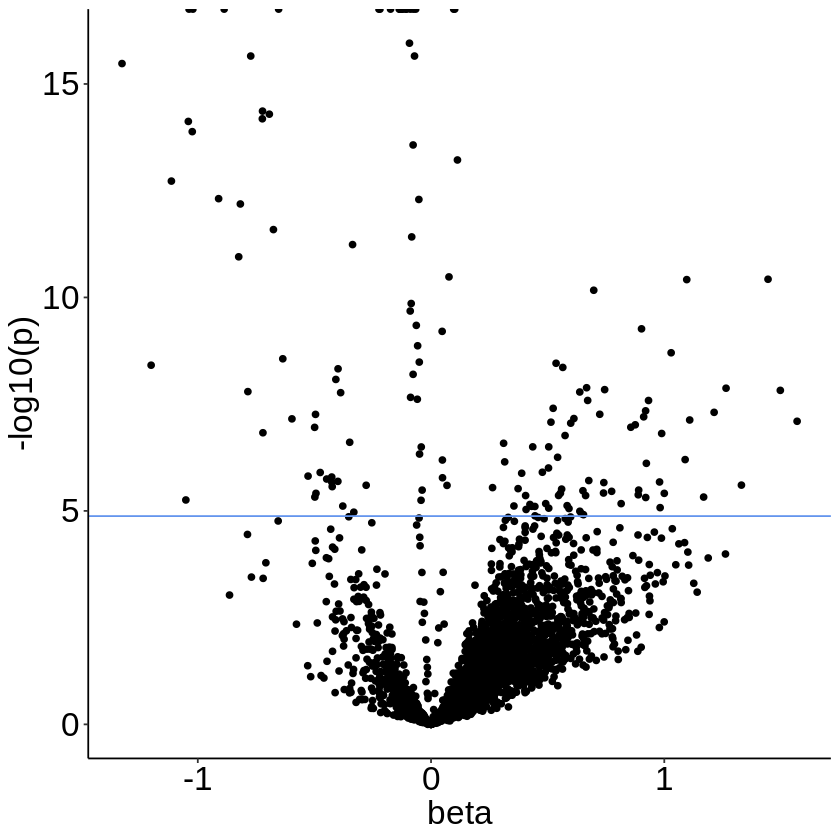

In [62]:
ggplot(res)+
    geom_point(aes(x = beta, y = -log10(p)))+
    theme_classic()+
    theme(text=element_text(family="Arial"),
    legend.position = "none",
    panel.grid = element_blank(),
    axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
    axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
    axis.title = element_text(size=labelfontsize, hjust = 0.5),
    # axis.line.x.bottom = element_line(color = 'black'),
    # axis.line.y.left   = element_line(color = 'black'),
    # plot.margin = margin(10, 40, 10, 10)
    )+
    geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue')

Warning message:
“Removed 3658 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”
Warning message:
“ggrepel: 58 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


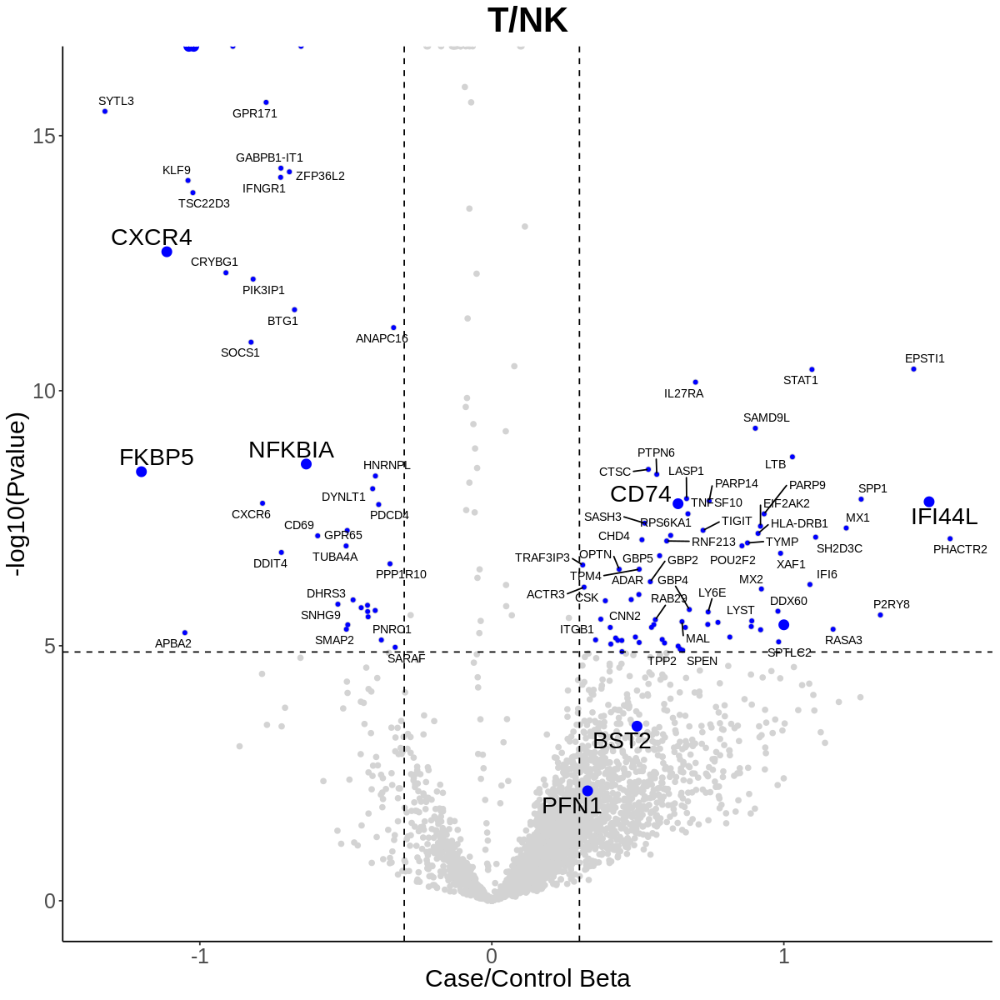

In [6]:
genes_label <- c("CXCR4", "NFKBIA", "IL7R", "FKBP5", "PRDM1", 
           "BST2", "PFN1", "CD74", "ISG15", "IFI44L")
res_new = res %>% mutate(Beta =beta, LRP = p)
fig.size(10, 10)
ggplot(res_new,
                aes(x = Beta, y = -log10(LRP))) +
    geom_point(colour = 'lightgrey') + 
    geom_point(data = res_new %>% filter(LRP < 0.05/nrow(res_new) & abs(Beta) >= 0.3,
                                        ! gene %in% genes_label),
                   aes(x = Beta, y = -log10(LRP)),  color = "blue", size = 1) +
    geom_point(data = res_new %>% filter(gene %in% genes_label),
                   aes(x = Beta, y = -log10(LRP)),  color = "blue", size = 3)  + 
    geom_vline(xintercept = c(-0.3, 0.3), linetype = "dashed") + 
    geom_hline(yintercept = -log10(0.05/nrow(res_new)), linetype = "dashed") + 
    theme_classic() + 
    theme(legend.position = "none",
          axis.text = element_text(size = 15),
          axis.title = element_text(size = 18),
          plot.title = element_text(size = 25, hjust = 0.5, face = "bold")) +
    ggrepel::geom_text_repel(data = res_new %>% 
                                     mutate(label = ifelse(LRP < 0.05/nrow(res_new) & abs(Beta) >= 0.3 | 
                                                           gene %in% genes_label, gene, NA),
                                            label_size = ifelse(gene %in% genes_label, 6 , 3)),
                                     aes(x = Beta, y = -log10(LRP), 
                                         size = label_size, label = label)
            , color = "black") +
    scale_size_identity() + 
    labs(x = "Case/Control Beta", y = "-log10(Pvalue)", title = "T/NK")

In [237]:
res %>% filter(padj < 0.05) %>% arrange(beta)

gene,beta,p,celltype,padj
<chr>,<dbl>,<dbl>,<chr>,<dbl>
AL096865.1,-1.4942097,1.080127e-08,T/NK,1.294532e-04
IL2,-1.3514943,7.625308e-07,T/NK,9.138931e-03
SYTL3,-1.3249160,3.330669e-16,T/NK,3.991807e-12
FKBP5,-1.2000231,3.869015e-09,T/NK,4.637014e-05
GLUL,-1.1312205,0.000000e+00,T/NK,0.000000e+00
CXCR4,-1.1131518,1.885159e-13,T/NK,2.259363e-09
MTRNR2L8,-1.0582680,1.755077e-06,T/NK,2.103460e-02
MS4A1,-1.0455993,6.293087e-08,T/NK,7.542264e-04
KLF9,-1.0405522,7.549517e-15,T/NK,9.048096e-11


In [236]:
res %>% filter(padj < 0.05) %>% arrange(desc(beta)) %>% head(40)

,gene,beta,p,celltype,padj
,<chr>,<dbl>,<dbl>,<chr>,<dbl>
1,ENPEP,30.805945,1.576371e-10,T/NK,1.889281e-06
2,CLDN2,26.729542,8.738356e-07,T/NK,1.047292e-02
3,RBMS3,4.372718,3.034607e-07,T/NK,3.636977e-03
4,DLGAP1,4.201802,2.952460e-07,T/NK,3.538523e-03
5,TSHZ2,4.127495,1.322250e-10,T/NK,1.584717e-06
6,IGLC2,4.048043,0.000000e+00,T/NK,0.000000e+00
7,NOX4,4.035225,6.136735e-07,T/NK,7.354876e-03
8,IGHG1,3.731865,0.000000e+00,T/NK,0.000000e+00
9,IGKC,3.582729,0.000000e+00,T/NK,0.000000e+00


In [321]:
res %>% arrange(desc(beta)) %>% head(40)

,gene,beta,p,celltype,padj
,<chr>,<dbl>,<dbl>,<chr>,<dbl>
1,GPT,33.294024,4.305286e-05,T/NK,5.159886e-01
2,ADGRA3,32.537774,1.590423e-05,T/NK,1.906122e-01
3,ENPEP,30.805945,1.576371e-10,T/NK,1.889281e-06
4,TNFRSF11B,29.352589,1.213359e-05,T/NK,1.454211e-01
5,CLDN2,26.729542,8.738356e-07,T/NK,1.047292e-02
6,RBMS3,4.372718,3.034607e-07,T/NK,3.636977e-03
7,DLGAP1,4.201802,2.952460e-07,T/NK,3.538523e-03
8,TSHZ2,4.127495,1.322250e-10,T/NK,1.584717e-06
9,IGLC2,4.048043,0.000000e+00,T/NK,0.000000e+00


In [326]:
top_genes = (res %>% arrange(desc(beta)) %>% head(5))$gene

In [328]:
pseudo_raw[top_genes, ] %>% rowSums

GPT    ADGRA3     ENPEP TNFRSF11B     CLDN2 
      315       330      1274       418       552

In [331]:
(pseudo_raw[top_genes, ]>0) %>% rowSums

GPT    ADGRA3     ENPEP TNFRSF11B     CLDN2 
      115       115       144       115       121

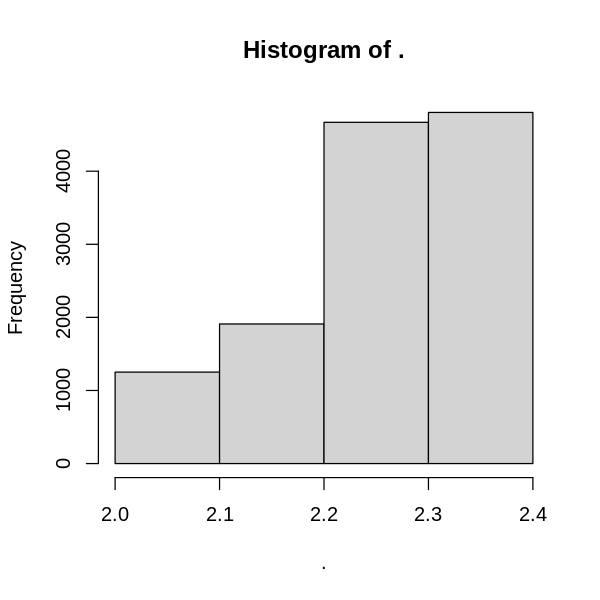

In [348]:
(pseudo_raw[genes, ]>0) %>% rowSums %>% log10 %>% hist(breaks = 4)

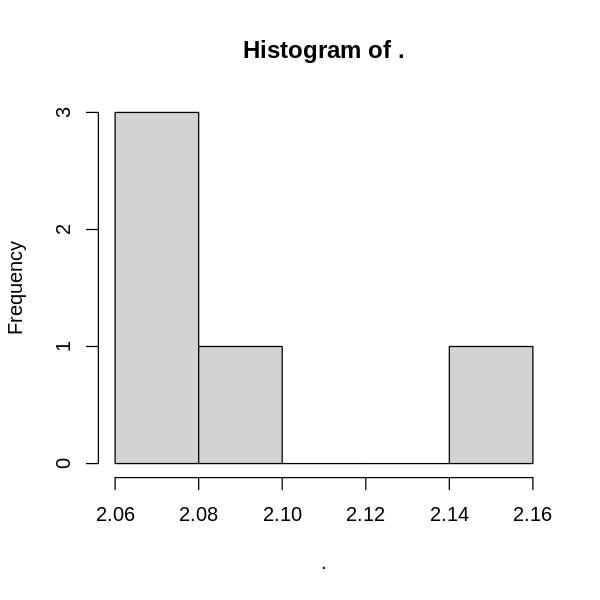

In [349]:
(pseudo_raw[top_genes, ] > 0) %>% rowSums %>% log10 %>% hist(breaks = 4)

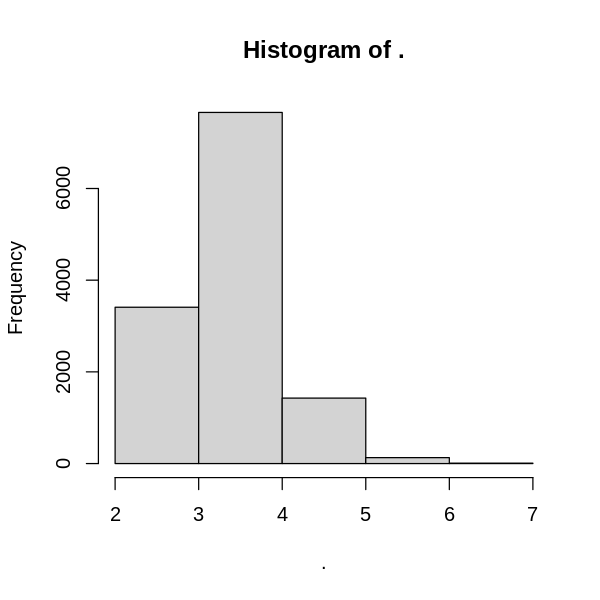

In [346]:
(pseudo_raw[genes, ]) %>% rowSums %>% log10 %>% hist(breaks = 4)

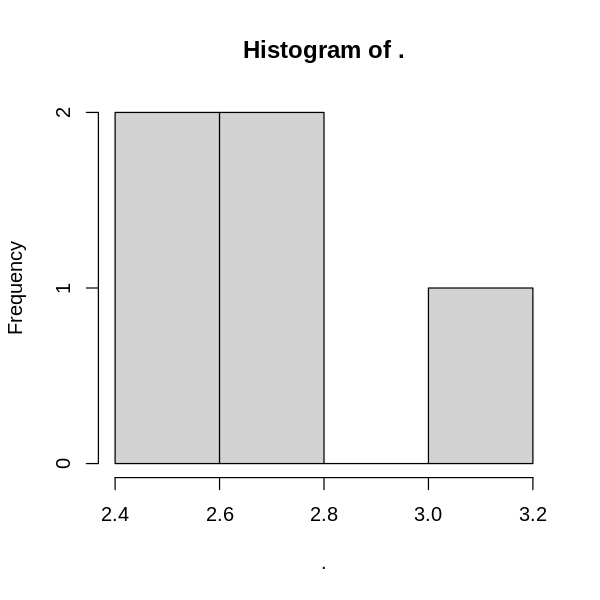

In [347]:
(pseudo_raw[top_genes, ]) %>% rowSums %>% log10 %>% hist(breaks = 4)

## B/Plasma

In [7]:
qcd_meta <-readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_annotations_09232022.rds')
qcd_raw <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/B_Plasma_clusterQCd_rawcounts_03102023.rds')
qcd_raw <- qcd_raw[, qcd_meta$cell]

# qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_08112024.rds')
# qcd_norm <- qcd_norm[, qcd_meta$cell]

In [8]:
qcd_raw_rename = qcd_raw
colnames(qcd_raw_rename) = qcd_meta$sample

In [9]:
qcd_meta %>% dim
qcd_raw_rename %>% dim

[1] 13423    51

[1] 36601 13423

In [10]:
library(Matrix)


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack




In [11]:
# Convert group labels into a sparse indicator matrix
group_levels <- unique(qcd_meta$sample)
group_matrix <- sparseMatrix(
  i = match(qcd_meta$sample, group_levels), 
  j = seq_len(nrow(qcd_meta)), 
)

# Perform sparse matrix multiplication to sum within groups
pseudo_raw <- group_matrix %*% (qcd_raw_rename %>% t)

# Assign row names to match groups
rownames(pseudo_raw) <- group_levels

pseudo_raw = pseudo_raw %>% t

In [12]:
ncounts = colSums(pseudo_raw)

sample_meta = qcd_meta[!duplicated(qcd_meta$sample), ]

rownames(sample_meta) = sample_meta$sample

sample_meta$ncounts <- ncounts

In [274]:
# # sanity check
# # Sum raw counts manually for a sample (e.g., "Sample_1")
# sample_id = sample_meta$sample[1]

# # Subset original count matrix to the sample's cells
# cells_in_sample <- which(qcd_meta$sample == sample_id)
# manual_sum <- rowSums(qcd_raw[, cells_in_sample, drop = FALSE])

# # Compare to computed pseudobulk matrix
# computed_sum <- pseudo_raw[, sample_id]

# # Check if they match
# all.equal(manual_sum, computed_sum)  # Should return TRUE


[1] TRUE

In [82]:
# log_counts = log10(pseudo_raw + 1)

In [20]:
library(MASS)


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


The following object is masked from ‘package:patchwork’:

    area




In [83]:
# log_counts %>% dim

[1] 36601   227

In [88]:


# gene = genes[1]



In [17]:
parallel::detectCores()


[1] 96

In [18]:
library(future)
library(future.apply)

plan(multicore, workers = 30)

In [21]:
genes = rownames(pseudo_raw)[rowSums(pseudo_raw > genecount_thresh) > ndonor_thresh]
print(genes %>% length)
system.time(
suppressMessages({
suppressWarnings({
    res_list = future_lapply(genes, future.seed = TRUE, function(gene){
    res = data.frame()
        
    gene_expr = pseudo_raw[gene, ]

    null = glm.nb(gene_expr ~ offset(log(ncounts)), data = sample_meta)
    full = glm.nb(gene_expr ~ Type + offset(log(ncounts)), data = sample_meta)
    b = full$coefficients[['TypeLN']]
    pval = anova(full, null)[2, 'Pr(Chi)']
    res = rbind(res, data.frame('gene' = gene, 'beta' = b,  'p' = pval))       
    
    return(res)
    }
)
}
)}
))


[1] 229


   user  system elapsed 
 14.444  11.744   4.397 

In [22]:
celltype = 'B/Plasma'

In [23]:
res = do.call("rbind", res_list)

res['celltype'] = 'B/Plasma'

res$padj = p.adjust(res$p, method = "bonferroni")


In [24]:
saveRDS(res, '../../data/tissue/BP_case_control_differential_expression_20250303.txt')

In [25]:
res %>% dim

[1] 229   5

In [26]:
res %>% head

,gene,beta,p,celltype,padj
,<chr>,<dbl>,<dbl>,<chr>,<dbl>
1,RPL22,-0.5677442,0.005725015,B/Plasma,1.0000000
2,RPL11,-0.6567872,0.002414005,B/Plasma,0.5528073
3,RSRP1,-0.1909042,0.401646984,B/Plasma,1.0000000
4,SMAP2,-0.5974400,0.018230144,B/Plasma,1.0000000
5,RPS8,-0.6481223,0.003006951,B/Plasma,0.6885917
6,JAK1,0.1958016,0.554339799,B/Plasma,1.0000000


In [171]:
getwd()

[1] "/data/srlab/ssg34/SLE_kidney_v2/scripts/figure_notebooks"

In [127]:
# write.table(
#   res,
#   file = '../data/tissue/TNK_case_control_differential_expression_20250303.txt',
#   sep = "\t",             
#   row.names = TRUE,       
#   col.names = TRUE,      
#   quote = FALSE)


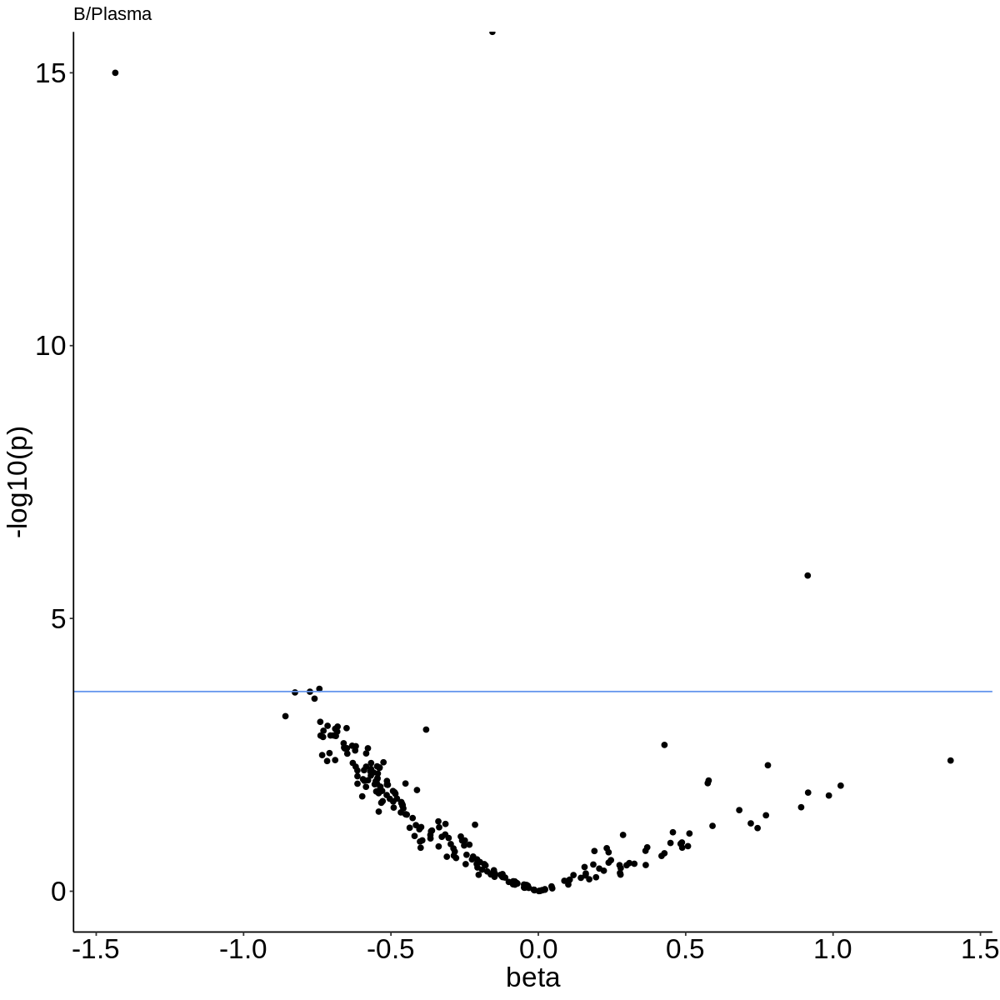

In [27]:
ggplot(res)+
    geom_point(aes(x = beta, y = -log10(p)))+
    theme_classic()+
    theme(text=element_text(family="Arial"),
    legend.position = "none",
    panel.grid = element_blank(),
    axis.text.x = element_text(color = "black", size = labelfontsize, hjust=0.5),
    axis.text.y = element_text(color = "black", size = labelfontsize, hjust=1),
    axis.title = element_text(size=labelfontsize, hjust = 0.5),
    # axis.line.x.bottom = element_line(color = 'black'),
    # axis.line.y.left   = element_line(color = 'black'),
    # plot.margin = margin(10, 40, 10, 10)
    )+
    geom_hline(yintercept = -log10(0.05/nrow(res)), color = 'cornflowerblue')+
    ggtitle(celltype)

In [263]:
res %>% filter(padj < 0.05) %>% arrange(beta)

gene,beta,p,celltype,padj
<chr>,<dbl>,<dbl>,<chr>,<dbl>
TNF,-2.5304920,2.833377e-09,B/Plasma,2.532189e-05
MTRNR2L8,-1.9056106,1.616439e-06,B/Plasma,1.444611e-02
H1FX,-1.5588891,0.000000e+00,B/Plasma,0.000000e+00
LINC01781,-1.4964029,1.805300e-06,B/Plasma,1.613397e-02
TXNIP,-1.4352632,9.992007e-16,B/Plasma,8.929857e-12
DDIT4,-1.4263494,3.979163e-06,B/Plasma,3.556178e-02
CXCR4,-1.3491677,1.402039e-07,B/Plasma,1.253002e-03
TSC22D3,-1.2761037,5.816879e-08,B/Plasma,5.198544e-04
DEFB1,-1.2727348,9.882562e-08,B/Plasma,8.832046e-04


In [264]:
res %>% filter(padj < 0.05) %>% arrange(desc(beta)) %>% head(40)

,gene,beta,p,celltype,padj
,<chr>,<dbl>,<dbl>,<chr>,<dbl>
1,IGLV6-57,2.0499542,0.000000e+00,B/Plasma,0.000000e+00
2,IGLC1,1.0702250,0.000000e+00,B/Plasma,0.000000e+00
3,SUB1,0.9139896,1.636073e-06,B/Plasma,1.462158e-02
4,IGHG4,0.8448899,0.000000e+00,B/Plasma,0.000000e+00
5,IGLC2,0.3637641,0.000000e+00,B/Plasma,0.000000e+00
6,SSR4,0.2873693,7.771561e-16,B/Plasma,6.945444e-12
7,IGHG1,-0.0613673,7.705084e-08,B/Plasma,6.886033e-04
8,IGKC,-0.1558214,0.000000e+00,B/Plasma,0.000000e+00
9,DEFB1,-1.2727348,9.882562e-08,B/Plasma,8.832046e-04


In [265]:
res %>% arrange(desc(beta)) %>% head(40)

,gene,beta,p,celltype,padj
,<chr>,<dbl>,<dbl>,<chr>,<dbl>
1,DLEU2,36.91548,1.043567e-05,B/Plasma,0.09326359
2,WDR37,36.63643,2.427483e-03,B/Plasma,1.00000000
3,NUP214,36.47044,2.229943e-04,B/Plasma,1.00000000
4,SOS2,36.38950,3.027061e-04,B/Plasma,1.00000000
5,SEC24B,36.37668,1.561093e-03,B/Plasma,1.00000000
6,RALGPS1,36.19774,2.039304e-03,B/Plasma,1.00000000
7,TESK2,36.19595,7.115912e-04,B/Plasma,1.00000000
8,TTC28,36.15307,1.142243e-03,B/Plasma,1.00000000
9,LINC02245,36.09958,1.189331e-04,B/Plasma,1.00000000
